# Q-factorisation on Gridworld Maze - Combined loss

In [ ]:
from pathlib import Path
import sys
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import matplotlib.pyplot as plt
import time
from copy import deepcopy


# Resolve repository src path robustly when running notebook in-place.
repo_root = Path.cwd()
while repo_root != repo_root.parent and not (repo_root / 'src').exists():
    repo_root = repo_root.parent
sys.path.insert(0, str(repo_root / 'src'))

from environments.atari_envs import make_atari_goal_env
from utils import set_seed, estimate_fisher_diag, compute_embedding_drift, collect_weight_snapshot
from visualisations import visualise_embeddings, visualise_q_table, print_goal_embedding_similarity, plot_full_embedding_dashboard_2d_html, plot_min_steps_and_min_time
from networks import snapshot_named_parameters, FactorisedDQN_QNetwork
from trainer import dqn_train_multi_loss


DEVICE = 'cuda' if torch.cuda.is_available() else ('mps' if torch.backends.mps.is_available() else 'cpu')
print('Using device:', DEVICE)


Using device: mps


In [ ]:
ENV_ID = "ALE/Breakout-v5"
FRAME_STACK = 4

goal_env = make_atari_goal_env(
    env_id=ENV_ID,
    frame_stack=FRAME_STACK,
    reward_mode="simple",
    flatten_obs=True,
)

goal_obs = goal_env.sample_goal(num_steps=2000, seed=42)
goal_env.close()

def make_env(goal_obs, maxhorizon=108_000):
    return make_atari_goal_env(
        env_id=ENV_ID,
        frame_stack=FRAME_STACK,
        goal_obs=goal_obs,
        reward_mode="simple",
        goal_radius=100.0,
        max_episode_steps=maxhorizon,
        flatten_obs=True,
    )

env_tmp = make_env(goal_obs)
obsdim = env_tmp.observation_space.shape[0]
numactions = env_tmp.action_space.n
goaldim = goal_obs.shape[0]
env_tmp.close()

## Training Loop across goals and seeds

Sampled GOALS: [(7, 7), (4, 1), (1, 1), (2, 5), (5, 3), (1, 3), (3, 1), (9, 5)]

================ SEED 42 ================


----- seed=42, goal=(7, 7) -----

[DQN-factorised] step=   1000 | eps=0.981 | eval_return=-9.875 | eval_len=100.0 | TD=0.000 | ReplayTD=0.000 | Ortho=0.000 | SigReg=0.000 | EWC=0.000000 | Loss=0.000| goal_reg_loss=0.0000
[DQN-factorised] step=   2000 | eps=0.962 | eval_return=-9.950 | eval_len=100.0 | TD=0.000 | ReplayTD=0.000 | Ortho=0.000 | SigReg=0.000 | EWC=0.000000 | Loss=0.000| goal_reg_loss=0.0000
[DQN-factorised] step=   3000 | eps=0.943 | eval_return=-9.975 | eval_len=100.0 | TD=0.000 | ReplayTD=0.000 | Ortho=0.000 | SigReg=0.000 | EWC=0.000000 | Loss=0.000| goal_reg_loss=0.0000
[DQN-factorised] step=   4000 | eps=0.924 | eval_return=-9.962 | eval_len=100.0 | TD=0.000 | ReplayTD=0.000 | Ortho=0.000 | SigReg=0.000 | EWC=0.000000 | Loss=0.000| goal_reg_loss=0.0000
[DQN-factorised] step=   5000 | eps=0.905 | eval_return=-9.762 | eval_len=100.0 | TD=0.004 | 

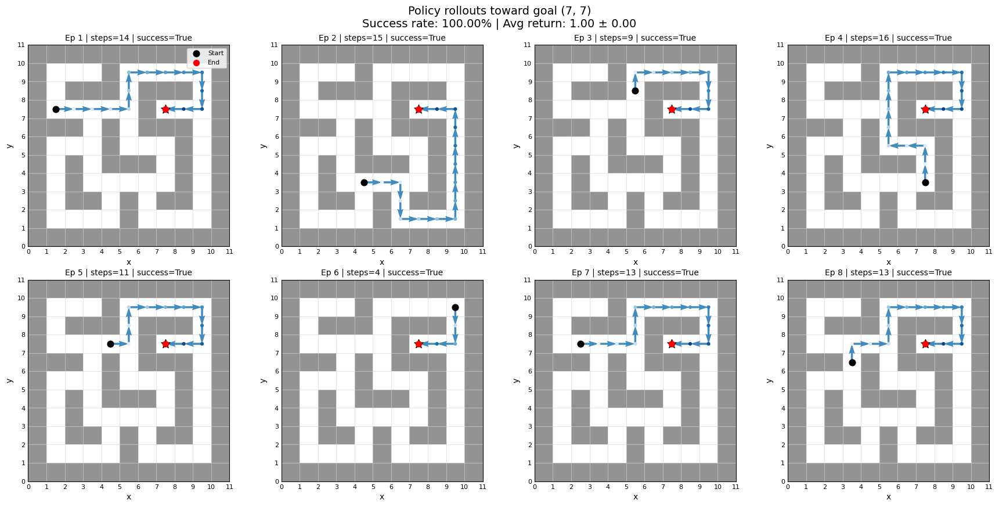

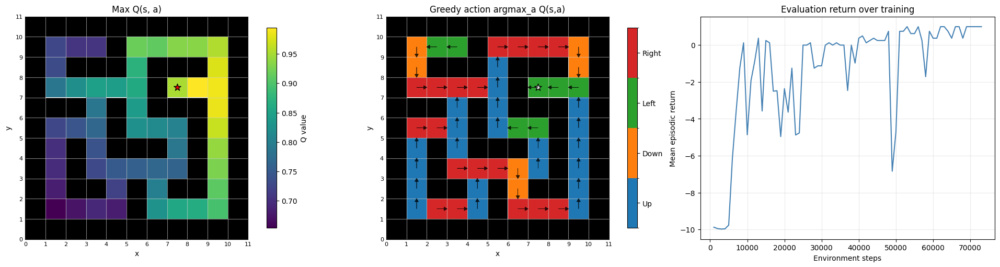

Embedding mode: all_discrete
states_base: (52, 2)
coords_base: (52, 2)
phi(s,a) base: (52, 4, 64)
psi(z) / task code base: (1, 64)
phi(s,a) norms: mean=1.0000, std=0.0000
top 5 singular values: [4.5454316 3.5842376 2.5813773 2.426999  1.8607732]
cumulative variance (first 5 dims): [0.33626008 0.54534304 0.6537927  0.7496586  0.8060109 ]
cos(phi(s,a), psi/task): mean=0.7613, std=0.1087


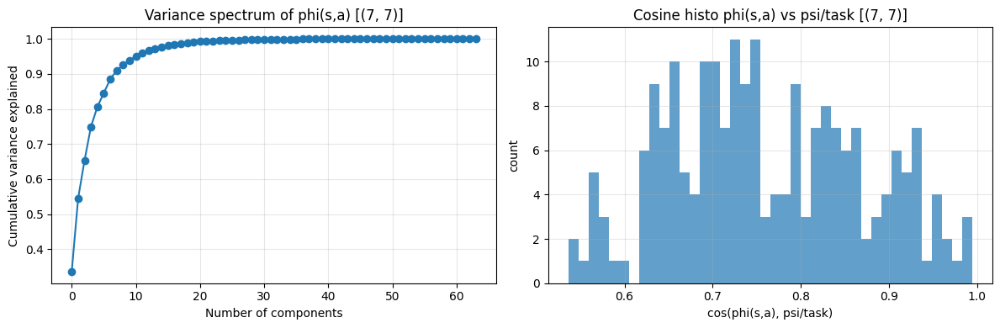


Goal embedding cosine similarity matrix:
     (7, 7)
  (7, 7)      1.000

----- seed=42, goal=(4, 1) -----

Mean squared deltas (first few): [0.0, 0.0, 0.0, 0.0]
[DQN-factorised] step=   1000 | eps=0.981 | eval_return=-7.887 | eval_len=87.8 | TD=0.000 | ReplayTD=0.000 | Ortho=0.000 | SigReg=0.000 | EWC=0.000000 | Loss=0.000| goal_reg_loss=0.0000
Mean squared deltas (first few): [0.0, 0.0, 0.0, 0.0]
[DQN-factorised] step=   2000 | eps=0.962 | eval_return=-8.787 | eval_len=100.0 | TD=0.000 | ReplayTD=0.000 | Ortho=0.000 | SigReg=0.000 | EWC=0.000000 | Loss=0.000| goal_reg_loss=0.0000
Mean squared deltas (first few): [0.0, 0.0, 0.0, 0.0]
[DQN-factorised] step=   3000 | eps=0.943 | eval_return=-8.725 | eval_len=100.0 | TD=0.000 | ReplayTD=0.000 | Ortho=0.000 | SigReg=0.000 | EWC=0.000000 | Loss=0.000| goal_reg_loss=0.0000
Mean squared deltas (first few): [0.0, 0.0, 0.0, 0.0]
[DQN-factorised] step=   4000 | eps=0.924 | eval_return=-9.175 | eval_len=100.0 | TD=0.000 | ReplayTD=0.000 | Ortho

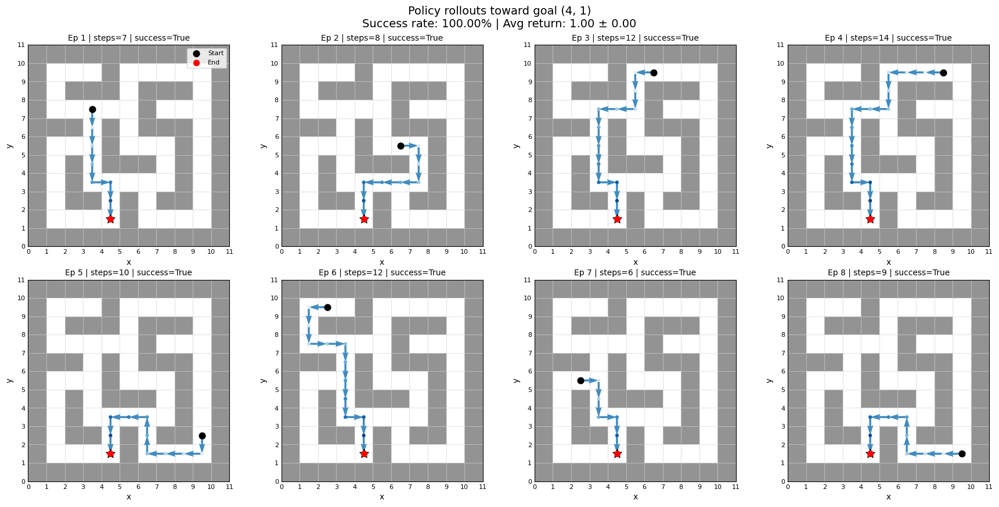

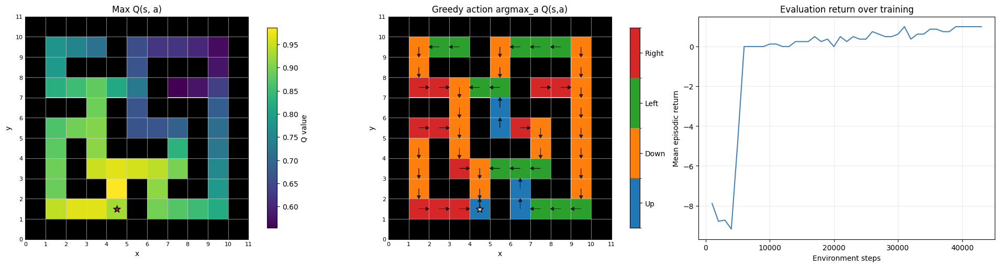

Embedding mode: all_discrete
states_base: (52, 2)
coords_base: (52, 2)
phi(s,a) base: (52, 4, 64)
psi(z) / task code base: (1, 64)
phi(s,a) norms: mean=1.0000, std=0.0000
top 5 singular values: [4.5488415 3.7491057 2.742052  2.5877268 2.084524 ]
cumulative variance (first 5 dims): [0.29411384 0.4939018  0.6007741  0.6959552  0.7577181 ]
cos(phi(s,a), psi/task): mean=0.7285, std=0.1404


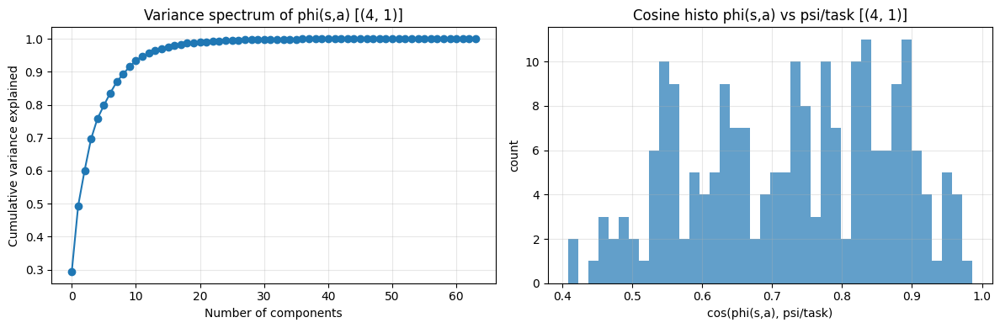


Goal embedding cosine similarity matrix:
     (7, 7)     (4, 1)
  (7, 7)      1.000      1.000
  (4, 1)      1.000      1.000

Off-diagonal mean similarity: 1.000
Off-diagonal min similarity: 1.000
Off-diagonal max similarity: 1.000

----- seed=42, goal=(1, 1) -----

Mean squared deltas (first few): [0.0, 0.0, 0.0, 0.0]
[DQN-factorised] step=   1000 | eps=0.981 | eval_return=0.000 | eval_len=100.0 | TD=0.000 | ReplayTD=0.000 | Ortho=0.000 | SigReg=0.000 | EWC=0.000000 | Loss=0.000| goal_reg_loss=0.0000
Mean squared deltas (first few): [0.0, 0.0, 0.0, 0.0]
[DQN-factorised] step=   2000 | eps=0.962 | eval_return=0.000 | eval_len=100.0 | TD=0.000 | ReplayTD=0.000 | Ortho=0.000 | SigReg=0.000 | EWC=0.000000 | Loss=0.000| goal_reg_loss=0.0000
Mean squared deltas (first few): [0.0, 0.0, 0.0, 0.0]
[DQN-factorised] step=   3000 | eps=0.943 | eval_return=0.000 | eval_len=100.0 | TD=0.000 | ReplayTD=0.000 | Ortho=0.000 | SigReg=0.000 | EWC=0.000000 | Loss=0.000| goal_reg_loss=0.0000
Mean square

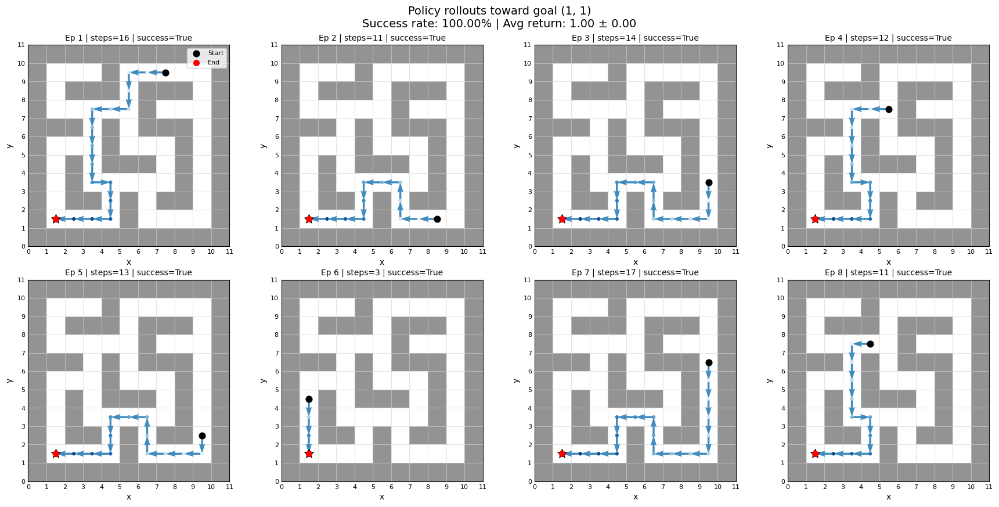

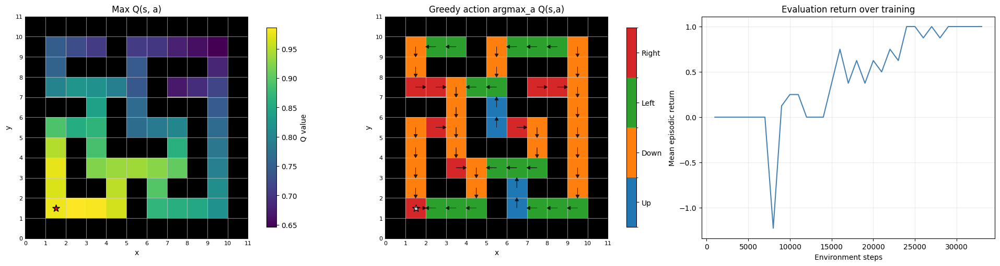

Embedding mode: all_discrete
states_base: (52, 2)
coords_base: (52, 2)
phi(s,a) base: (52, 4, 64)
psi(z) / task code base: (1, 64)
phi(s,a) norms: mean=1.0000, std=0.0000
top 5 singular values: [4.1203794 2.999435  2.7440877 2.459552  2.2782388]
cumulative variance (first 5 dims): [0.2761159  0.42243326 0.5448985  0.64328355 0.72769773]
cos(phi(s,a), psi/task): mean=0.7551, std=0.1133


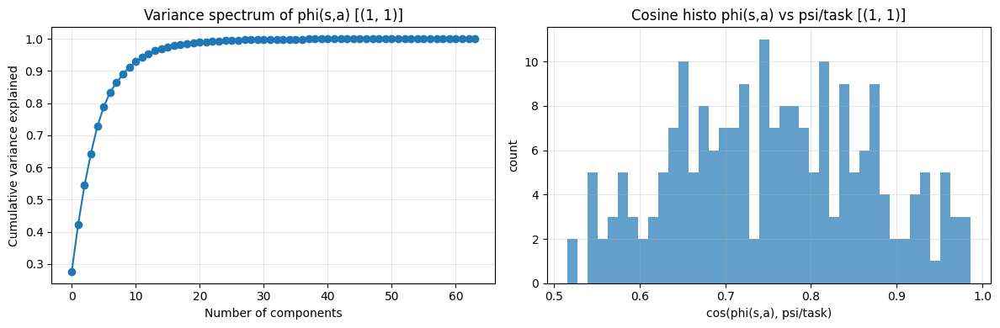


Goal embedding cosine similarity matrix:
     (7, 7)     (4, 1)     (1, 1)
  (7, 7)      1.000      1.000      0.881
  (4, 1)      1.000      1.000      0.886
  (1, 1)      0.881      0.886      1.000

Off-diagonal mean similarity: 0.922
Off-diagonal min similarity: 0.881
Off-diagonal max similarity: 1.000

----- seed=42, goal=(2, 5) -----

Mean squared deltas (first few): [0.0, 0.0, 0.0, 0.0]
[DQN-factorised] step=   1000 | eps=0.981 | eval_return=0.000 | eval_len=100.0 | TD=0.000 | ReplayTD=0.000 | Ortho=0.000 | SigReg=0.000 | EWC=0.000000 | Loss=0.000| goal_reg_loss=0.0000
Mean squared deltas (first few): [0.0, 0.0, 0.0, 0.0]
[DQN-factorised] step=   2000 | eps=0.962 | eval_return=0.000 | eval_len=100.0 | TD=0.000 | ReplayTD=0.000 | Ortho=0.000 | SigReg=0.000 | EWC=0.000000 | Loss=0.000| goal_reg_loss=0.0000
Mean squared deltas (first few): [0.0, 0.0, 0.0, 0.0]
[DQN-factorised] step=   3000 | eps=0.943 | eval_return=0.000 | eval_len=100.0 | TD=0.000 | ReplayTD=0.000 | Ortho=0.000 |

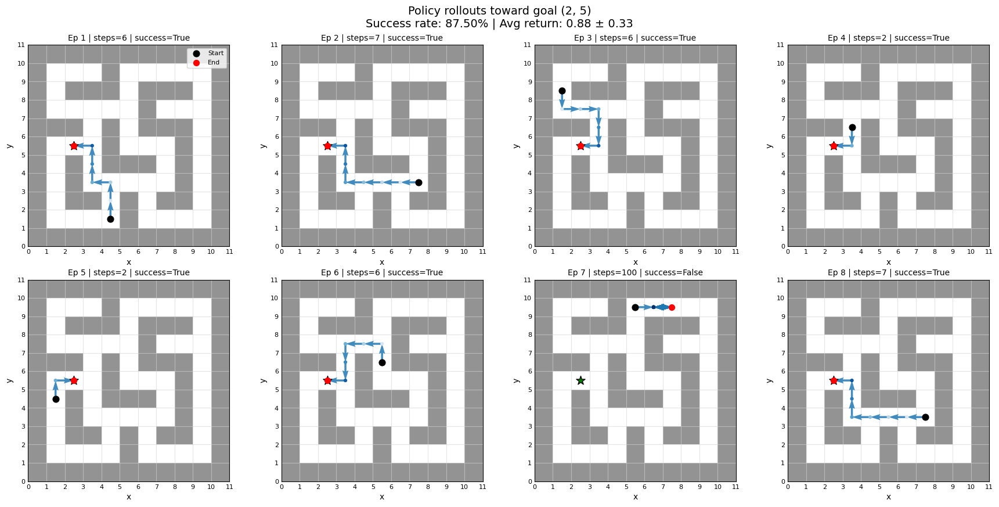

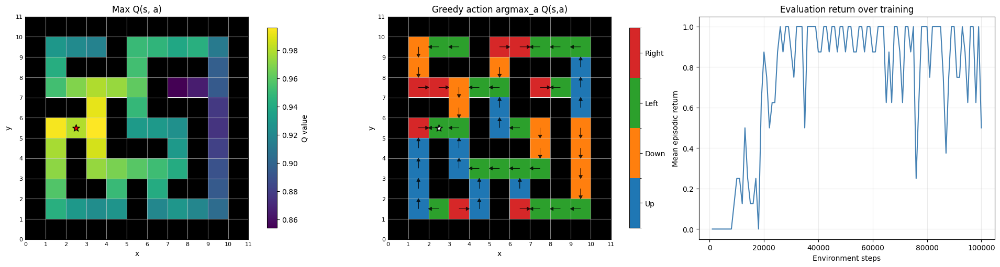

Embedding mode: all_discrete
states_base: (52, 2)
coords_base: (52, 2)
phi(s,a) base: (52, 4, 64)
psi(z) / task code base: (1, 64)
phi(s,a) norms: mean=1.0000, std=0.0000
top 5 singular values: [3.0391126 2.6224835 2.3842947 2.0239742 1.8703988]
cumulative variance (first 5 dims): [0.21626915 0.37730646 0.5104196  0.60634    0.68825614]
cos(phi(s,a), psi/task): mean=0.8824, std=0.0623


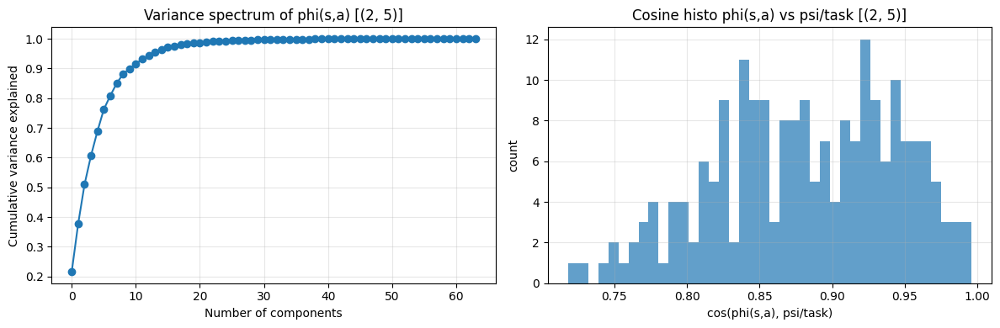


Goal embedding cosine similarity matrix:
     (7, 7)     (4, 1)     (1, 1)     (2, 5)
  (7, 7)      1.000      1.000      0.881      0.963
  (4, 1)      1.000      1.000      0.886      0.966
  (1, 1)      0.881      0.886      1.000      0.976
  (2, 5)      0.963      0.966      0.976      1.000

Off-diagonal mean similarity: 0.945
Off-diagonal min similarity: 0.881
Off-diagonal max similarity: 1.000

----- seed=42, goal=(5, 3) -----

Mean squared deltas (first few): [0.0, 0.0, 0.0, 0.0]
[DQN-factorised] step=   1000 | eps=0.981 | eval_return=0.000 | eval_len=100.0 | TD=0.000 | ReplayTD=0.000 | Ortho=0.000 | SigReg=0.000 | EWC=0.000000 | Loss=0.000| goal_reg_loss=0.0000
Mean squared deltas (first few): [0.0, 0.0, 0.0, 0.0]
[DQN-factorised] step=   2000 | eps=0.962 | eval_return=0.000 | eval_len=100.0 | TD=0.000 | ReplayTD=0.000 | Ortho=0.000 | SigReg=0.000 | EWC=0.000000 | Loss=0.000| goal_reg_loss=0.0000
Mean squared deltas (first few): [0.0, 0.0, 0.0, 0.0]
[DQN-factorised] step=   

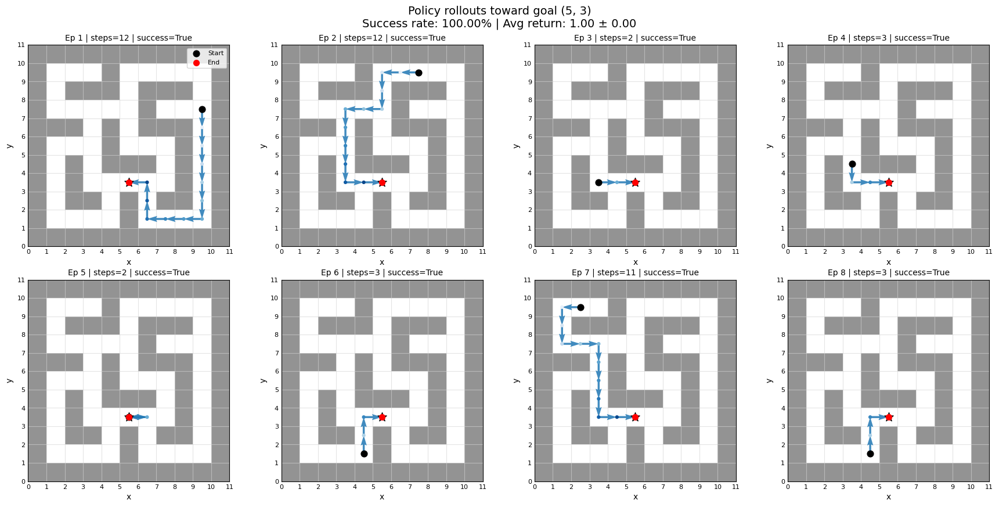

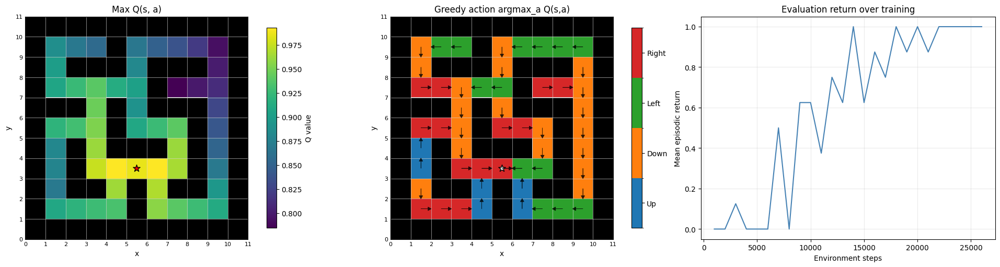

Embedding mode: all_discrete
states_base: (52, 2)
coords_base: (52, 2)
phi(s,a) base: (52, 4, 64)
psi(z) / task code base: (1, 64)
phi(s,a) norms: mean=1.0000, std=0.0000
top 5 singular values: [3.1457734 2.761795  2.6018841 2.3745625 2.2099829]
cumulative variance (first 5 dims): [0.19712418 0.3490627  0.4839158  0.59623456 0.69352335]
cos(phi(s,a), psi/task): mean=0.8392, std=0.0765


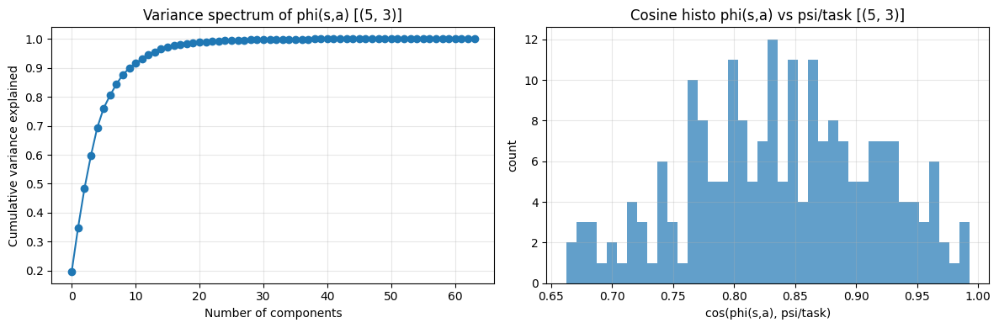


Goal embedding cosine similarity matrix:
     (7, 7)     (4, 1)     (1, 1)     (2, 5)     (5, 3)
  (7, 7)      1.000      1.000      0.881      0.963      1.000
  (4, 1)      1.000      1.000      0.886      0.966      1.000
  (1, 1)      0.881      0.886      1.000      0.976      0.887
  (2, 5)      0.963      0.966      0.976      1.000      0.966
  (5, 3)      1.000      1.000      0.887      0.966      1.000

Off-diagonal mean similarity: 0.953
Off-diagonal min similarity: 0.881
Off-diagonal max similarity: 1.000

----- seed=42, goal=(1, 3) -----

Mean squared deltas (first few): [0.0, 0.0, 0.0, 0.0]
[DQN-factorised] step=   1000 | eps=0.981 | eval_return=0.000 | eval_len=100.0 | TD=0.000 | ReplayTD=0.000 | Ortho=0.000 | SigReg=0.000 | EWC=0.000000 | Loss=0.000| goal_reg_loss=0.0000
Mean squared deltas (first few): [0.0, 0.0, 0.0, 0.0]
[DQN-factorised] step=   2000 | eps=0.962 | eval_return=0.000 | eval_len=100.0 | TD=0.000 | ReplayTD=0.000 | Ortho=0.000 | SigReg=0.000 | EWC=0.00

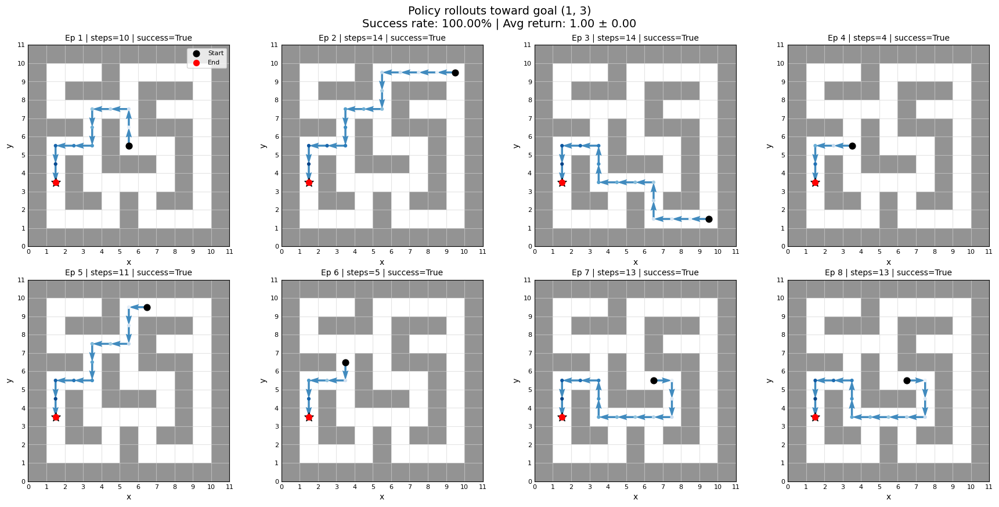

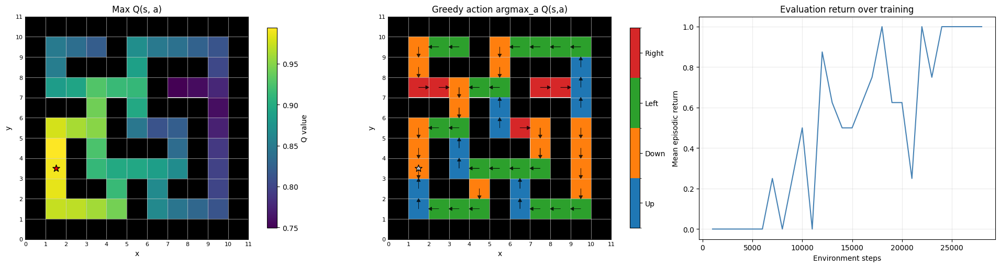

Embedding mode: all_discrete
states_base: (52, 2)
coords_base: (52, 2)
phi(s,a) base: (52, 4, 64)
psi(z) / task code base: (1, 64)
phi(s,a) norms: mean=1.0000, std=0.0000
top 5 singular values: [3.0833988 2.7644117 2.4142318 2.235563  2.1348593]
cumulative variance (first 5 dims): [0.19789116 0.35695535 0.47827327 0.582299   0.6771639 ]
cos(phi(s,a), psi/task): mean=0.8113, std=0.0850


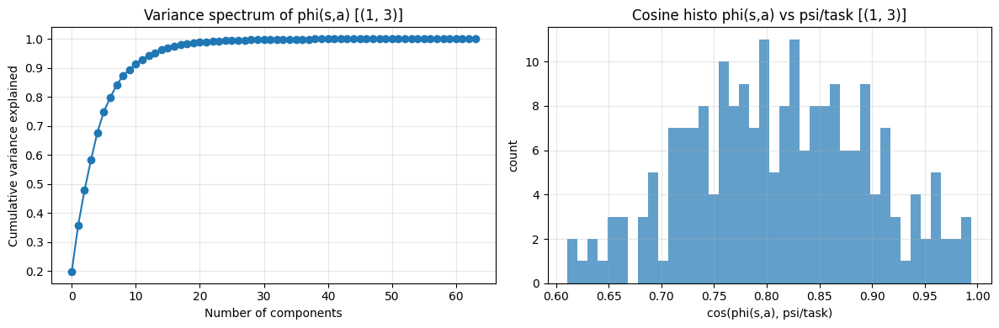


Goal embedding cosine similarity matrix:
     (7, 7)     (4, 1)     (1, 1)     (2, 5)     (5, 3)     (1, 3)
  (7, 7)      1.000      1.000      0.881      0.963      1.000      0.769
  (4, 1)      1.000      1.000      0.886      0.966      1.000      0.775
  (1, 1)      0.881      0.886      1.000      0.976      0.887      0.980
  (2, 5)      0.963      0.966      0.976      1.000      0.966      0.913
  (5, 3)      1.000      1.000      0.887      0.966      1.000      0.777
  (1, 3)      0.769      0.775      0.980      0.913      0.777      1.000

Off-diagonal mean similarity: 0.916
Off-diagonal min similarity: 0.769
Off-diagonal max similarity: 1.000

----- seed=42, goal=(3, 1) -----

Mean squared deltas (first few): [0.0, 0.0, 0.0, 0.0]
[DQN-factorised] step=   1000 | eps=0.981 | eval_return=0.750 | eval_len=30.0 | TD=0.000 | ReplayTD=0.000 | Ortho=0.000 | SigReg=0.000 | EWC=0.000000 | Loss=0.000| goal_reg_loss=0.0000
Mean squared deltas (first few): [0.0, 0.0, 0.0, 0.0]
[DQN-f

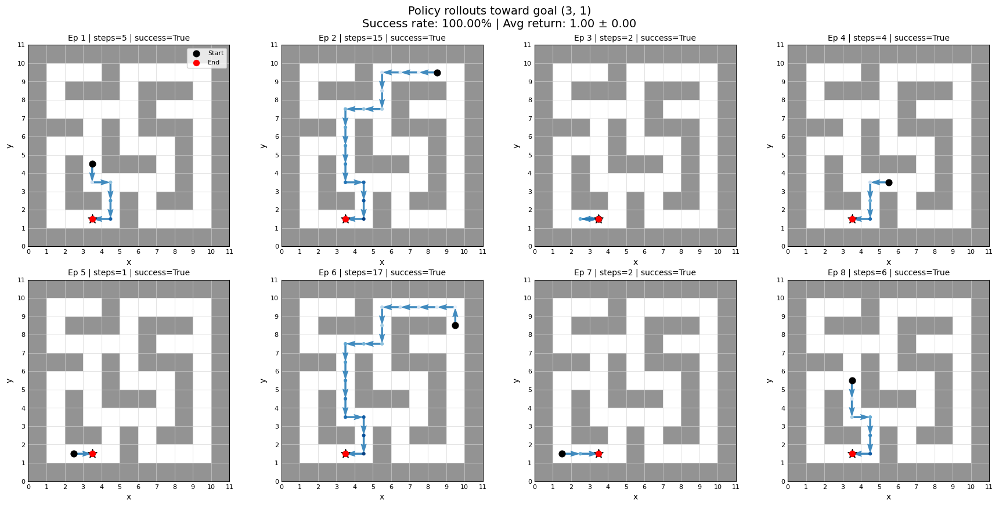

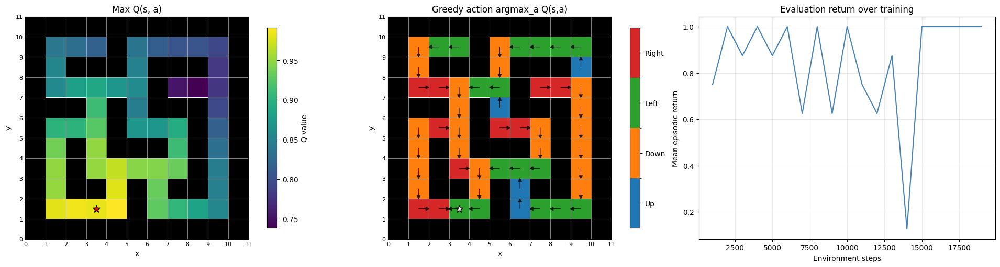

Embedding mode: all_discrete
states_base: (52, 2)
coords_base: (52, 2)
phi(s,a) base: (52, 4, 64)
psi(z) / task code base: (1, 64)
phi(s,a) norms: mean=1.0000, std=0.0000
top 5 singular values: [3.0919776 2.754248  2.3463192 2.2069278 2.0065649]
cumulative variance (first 5 dims): [0.20418908 0.36620805 0.4837882  0.5878128  0.6738064 ]
cos(phi(s,a), psi/task): mean=0.8206, std=0.0816


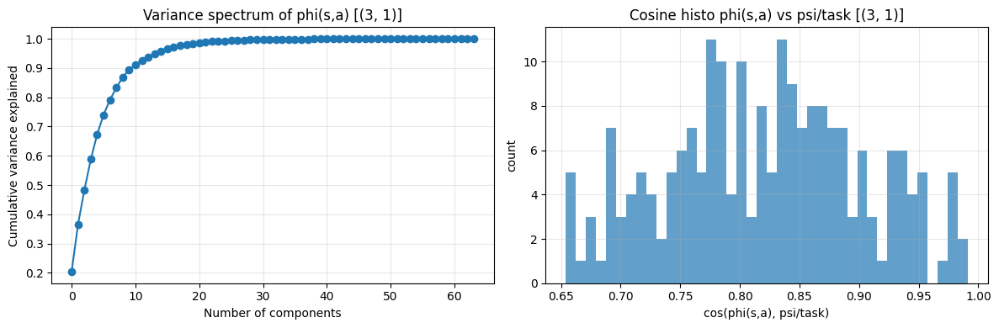


Goal embedding cosine similarity matrix:
     (7, 7)     (4, 1)     (1, 1)     (2, 5)     (5, 3)     (1, 3)     (3, 1)
  (7, 7)      1.000      1.000      0.881      0.963      1.000      0.769      0.785
  (4, 1)      1.000      1.000      0.886      0.966      1.000      0.775      0.790
  (1, 1)      0.881      0.886      1.000      0.976      0.887      0.980      0.956
  (2, 5)      0.963      0.966      0.976      1.000      0.966      0.913      0.905
  (5, 3)      1.000      1.000      0.887      0.966      1.000      0.777      0.792
  (1, 3)      0.769      0.775      0.980      0.913      0.777      1.000      0.959
  (3, 1)      0.785      0.790      0.956      0.905      0.792      0.959      1.000

Off-diagonal mean similarity: 0.901
Off-diagonal min similarity: 0.769
Off-diagonal max similarity: 1.000

----- seed=42, goal=(9, 5) -----

Mean squared deltas (first few): [0.0, 0.0, 0.0, 0.0]
[DQN-factorised] step=   1000 | eps=0.981 | eval_return=0.125 | eval_len=87.9 | TD

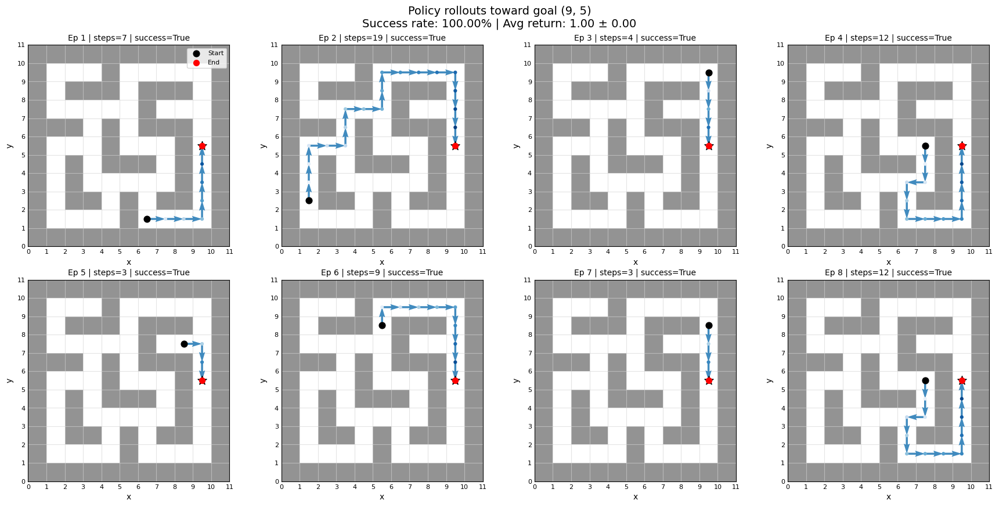

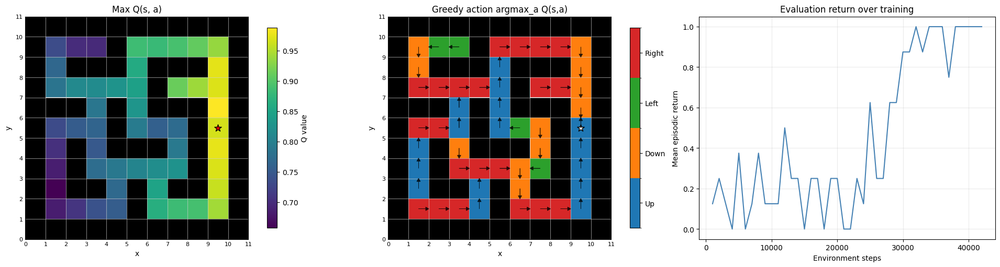

Embedding mode: all_discrete
states_base: (52, 2)
coords_base: (52, 2)
phi(s,a) base: (52, 4, 64)
psi(z) / task code base: (1, 64)
phi(s,a) norms: mean=1.0000, std=0.0000
top 5 singular values: [3.2022913 2.9908047 2.482564  2.1718173 1.9457308]
cumulative variance (first 5 dims): [0.20156518 0.37738585 0.49852785 0.5912408  0.6656556 ]
cos(phi(s,a), psi/task): mean=0.7622, std=0.1026


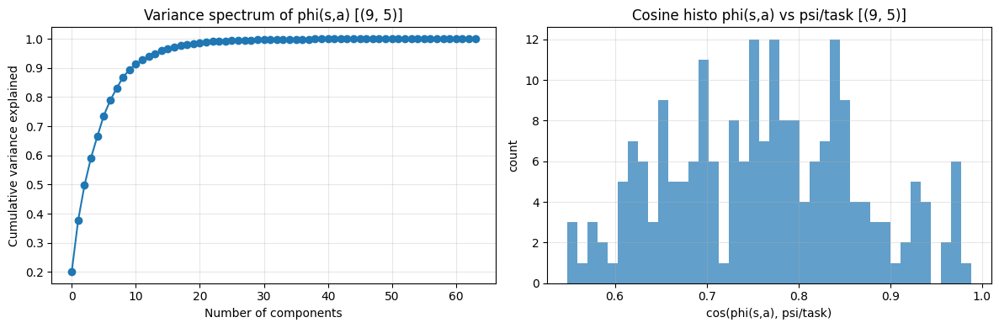


Goal embedding cosine similarity matrix:
     (7, 7)     (4, 1)     (1, 1)     (2, 5)     (5, 3)     (1, 3)     (3, 1)     (9, 5)
  (7, 7)      1.000      1.000      0.881      0.963      1.000      0.769      0.785      0.961
  (4, 1)      1.000      1.000      0.886      0.966      1.000      0.775      0.790      0.959
  (1, 1)      0.881      0.886      1.000      0.976      0.887      0.980      0.956      0.718
  (2, 5)      0.963      0.966      0.976      1.000      0.966      0.913      0.905      0.852
  (5, 3)      1.000      1.000      0.887      0.966      1.000      0.777      0.792      0.958
  (1, 3)      0.769      0.775      0.980      0.913      0.777      1.000      0.959      0.564
  (3, 1)      0.785      0.790      0.956      0.905      0.792      0.959      1.000      0.597
  (9, 5)      0.961      0.959      0.718      0.852      0.958      0.564      0.597      1.000

Off-diagonal mean similarity: 0.876
Off-diagonal min similarity: 0.564
Off-diagonal max simi

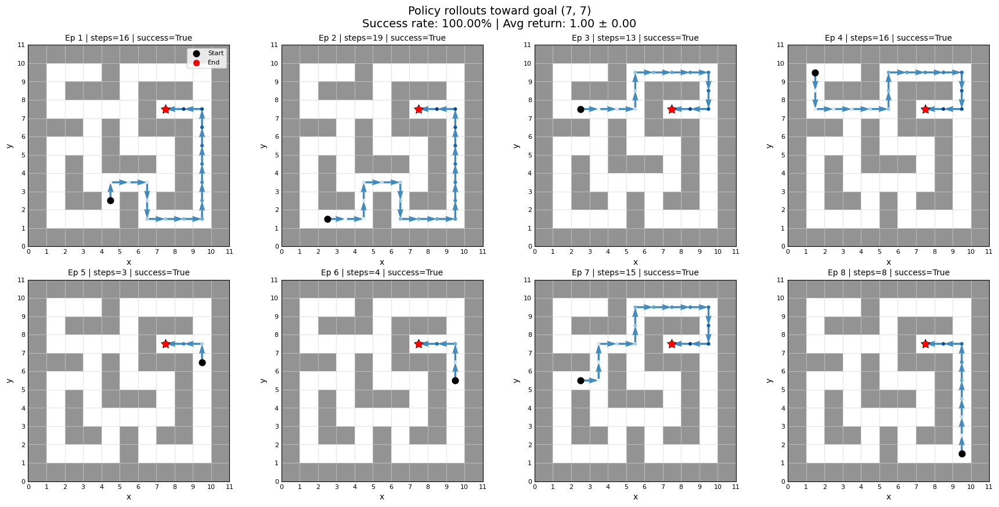

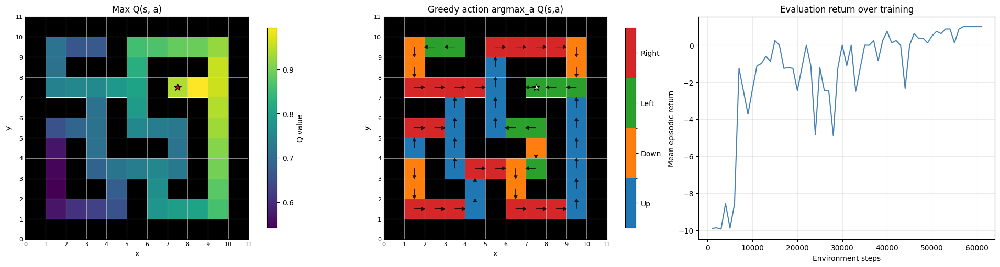

Embedding mode: all_discrete
states_base: (52, 2)
coords_base: (52, 2)
phi(s,a) base: (52, 4, 64)
psi(z) / task code base: (1, 64)
phi(s,a) norms: mean=1.0000, std=0.0000
top 5 singular values: [5.079021  4.319278  3.5038779 2.9033656 1.6828631]
cumulative variance (first 5 dims): [0.31911778 0.5499058  0.7017817  0.80606014 0.841094  ]
cos(phi(s,a), psi/task): mean=0.7064, std=0.1249


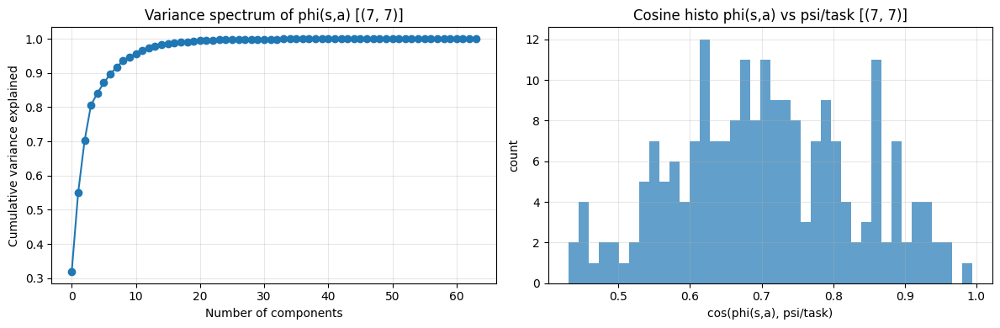


Goal embedding cosine similarity matrix:
     (7, 7)
  (7, 7)      1.000

----- seed=123, goal=(4, 1) -----

Mean squared deltas (first few): [0.0, 0.0, 0.0, 0.0]
[DQN-factorised] step=   1000 | eps=0.981 | eval_return=-8.950 | eval_len=100.0 | TD=0.000 | ReplayTD=0.000 | Ortho=0.000 | SigReg=0.000 | EWC=0.000000 | Loss=0.000| goal_reg_loss=0.0000
Mean squared deltas (first few): [0.0, 0.0, 0.0, 0.0]
[DQN-factorised] step=   2000 | eps=0.962 | eval_return=-9.087 | eval_len=100.0 | TD=0.000 | ReplayTD=0.000 | Ortho=0.000 | SigReg=0.000 | EWC=0.000000 | Loss=0.000| goal_reg_loss=0.0000
Mean squared deltas (first few): [0.0, 0.0, 0.0, 0.0]
[DQN-factorised] step=   3000 | eps=0.943 | eval_return=-9.075 | eval_len=100.0 | TD=0.000 | ReplayTD=0.000 | Ortho=0.000 | SigReg=0.000 | EWC=0.000000 | Loss=0.000| goal_reg_loss=0.0000
Mean squared deltas (first few): [0.0, 0.0, 0.0, 0.0]
[DQN-factorised] step=   4000 | eps=0.924 | eval_return=-7.675 | eval_len=87.9 | TD=0.000 | ReplayTD=0.000 | Orth

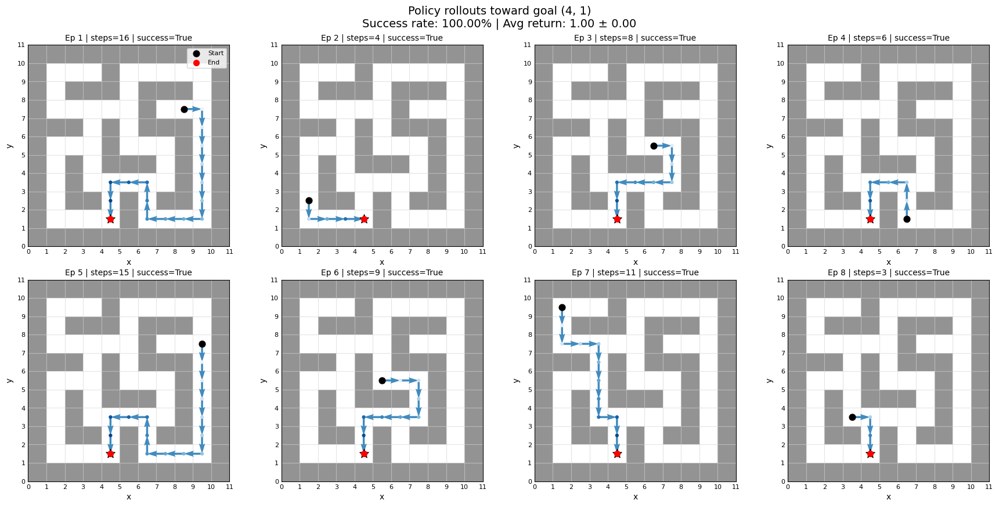

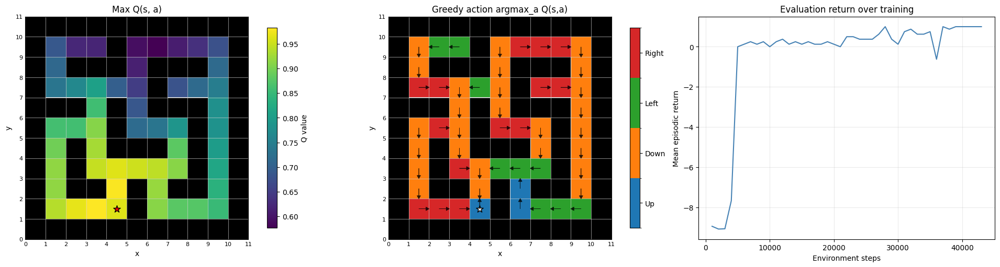

Embedding mode: all_discrete
states_base: (52, 2)
coords_base: (52, 2)
phi(s,a) base: (52, 4, 64)
psi(z) / task code base: (1, 64)
phi(s,a) norms: mean=1.0000, std=0.0000
top 5 singular values: [4.5914474 3.9002848 2.9405398 2.4342425 2.0860636]
cumulative variance (first 5 dims): [0.30521014 0.5254482  0.6506337  0.7364219  0.79942393]
cos(phi(s,a), psi/task): mean=0.7401, std=0.1322


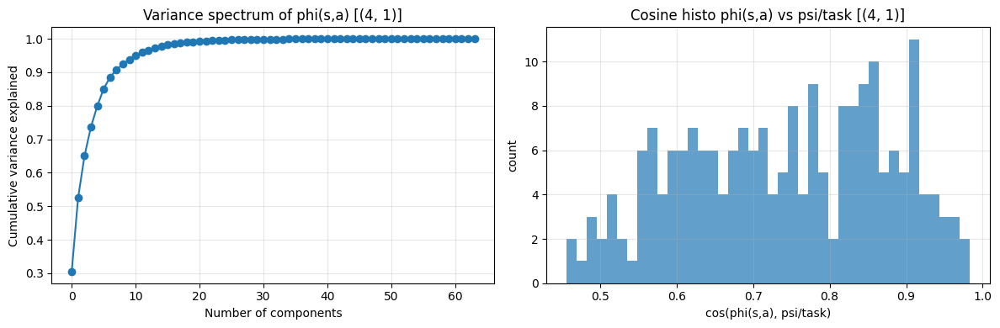


Goal embedding cosine similarity matrix:
     (7, 7)     (4, 1)
  (7, 7)      1.000      1.000
  (4, 1)      1.000      1.000

Off-diagonal mean similarity: 1.000
Off-diagonal min similarity: 1.000
Off-diagonal max similarity: 1.000

----- seed=123, goal=(1, 1) -----

Mean squared deltas (first few): [0.0, 0.0, 0.0, 0.0]
[DQN-factorised] step=   1000 | eps=0.981 | eval_return=0.000 | eval_len=100.0 | TD=0.000 | ReplayTD=0.000 | Ortho=0.000 | SigReg=0.000 | EWC=0.000000 | Loss=0.000| goal_reg_loss=0.0000
Mean squared deltas (first few): [0.0, 0.0, 0.0, 0.0]
[DQN-factorised] step=   2000 | eps=0.962 | eval_return=0.000 | eval_len=100.0 | TD=0.000 | ReplayTD=0.000 | Ortho=0.000 | SigReg=0.000 | EWC=0.000000 | Loss=0.000| goal_reg_loss=0.0000
Mean squared deltas (first few): [0.0, 0.0, 0.0, 0.0]
[DQN-factorised] step=   3000 | eps=0.943 | eval_return=0.000 | eval_len=100.0 | TD=0.000 | ReplayTD=0.000 | Ortho=0.000 | SigReg=0.000 | EWC=0.000000 | Loss=0.000| goal_reg_loss=0.0000
Mean squar

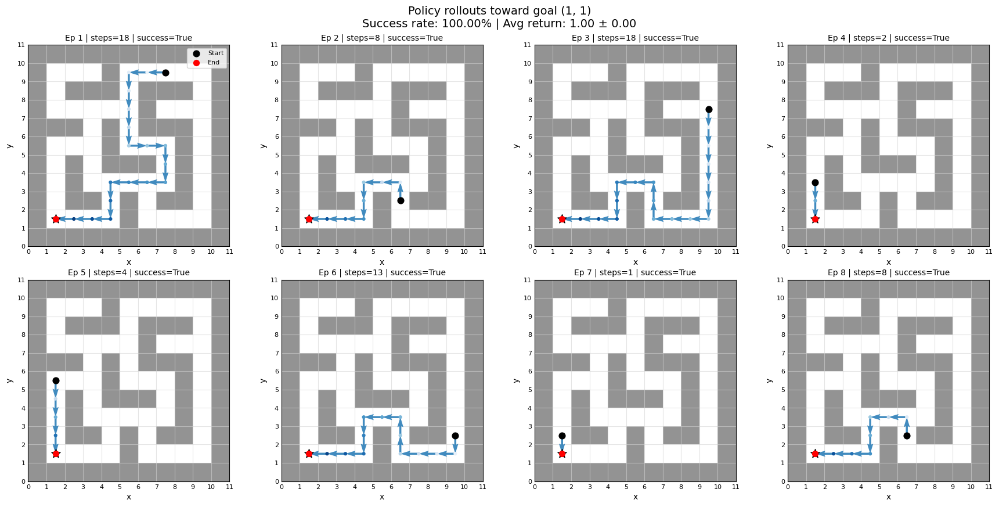

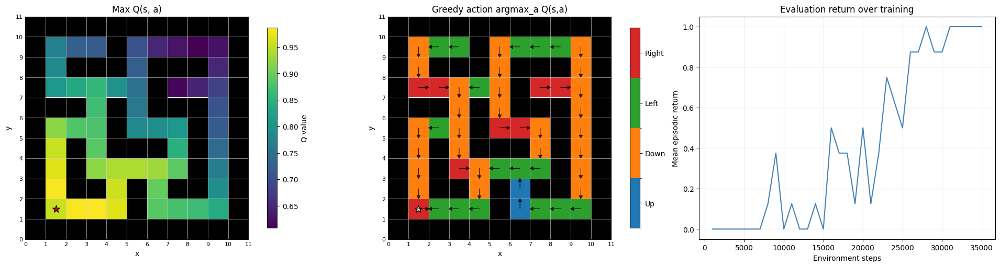

Embedding mode: all_discrete
states_base: (52, 2)
coords_base: (52, 2)
phi(s,a) base: (52, 4, 64)
psi(z) / task code base: (1, 64)
phi(s,a) norms: mean=1.0000, std=0.0000
top 5 singular values: [4.2441683 3.5965207 2.5829604 2.523033  2.4428084]
cumulative variance (first 5 dims): [0.2816506  0.48390156 0.58822    0.687754   0.78105885]
cos(phi(s,a), psi/task): mean=0.7535, std=0.1226


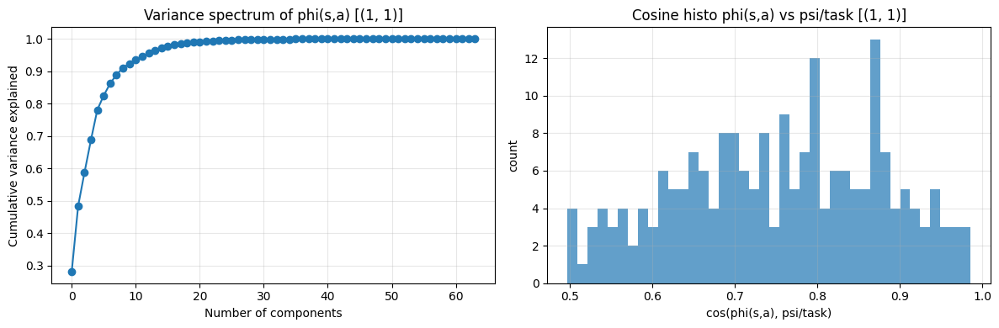


Goal embedding cosine similarity matrix:
     (7, 7)     (4, 1)     (1, 1)
  (7, 7)      1.000      1.000      0.881
  (4, 1)      1.000      1.000      0.884
  (1, 1)      0.881      0.884      1.000

Off-diagonal mean similarity: 0.921
Off-diagonal min similarity: 0.881
Off-diagonal max similarity: 1.000

----- seed=123, goal=(2, 5) -----

Mean squared deltas (first few): [0.0, 0.0, 0.0, 0.0]
[DQN-factorised] step=   1000 | eps=0.981 | eval_return=0.250 | eval_len=75.2 | TD=0.000 | ReplayTD=0.000 | Ortho=0.000 | SigReg=0.000 | EWC=0.000000 | Loss=0.000| goal_reg_loss=0.0000
Mean squared deltas (first few): [0.0, 0.0, 0.0, 0.0]
[DQN-factorised] step=   2000 | eps=0.962 | eval_return=0.000 | eval_len=100.0 | TD=0.000 | ReplayTD=0.000 | Ortho=0.000 | SigReg=0.000 | EWC=0.000000 | Loss=0.000| goal_reg_loss=0.0000
Mean squared deltas (first few): [0.0, 0.0, 0.0, 0.0]
[DQN-factorised] step=   3000 | eps=0.943 | eval_return=0.000 | eval_len=100.0 | TD=0.000 | ReplayTD=0.000 | Ortho=0.000 |

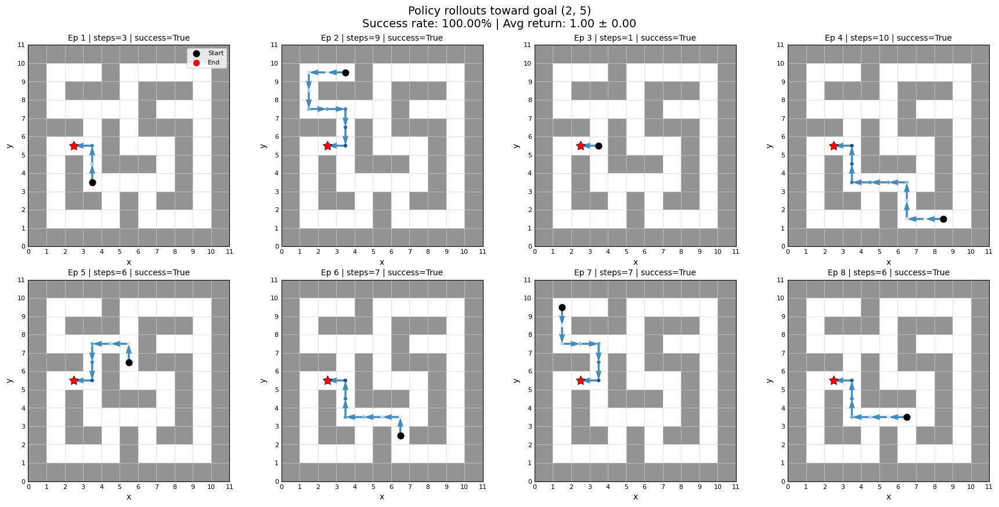

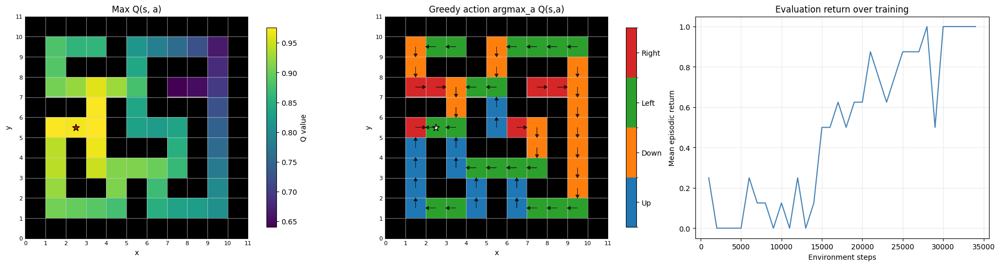

Embedding mode: all_discrete
states_base: (52, 2)
coords_base: (52, 2)
phi(s,a) base: (52, 4, 64)
psi(z) / task code base: (1, 64)
phi(s,a) norms: mean=1.0000, std=0.0000
top 5 singular values: [3.9064674 3.401093  2.702913  2.508781  2.1734805]
cumulative variance (first 5 dims): [0.25495198 0.4482053  0.57025987 0.67541134 0.754334  ]
cos(phi(s,a), psi/task): mean=0.7917, std=0.1038


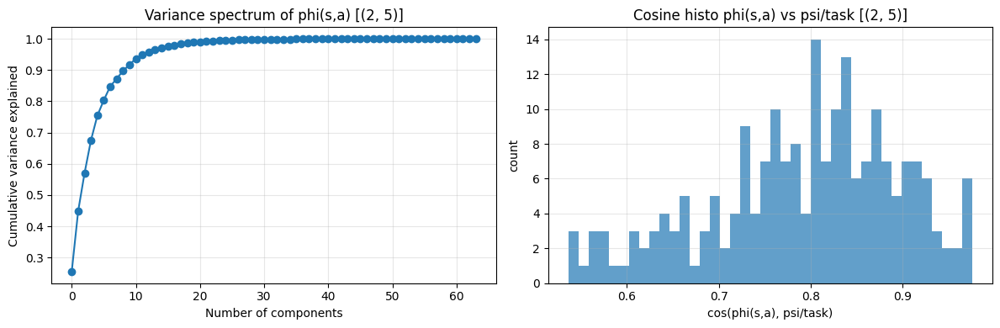


Goal embedding cosine similarity matrix:
     (7, 7)     (4, 1)     (1, 1)     (2, 5)
  (7, 7)      1.000      1.000      0.881      0.963
  (4, 1)      1.000      1.000      0.884      0.965
  (1, 1)      0.881      0.884      1.000      0.975
  (2, 5)      0.963      0.965      0.975      1.000

Off-diagonal mean similarity: 0.945
Off-diagonal min similarity: 0.881
Off-diagonal max similarity: 1.000

----- seed=123, goal=(5, 3) -----

Mean squared deltas (first few): [0.0, 0.0, 0.0, 0.0]
[DQN-factorised] step=   1000 | eps=0.981 | eval_return=0.000 | eval_len=100.0 | TD=0.000 | ReplayTD=0.000 | Ortho=0.000 | SigReg=0.000 | EWC=0.000000 | Loss=0.000| goal_reg_loss=0.0000
Mean squared deltas (first few): [0.0, 0.0, 0.0, 0.0]
[DQN-factorised] step=   2000 | eps=0.962 | eval_return=0.125 | eval_len=87.8 | TD=0.000 | ReplayTD=0.000 | Ortho=0.000 | SigReg=0.000 | EWC=0.000000 | Loss=0.000| goal_reg_loss=0.0000
Mean squared deltas (first few): [0.0, 0.0, 0.0, 0.0]
[DQN-factorised] step=   

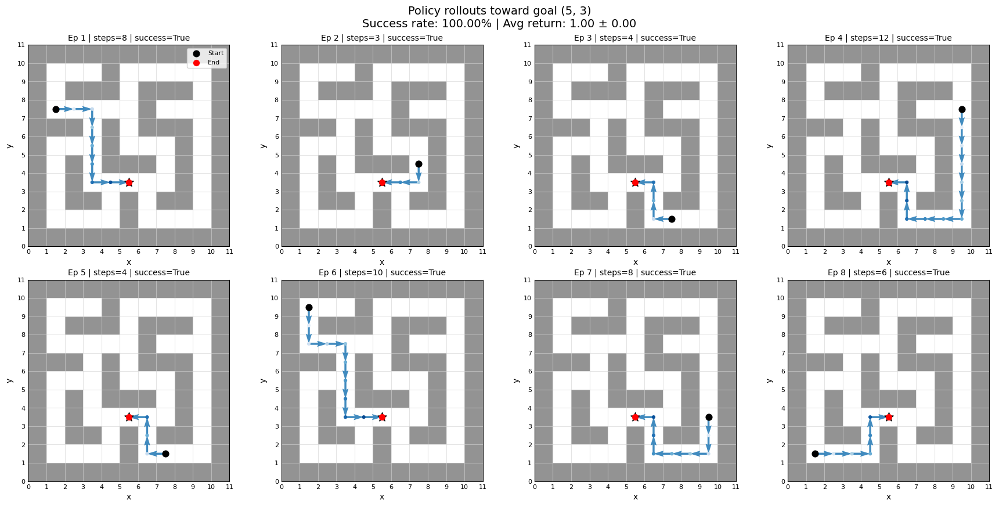

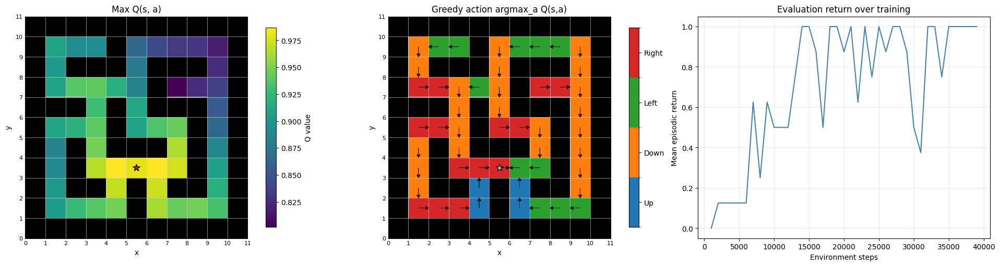

Embedding mode: all_discrete
states_base: (52, 2)
coords_base: (52, 2)
phi(s,a) base: (52, 4, 64)
psi(z) / task code base: (1, 64)
phi(s,a) norms: mean=1.0000, std=0.0000
top 5 singular values: [3.5462935 3.169706  2.4114583 2.2461293 2.0167084]
cumulative variance (first 5 dims): [0.24831471 0.4466916  0.56151026 0.66112477 0.74142915]
cos(phi(s,a), psi/task): mean=0.8539, std=0.0676


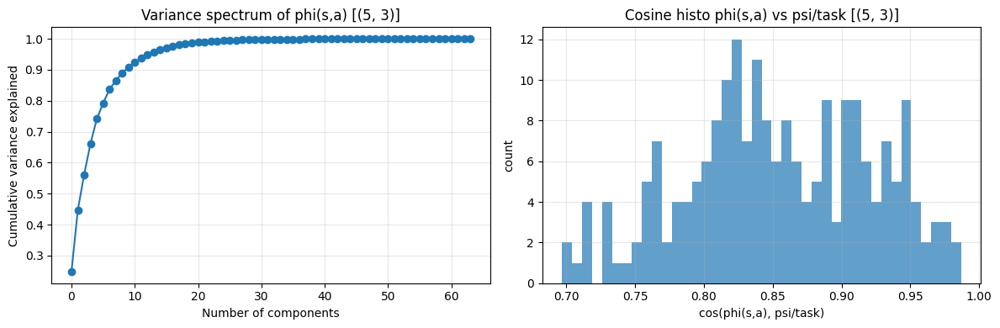


Goal embedding cosine similarity matrix:
     (7, 7)     (4, 1)     (1, 1)     (2, 5)     (5, 3)
  (7, 7)      1.000      1.000      0.881      0.963      1.000
  (4, 1)      1.000      1.000      0.884      0.965      1.000
  (1, 1)      0.881      0.884      1.000      0.975      0.884
  (2, 5)      0.963      0.965      0.975      1.000      0.965
  (5, 3)      1.000      1.000      0.884      0.965      1.000

Off-diagonal mean similarity: 0.952
Off-diagonal min similarity: 0.881
Off-diagonal max similarity: 1.000

----- seed=123, goal=(1, 3) -----

Mean squared deltas (first few): [0.0, 0.0, 0.0, 0.0]
[DQN-factorised] step=   1000 | eps=0.981 | eval_return=0.000 | eval_len=100.0 | TD=0.000 | ReplayTD=0.000 | Ortho=0.000 | SigReg=0.000 | EWC=0.000000 | Loss=0.000| goal_reg_loss=0.0000
Mean squared deltas (first few): [0.0, 0.0, 0.0, 0.0]
[DQN-factorised] step=   2000 | eps=0.962 | eval_return=0.125 | eval_len=87.9 | TD=0.000 | ReplayTD=0.000 | Ortho=0.000 | SigReg=0.000 | EWC=0.00

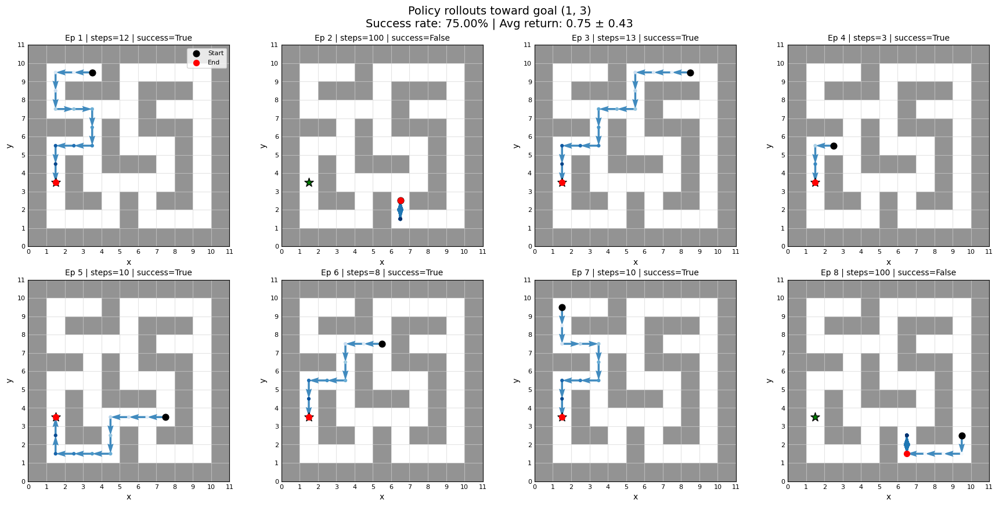

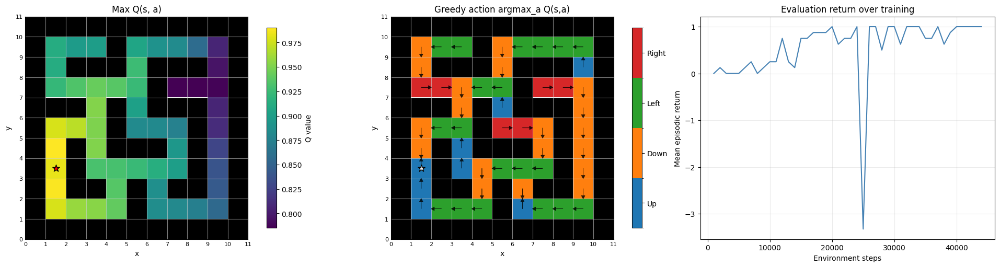

Embedding mode: all_discrete
states_base: (52, 2)
coords_base: (52, 2)
phi(s,a) base: (52, 4, 64)
psi(z) / task code base: (1, 64)
phi(s,a) norms: mean=1.0000, std=0.0000
top 5 singular values: [3.028962  2.984355  2.6758232 2.4513338 1.9244504]
cumulative variance (first 5 dims): [0.19286138 0.38008413 0.5305966  0.6569138  0.73476607]
cos(phi(s,a), psi/task): mean=0.8427, std=0.0757


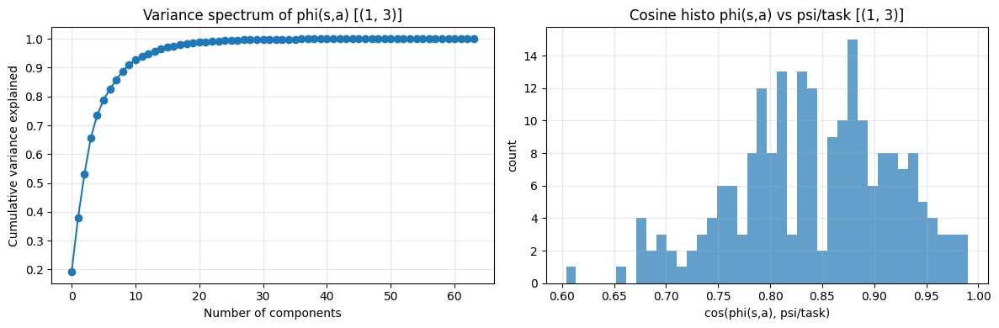


Goal embedding cosine similarity matrix:
     (7, 7)     (4, 1)     (1, 1)     (2, 5)     (5, 3)     (1, 3)
  (7, 7)      1.000      1.000      0.881      0.963      1.000      0.770
  (4, 1)      1.000      1.000      0.884      0.965      1.000      0.774
  (1, 1)      0.881      0.884      1.000      0.975      0.884      0.980
  (2, 5)      0.963      0.965      0.975      1.000      0.965      0.913
  (5, 3)      1.000      1.000      0.884      0.965      1.000      0.774
  (1, 3)      0.770      0.774      0.980      0.913      0.774      1.000

Off-diagonal mean similarity: 0.915
Off-diagonal min similarity: 0.770
Off-diagonal max similarity: 1.000

----- seed=123, goal=(3, 1) -----

Mean squared deltas (first few): [0.0, 0.0, 0.0, 0.0]
[DQN-factorised] step=   1000 | eps=0.981 | eval_return=0.250 | eval_len=76.5 | TD=0.000 | ReplayTD=0.000 | Ortho=0.000 | SigReg=0.000 | EWC=0.000000 | Loss=0.000| goal_reg_loss=0.0000
Mean squared deltas (first few): [0.0, 0.0, 0.0, 0.0]
[DQN-

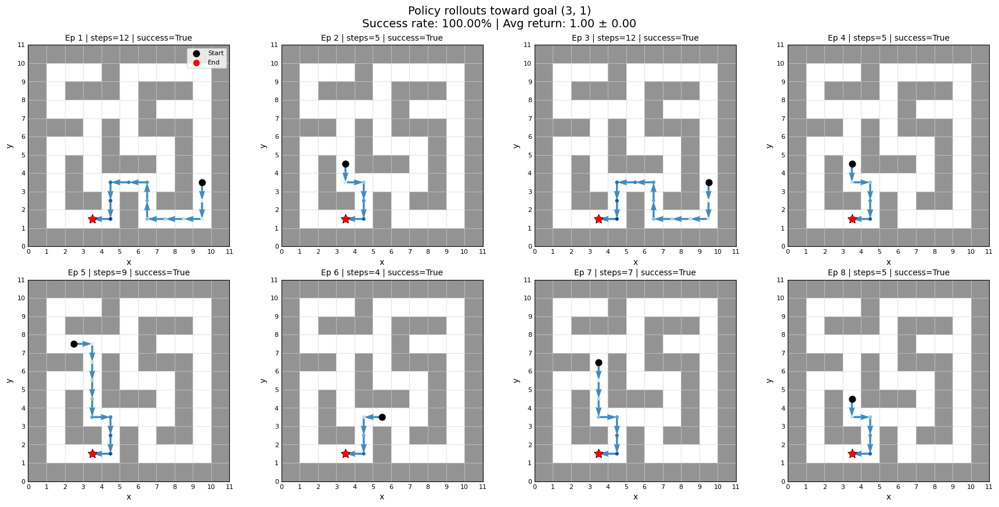

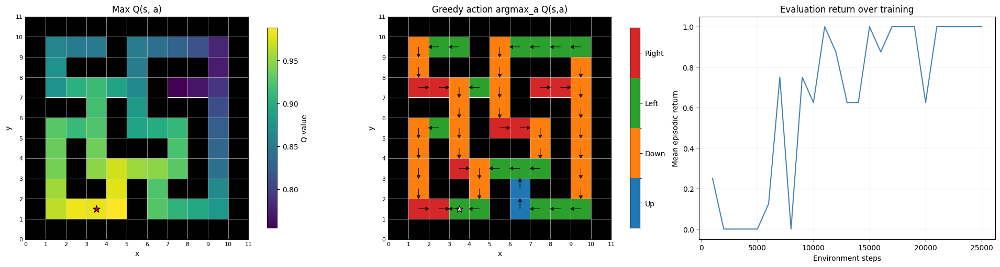

Embedding mode: all_discrete
states_base: (52, 2)
coords_base: (52, 2)
phi(s,a) base: (52, 4, 64)
psi(z) / task code base: (1, 64)
phi(s,a) norms: mean=1.0000, std=0.0000
top 5 singular values: [3.2374506 3.155042  2.6725547 2.52143   2.0826871]
cumulative variance (first 5 dims): [0.20351282 0.39679673 0.5354847  0.6589313  0.7431549 ]
cos(phi(s,a), psi/task): mean=0.8309, std=0.0782


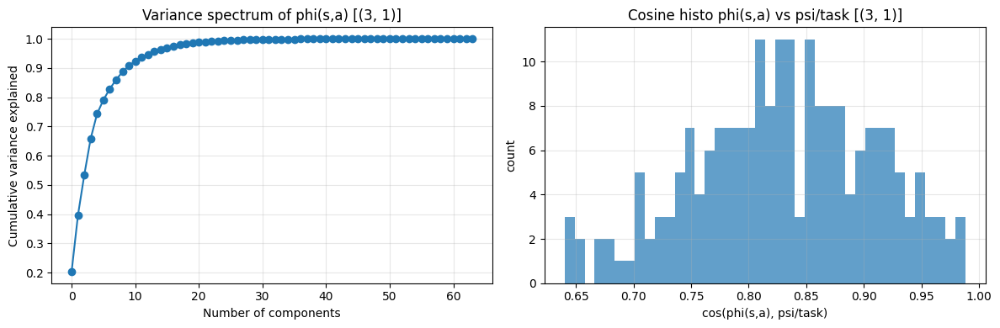


Goal embedding cosine similarity matrix:
     (7, 7)     (4, 1)     (1, 1)     (2, 5)     (5, 3)     (1, 3)     (3, 1)
  (7, 7)      1.000      1.000      0.881      0.963      1.000      0.770      0.792
  (4, 1)      1.000      1.000      0.884      0.965      1.000      0.774      0.795
  (1, 1)      0.881      0.884      1.000      0.975      0.884      0.980      0.950
  (2, 5)      0.963      0.965      0.975      1.000      0.965      0.913      0.901
  (5, 3)      1.000      1.000      0.884      0.965      1.000      0.774      0.796
  (1, 3)      0.770      0.774      0.980      0.913      0.774      1.000      0.945
  (3, 1)      0.792      0.795      0.950      0.901      0.796      0.945      1.000

Off-diagonal mean similarity: 0.900
Off-diagonal min similarity: 0.770
Off-diagonal max similarity: 1.000

----- seed=123, goal=(9, 5) -----

Mean squared deltas (first few): [0.0, 0.0, 0.0, 0.0]
[DQN-factorised] step=   1000 | eps=0.981 | eval_return=0.000 | eval_len=100.0 | 

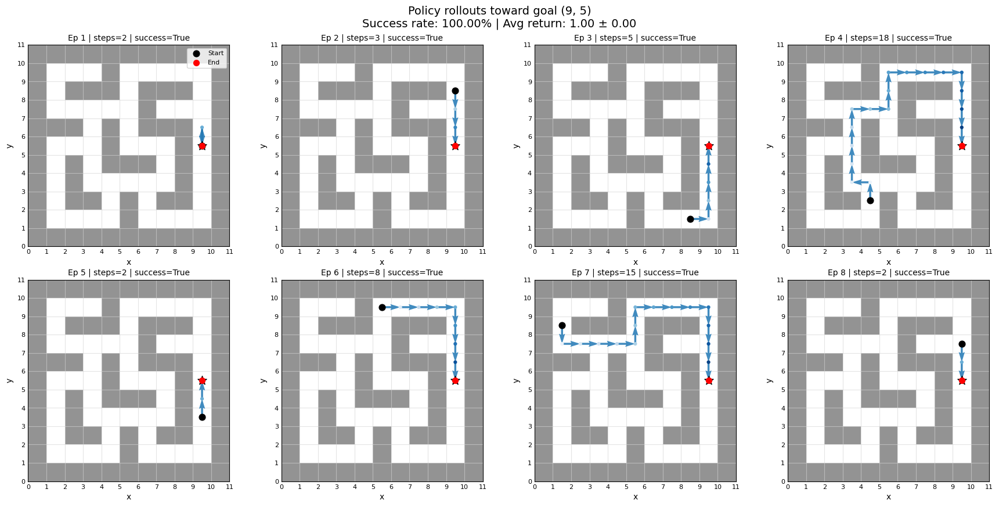

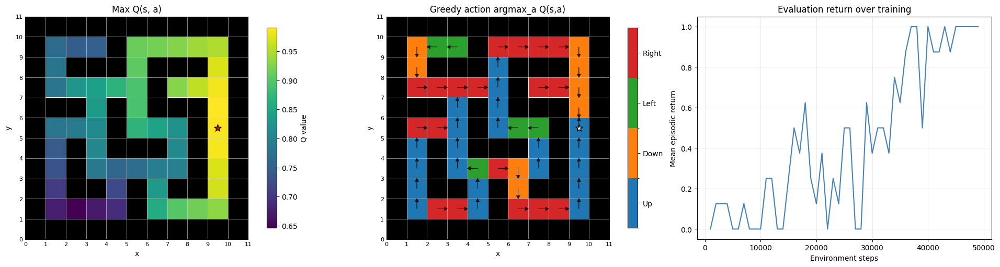

Embedding mode: all_discrete
states_base: (52, 2)
coords_base: (52, 2)
phi(s,a) base: (52, 4, 64)
psi(z) / task code base: (1, 64)
phi(s,a) norms: mean=1.0000, std=0.0000
top 5 singular values: [3.4207785 3.1368465 2.6722429 2.4808931 1.9965502]
cumulative variance (first 5 dims): [0.21704939 0.39956295 0.53201556 0.6461784  0.7201167 ]
cos(phi(s,a), psi/task): mean=0.7746, std=0.1080


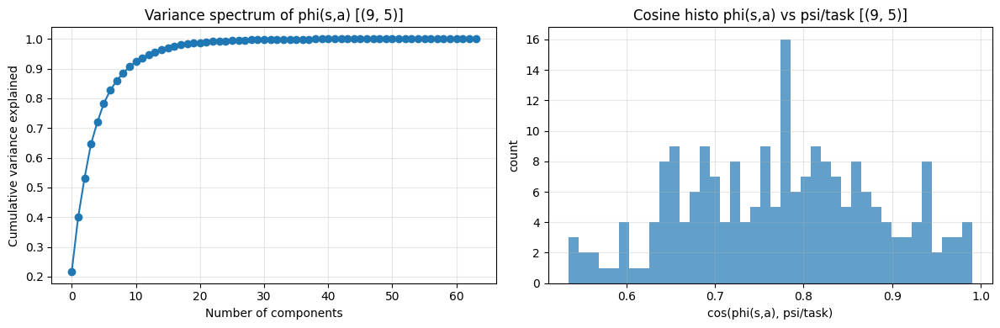


Goal embedding cosine similarity matrix:
     (7, 7)     (4, 1)     (1, 1)     (2, 5)     (5, 3)     (1, 3)     (3, 1)     (9, 5)
  (7, 7)      1.000      1.000      0.881      0.963      1.000      0.770      0.792      0.963
  (4, 1)      1.000      1.000      0.884      0.965      1.000      0.774      0.795      0.961
  (1, 1)      0.881      0.884      1.000      0.975      0.884      0.980      0.950      0.720
  (2, 5)      0.963      0.965      0.975      1.000      0.965      0.913      0.901      0.856
  (5, 3)      1.000      1.000      0.884      0.965      1.000      0.774      0.796      0.961
  (1, 3)      0.770      0.774      0.980      0.913      0.774      1.000      0.945      0.570
  (3, 1)      0.792      0.795      0.950      0.901      0.796      0.945      1.000      0.616
  (9, 5)      0.963      0.961      0.720      0.856      0.961      0.570      0.616      1.000

Off-diagonal mean similarity: 0.877
Off-diagonal min similarity: 0.570
Off-diagonal max simi

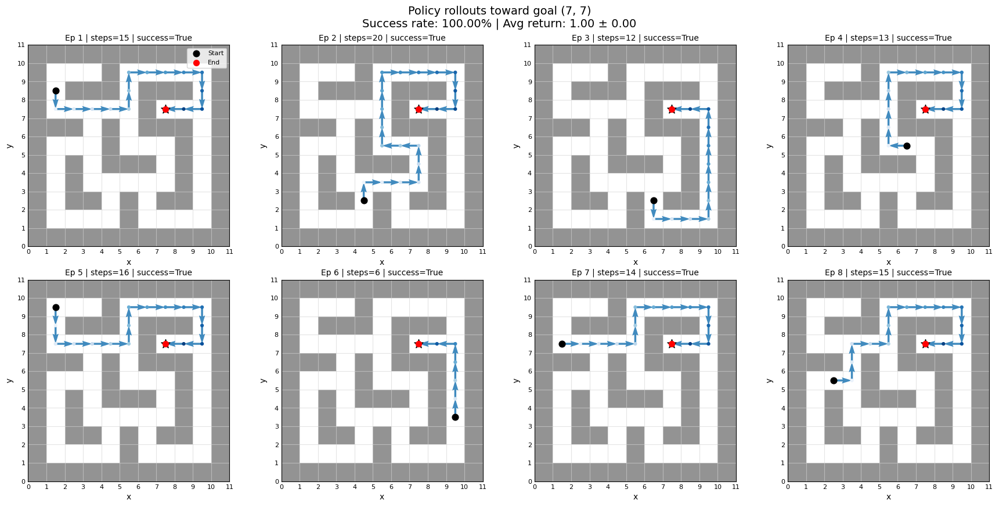

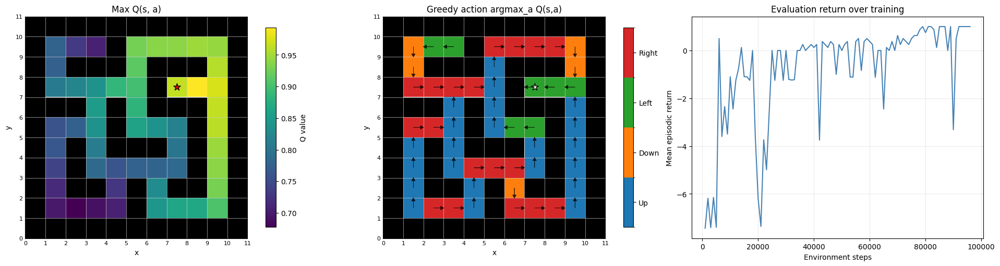

Embedding mode: all_discrete
states_base: (52, 2)
coords_base: (52, 2)
phi(s,a) base: (52, 4, 64)
psi(z) / task code base: (1, 64)
phi(s,a) norms: mean=1.0000, std=0.0000
top 5 singular values: [4.174499  3.4424324 3.2082374 2.5771842 2.4443178]
cumulative variance (first 5 dims): [0.2648618  0.4449733  0.60141176 0.70236063 0.793169  ]
cos(phi(s,a), psi/task): mean=0.7797, std=0.1035


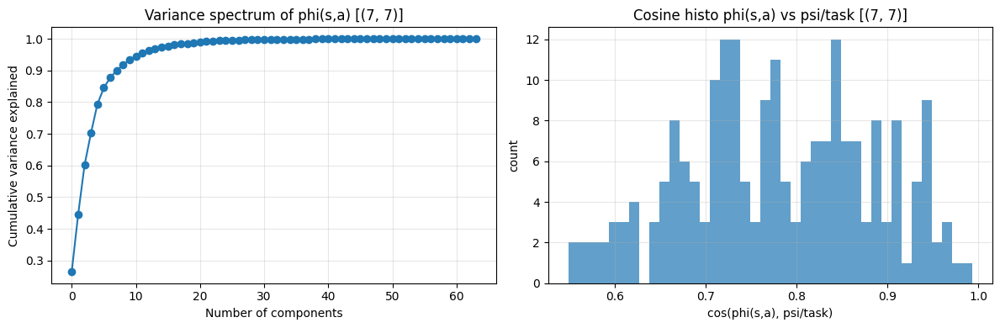


Goal embedding cosine similarity matrix:
     (7, 7)
  (7, 7)      1.000

----- seed=456, goal=(4, 1) -----

Mean squared deltas (first few): [0.0, 0.0, 0.0, 0.0]
[DQN-factorised] step=   1000 | eps=0.981 | eval_return=-8.700 | eval_len=100.0 | TD=0.000 | ReplayTD=0.000 | Ortho=0.000 | SigReg=0.000 | EWC=0.000000 | Loss=0.000| goal_reg_loss=0.0000
Mean squared deltas (first few): [0.0, 0.0, 0.0, 0.0]
[DQN-factorised] step=   2000 | eps=0.962 | eval_return=-7.612 | eval_len=87.8 | TD=0.000 | ReplayTD=0.000 | Ortho=0.000 | SigReg=0.000 | EWC=0.000000 | Loss=0.000| goal_reg_loss=0.0000
Mean squared deltas (first few): [0.0, 0.0, 0.0, 0.0]
[DQN-factorised] step=   3000 | eps=0.943 | eval_return=-9.262 | eval_len=100.0 | TD=0.000 | ReplayTD=0.000 | Ortho=0.000 | SigReg=0.000 | EWC=0.000000 | Loss=0.000| goal_reg_loss=0.0000
Mean squared deltas (first few): [0.0, 0.0, 0.0, 0.0]
[DQN-factorised] step=   4000 | eps=0.924 | eval_return=-8.325 | eval_len=100.0 | TD=0.000 | ReplayTD=0.000 | Orth

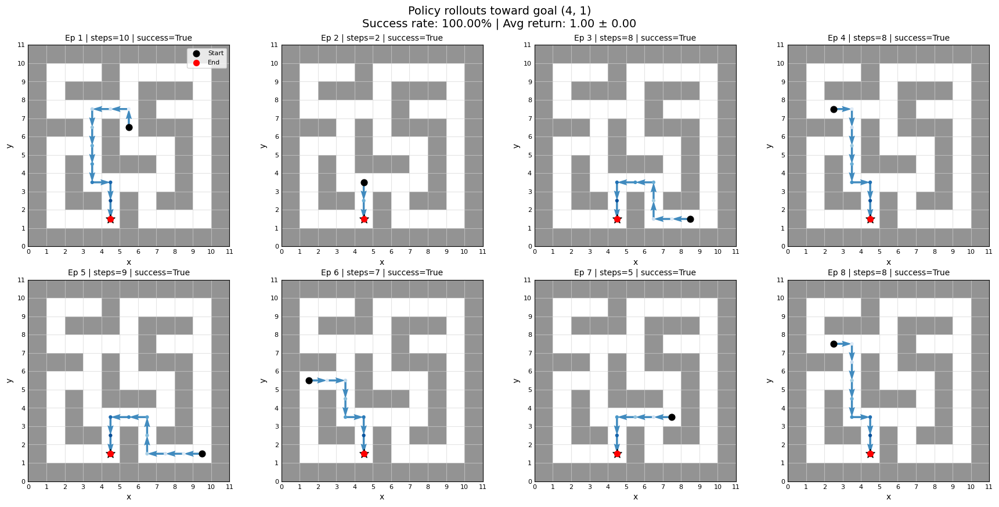

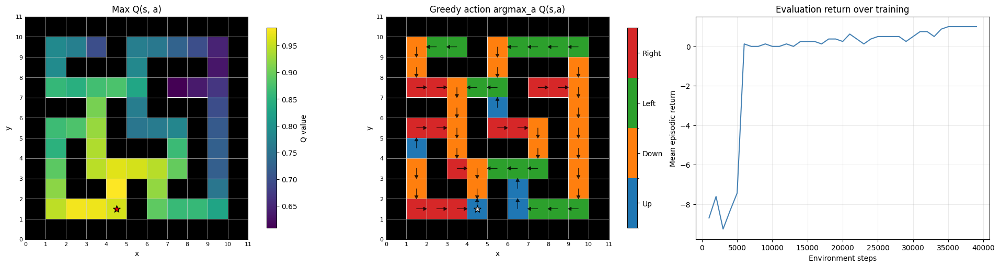

Embedding mode: all_discrete
states_base: (52, 2)
coords_base: (52, 2)
phi(s,a) base: (52, 4, 64)
psi(z) / task code base: (1, 64)
phi(s,a) norms: mean=1.0000, std=0.0000
top 5 singular values: [4.0519958 3.4692106 3.0819626 2.8324554 2.7363737]
cumulative variance (first 5 dims): [0.23607539 0.40912637 0.5457002  0.66105586 0.7687181 ]
cos(phi(s,a), psi/task): mean=0.7589, std=0.1175


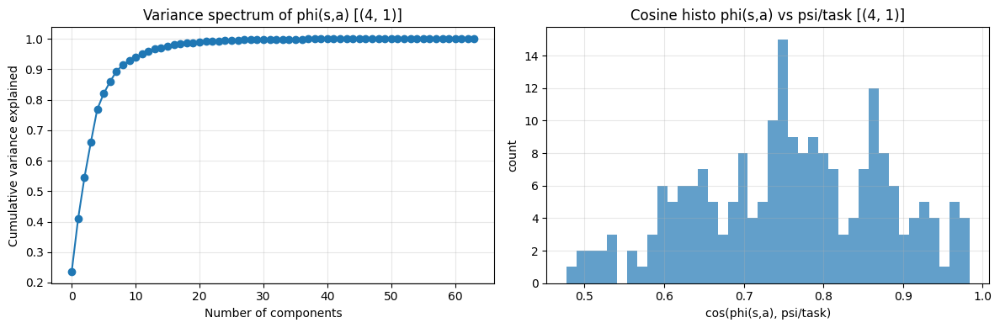


Goal embedding cosine similarity matrix:
     (7, 7)     (4, 1)
  (7, 7)      1.000      1.000
  (4, 1)      1.000      1.000

Off-diagonal mean similarity: 1.000
Off-diagonal min similarity: 1.000
Off-diagonal max similarity: 1.000

----- seed=456, goal=(1, 1) -----

Mean squared deltas (first few): [0.0, 0.0, 0.0, 0.0]
[DQN-factorised] step=   1000 | eps=0.981 | eval_return=0.000 | eval_len=100.0 | TD=0.000 | ReplayTD=0.000 | Ortho=0.000 | SigReg=0.000 | EWC=0.000000 | Loss=0.000| goal_reg_loss=0.0000
Mean squared deltas (first few): [0.0, 0.0, 0.0, 0.0]
[DQN-factorised] step=   2000 | eps=0.962 | eval_return=0.000 | eval_len=100.0 | TD=0.000 | ReplayTD=0.000 | Ortho=0.000 | SigReg=0.000 | EWC=0.000000 | Loss=0.000| goal_reg_loss=0.0000
Mean squared deltas (first few): [0.0, 0.0, 0.0, 0.0]
[DQN-factorised] step=   3000 | eps=0.943 | eval_return=0.000 | eval_len=100.0 | TD=0.000 | ReplayTD=0.000 | Ortho=0.000 | SigReg=0.000 | EWC=0.000000 | Loss=0.000| goal_reg_loss=0.0000
Mean squar

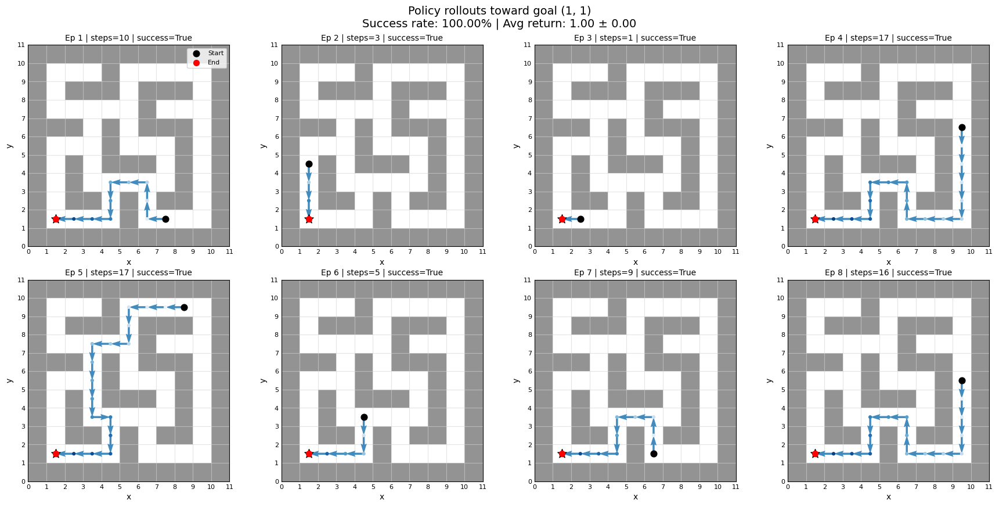

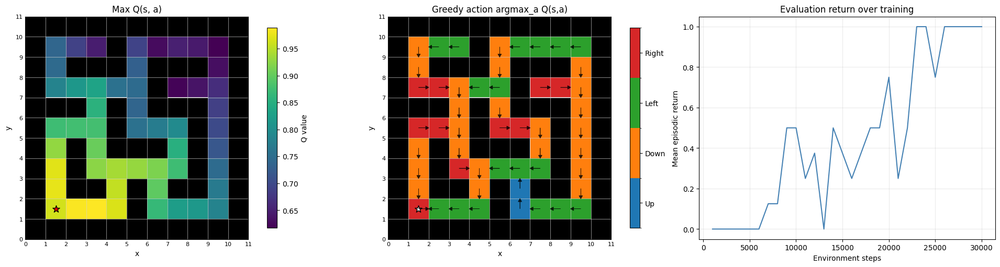

Embedding mode: all_discrete
states_base: (52, 2)
coords_base: (52, 2)
phi(s,a) base: (52, 4, 64)
psi(z) / task code base: (1, 64)
phi(s,a) norms: mean=1.0000, std=0.0000
top 5 singular values: [3.9673004 3.3721645 2.820512  2.5973334 2.4603913]
cumulative variance (first 5 dims): [0.25188532 0.43386805 0.5611799  0.6691412  0.7660183 ]
cos(phi(s,a), psi/task): mean=0.7373, std=0.1259


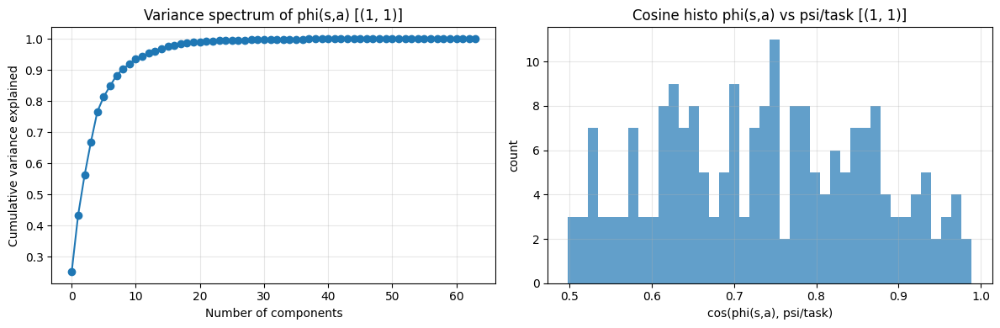


Goal embedding cosine similarity matrix:
     (7, 7)     (4, 1)     (1, 1)
  (7, 7)      1.000      1.000      0.884
  (4, 1)      1.000      1.000      0.887
  (1, 1)      0.884      0.887      1.000

Off-diagonal mean similarity: 0.924
Off-diagonal min similarity: 0.884
Off-diagonal max similarity: 1.000

----- seed=456, goal=(2, 5) -----

Mean squared deltas (first few): [0.0, 0.0, 0.0, 0.0]
[DQN-factorised] step=   1000 | eps=0.981 | eval_return=0.125 | eval_len=87.6 | TD=0.000 | ReplayTD=0.000 | Ortho=0.000 | SigReg=0.000 | EWC=0.000000 | Loss=0.000| goal_reg_loss=0.0000
Mean squared deltas (first few): [0.0, 0.0, 0.0, 0.0]
[DQN-factorised] step=   2000 | eps=0.962 | eval_return=0.000 | eval_len=100.0 | TD=0.000 | ReplayTD=0.000 | Ortho=0.000 | SigReg=0.000 | EWC=0.000000 | Loss=0.000| goal_reg_loss=0.0000
Mean squared deltas (first few): [0.0, 0.0, 0.0, 0.0]
[DQN-factorised] step=   3000 | eps=0.943 | eval_return=0.000 | eval_len=100.0 | TD=0.000 | ReplayTD=0.000 | Ortho=0.000 |

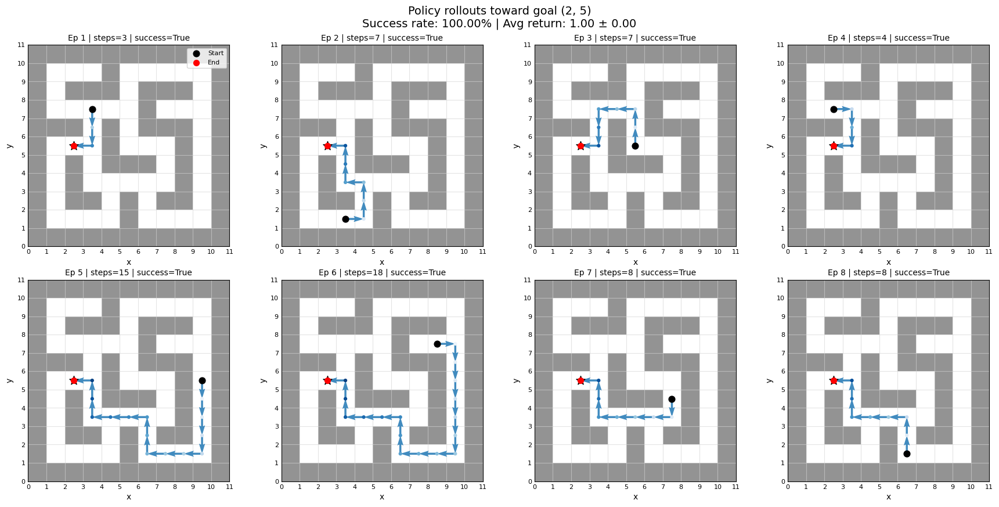

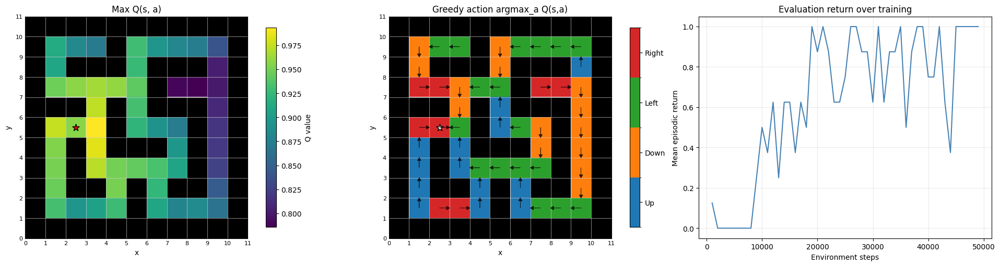

Embedding mode: all_discrete
states_base: (52, 2)
coords_base: (52, 2)
phi(s,a) base: (52, 4, 64)
psi(z) / task code base: (1, 64)
phi(s,a) norms: mean=1.0000, std=0.0000
top 5 singular values: [3.3590388 3.0109148 2.7686005 2.3802755 2.226016 ]
cumulative variance (first 5 dims): [0.21783659 0.39286062 0.5408469  0.65023124 0.7458972 ]
cos(phi(s,a), psi/task): mean=0.8439, std=0.0753


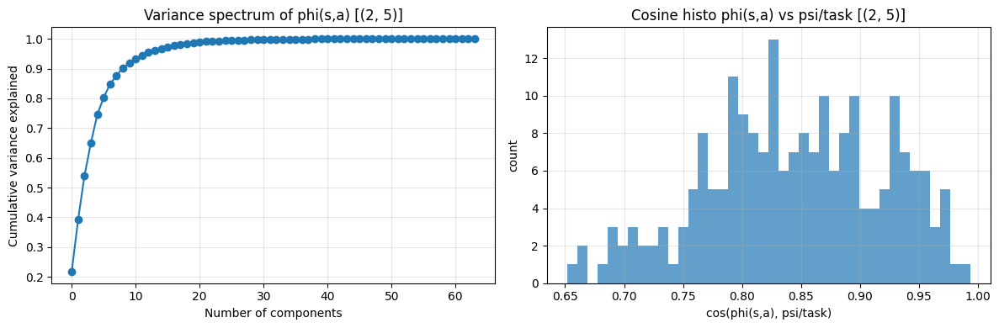


Goal embedding cosine similarity matrix:
     (7, 7)     (4, 1)     (1, 1)     (2, 5)
  (7, 7)      1.000      1.000      0.884      0.963
  (4, 1)      1.000      1.000      0.887      0.965
  (1, 1)      0.884      0.887      1.000      0.977
  (2, 5)      0.963      0.965      0.977      1.000

Off-diagonal mean similarity: 0.946
Off-diagonal min similarity: 0.884
Off-diagonal max similarity: 1.000

----- seed=456, goal=(5, 3) -----

Mean squared deltas (first few): [0.0, 0.0, 0.0, 0.0]
[DQN-factorised] step=   1000 | eps=0.981 | eval_return=0.000 | eval_len=100.0 | TD=0.000 | ReplayTD=0.000 | Ortho=0.000 | SigReg=0.000 | EWC=0.000000 | Loss=0.000| goal_reg_loss=0.0000
Mean squared deltas (first few): [0.0, 0.0, 0.0, 0.0]
[DQN-factorised] step=   2000 | eps=0.962 | eval_return=0.000 | eval_len=100.0 | TD=0.000 | ReplayTD=0.000 | Ortho=0.000 | SigReg=0.000 | EWC=0.000000 | Loss=0.000| goal_reg_loss=0.0000
Mean squared deltas (first few): [0.0, 0.0, 0.0, 0.0]
[DQN-factorised] step=  

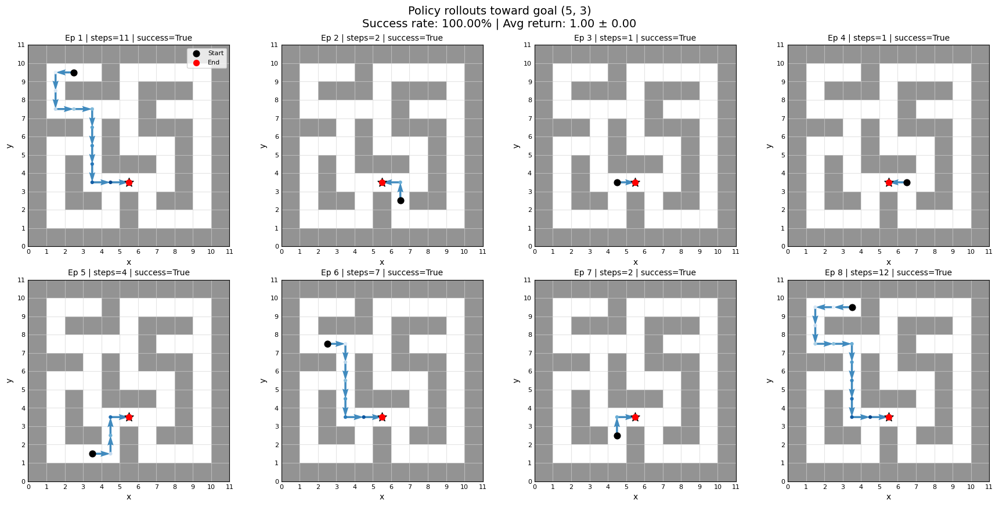

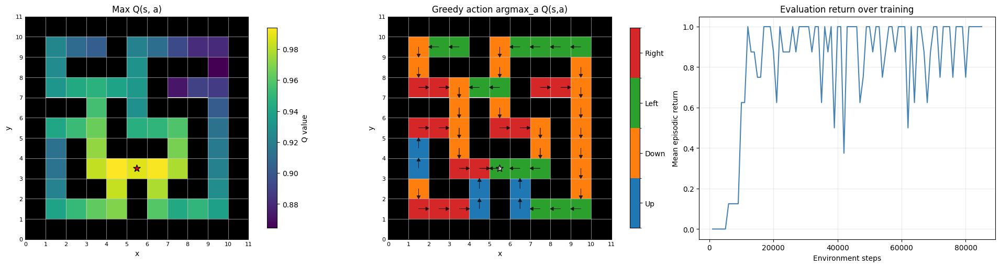

Embedding mode: all_discrete
states_base: (52, 2)
coords_base: (52, 2)
phi(s,a) base: (52, 4, 64)
psi(z) / task code base: (1, 64)
phi(s,a) norms: mean=1.0000, std=0.0000
top 5 singular values: [2.9132802 2.7256527 2.3505898 2.2676613 2.147702 ]
cumulative variance (first 5 dims): [0.19430573 0.3643892  0.4908846  0.608612   0.71421325]
cos(phi(s,a), psi/task): mean=0.8780, std=0.0600


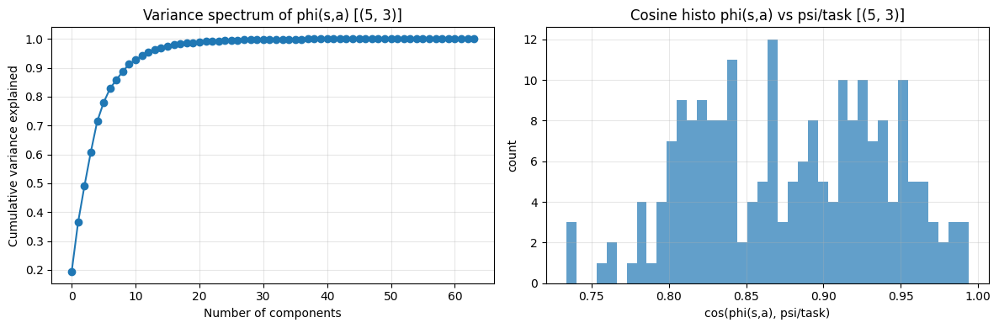


Goal embedding cosine similarity matrix:
     (7, 7)     (4, 1)     (1, 1)     (2, 5)     (5, 3)
  (7, 7)      1.000      1.000      0.884      0.963      1.000
  (4, 1)      1.000      1.000      0.887      0.965      1.000
  (1, 1)      0.884      0.887      1.000      0.977      0.887
  (2, 5)      0.963      0.965      0.977      1.000      0.965
  (5, 3)      1.000      1.000      0.887      0.965      1.000

Off-diagonal mean similarity: 0.953
Off-diagonal min similarity: 0.884
Off-diagonal max similarity: 1.000

----- seed=456, goal=(1, 3) -----

Mean squared deltas (first few): [0.0, 0.0, 0.0, 0.0]
[DQN-factorised] step=   1000 | eps=0.981 | eval_return=0.250 | eval_len=75.4 | TD=0.000 | ReplayTD=0.000 | Ortho=0.000 | SigReg=0.000 | EWC=0.000000 | Loss=0.000| goal_reg_loss=0.0000
Mean squared deltas (first few): [0.0, 0.0, 0.0, 0.0]
[DQN-factorised] step=   2000 | eps=0.962 | eval_return=0.000 | eval_len=100.0 | TD=0.000 | ReplayTD=0.000 | Ortho=0.000 | SigReg=0.000 | EWC=0.00

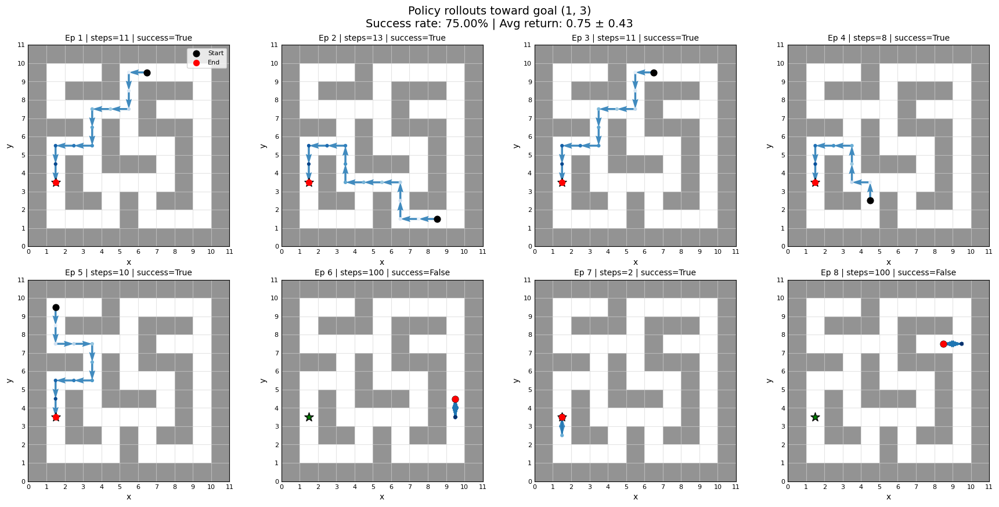

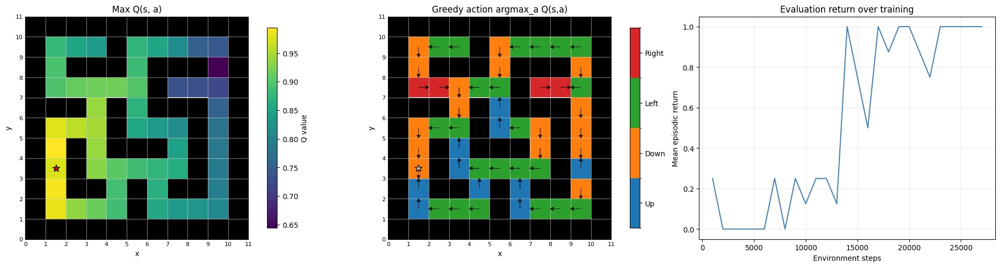

Embedding mode: all_discrete
states_base: (52, 2)
coords_base: (52, 2)
phi(s,a) base: (52, 4, 64)
psi(z) / task code base: (1, 64)
phi(s,a) norms: mean=1.0000, std=0.0000
top 5 singular values: [3.1268802 2.9478054 2.4818602 2.31579   2.2143362]
cumulative variance (first 5 dims): [0.19759652 0.3732086  0.497692   0.6060735  0.7051667 ]
cos(phi(s,a), psi/task): mean=0.8015, std=0.0913


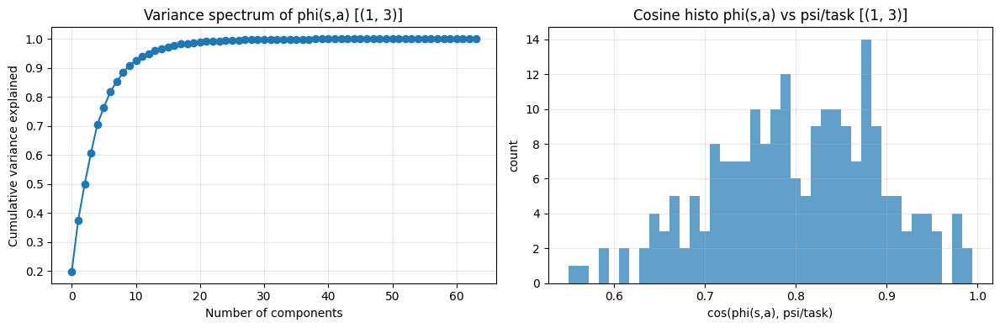


Goal embedding cosine similarity matrix:
     (7, 7)     (4, 1)     (1, 1)     (2, 5)     (5, 3)     (1, 3)
  (7, 7)      1.000      1.000      0.884      0.963      1.000      0.771
  (4, 1)      1.000      1.000      0.887      0.965      1.000      0.776
  (1, 1)      0.884      0.887      1.000      0.977      0.887      0.979
  (2, 5)      0.963      0.965      0.977      1.000      0.965      0.913
  (5, 3)      1.000      1.000      0.887      0.965      1.000      0.775
  (1, 3)      0.771      0.776      0.979      0.913      0.775      1.000

Off-diagonal mean similarity: 0.916
Off-diagonal min similarity: 0.771
Off-diagonal max similarity: 1.000

----- seed=456, goal=(3, 1) -----

Mean squared deltas (first few): [0.0, 0.0, 0.0, 0.0]
[DQN-factorised] step=   1000 | eps=0.981 | eval_return=0.000 | eval_len=100.0 | TD=0.000 | ReplayTD=0.000 | Ortho=0.000 | SigReg=0.000 | EWC=0.000000 | Loss=0.000| goal_reg_loss=0.0000
Mean squared deltas (first few): [0.0, 0.0, 0.0, 0.0]
[DQN

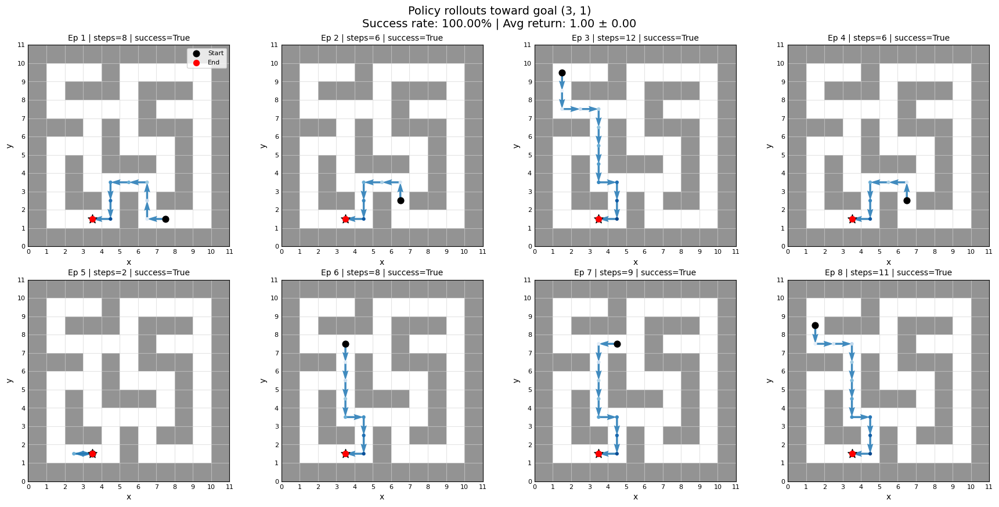

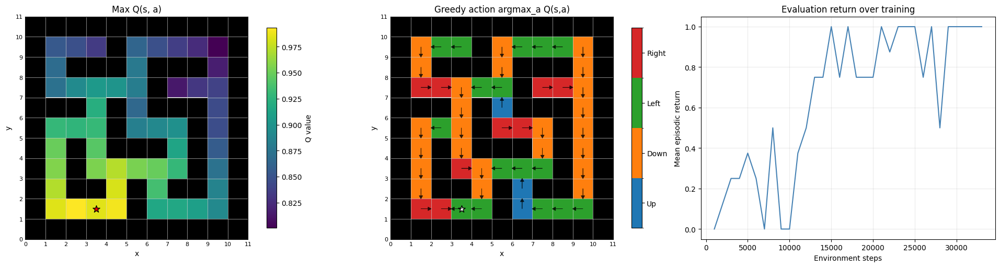

Embedding mode: all_discrete
states_base: (52, 2)
coords_base: (52, 2)
phi(s,a) base: (52, 4, 64)
psi(z) / task code base: (1, 64)
phi(s,a) norms: mean=1.0000, std=0.0000
top 5 singular values: [3.0419688 2.8540573 2.3369658 2.3091235 2.0577488]
cumulative variance (first 5 dims): [0.2003959  0.3767984  0.49507093 0.6105421  0.702241  ]
cos(phi(s,a), psi/task): mean=0.8402, std=0.0741


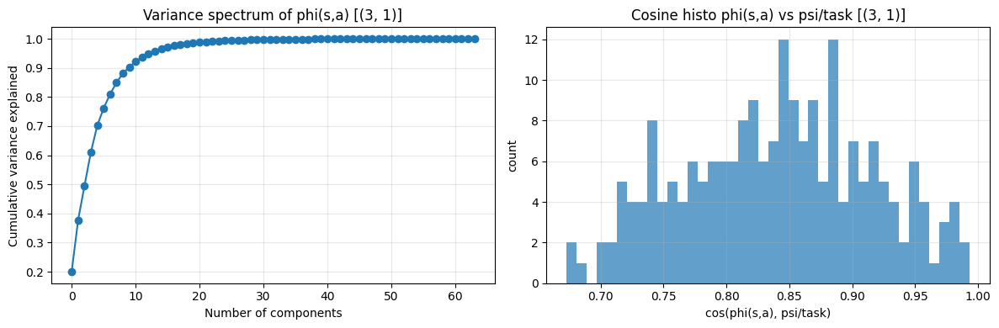


Goal embedding cosine similarity matrix:
     (7, 7)     (4, 1)     (1, 1)     (2, 5)     (5, 3)     (1, 3)     (3, 1)
  (7, 7)      1.000      1.000      0.884      0.963      1.000      0.771      0.790
  (4, 1)      1.000      1.000      0.887      0.965      1.000      0.776      0.794
  (1, 1)      0.884      0.887      1.000      0.977      0.887      0.979      0.952
  (2, 5)      0.963      0.965      0.977      1.000      0.965      0.913      0.904
  (5, 3)      1.000      1.000      0.887      0.965      1.000      0.775      0.794
  (1, 3)      0.771      0.776      0.979      0.913      0.775      1.000      0.953
  (3, 1)      0.790      0.794      0.952      0.904      0.794      0.953      1.000

Off-diagonal mean similarity: 0.901
Off-diagonal min similarity: 0.771
Off-diagonal max similarity: 1.000

----- seed=456, goal=(9, 5) -----

Mean squared deltas (first few): [0.0, 0.0, 0.0, 0.0]
[DQN-factorised] step=   1000 | eps=0.981 | eval_return=0.125 | eval_len=88.0 | T

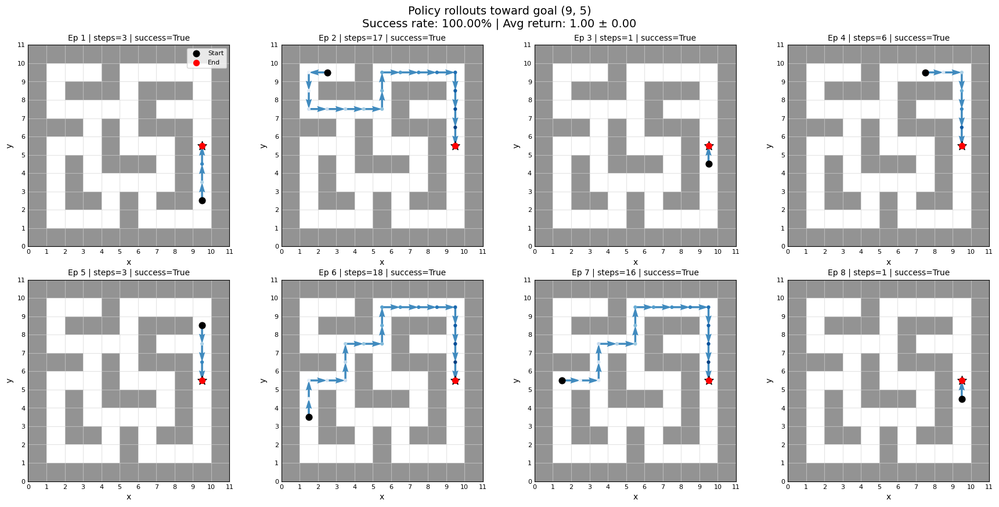

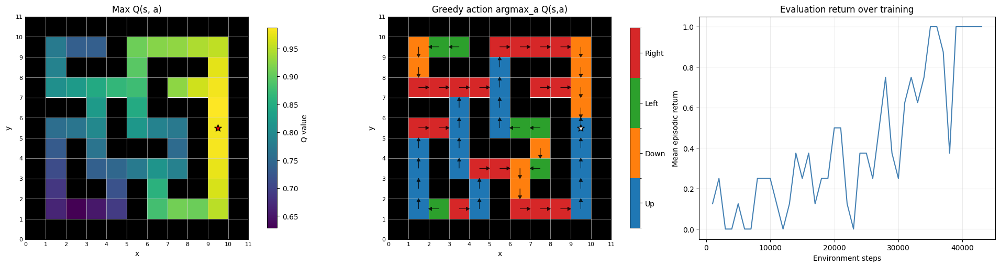

Embedding mode: all_discrete
states_base: (52, 2)
coords_base: (52, 2)
phi(s,a) base: (52, 4, 64)
psi(z) / task code base: (1, 64)
phi(s,a) norms: mean=1.0000, std=0.0000
top 5 singular values: [3.3987508 3.012141  2.67404   2.340011  1.8900777]
cumulative variance (first 5 dims): [0.22727922 0.40579295 0.5464809  0.6542159  0.72450376]
cos(phi(s,a), psi/task): mean=0.7646, std=0.1138


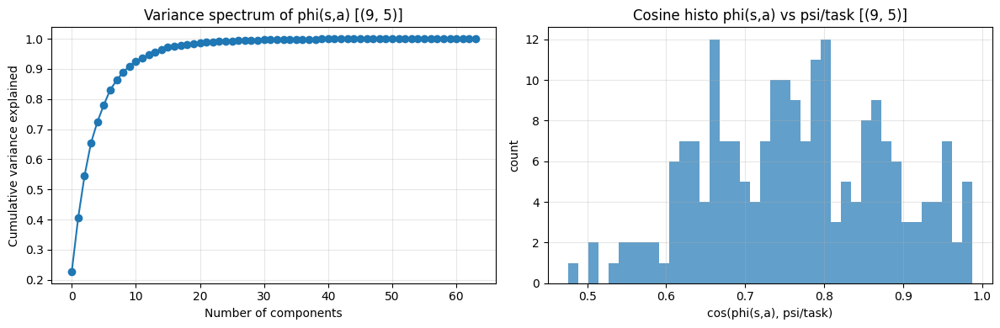


Goal embedding cosine similarity matrix:
     (7, 7)     (4, 1)     (1, 1)     (2, 5)     (5, 3)     (1, 3)     (3, 1)     (9, 5)
  (7, 7)      1.000      1.000      0.884      0.963      1.000      0.771      0.790      0.961
  (4, 1)      1.000      1.000      0.887      0.965      1.000      0.776      0.794      0.959
  (1, 1)      0.884      0.887      1.000      0.977      0.887      0.979      0.952      0.721
  (2, 5)      0.963      0.965      0.977      1.000      0.965      0.913      0.904      0.853
  (5, 3)      1.000      1.000      0.887      0.965      1.000      0.775      0.794      0.959
  (1, 3)      0.771      0.776      0.979      0.913      0.775      1.000      0.953      0.567
  (3, 1)      0.790      0.794      0.952      0.904      0.794      0.953      1.000      0.606
  (9, 5)      0.961      0.959      0.721      0.853      0.959      0.567      0.606      1.000

Off-diagonal mean similarity: 0.877
Off-diagonal min similarity: 0.567
Off-diagonal max simi

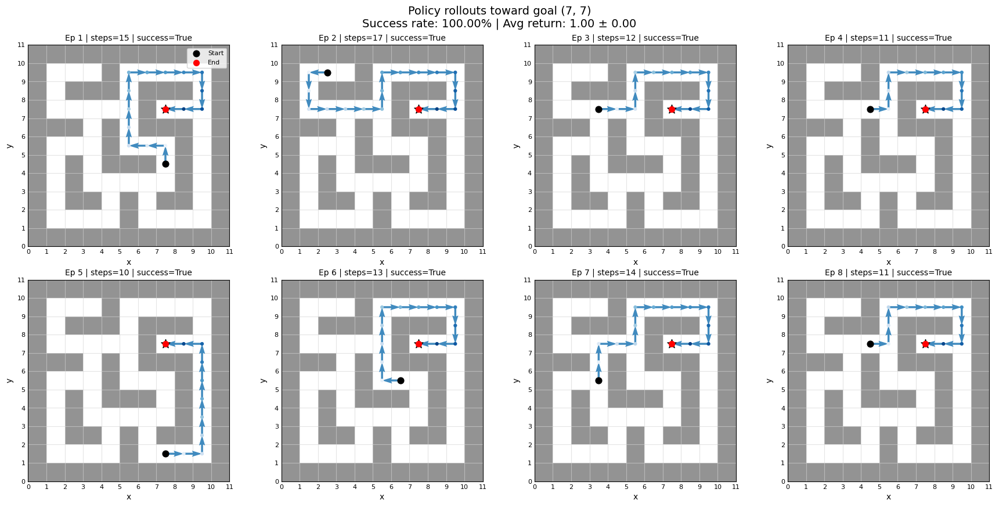

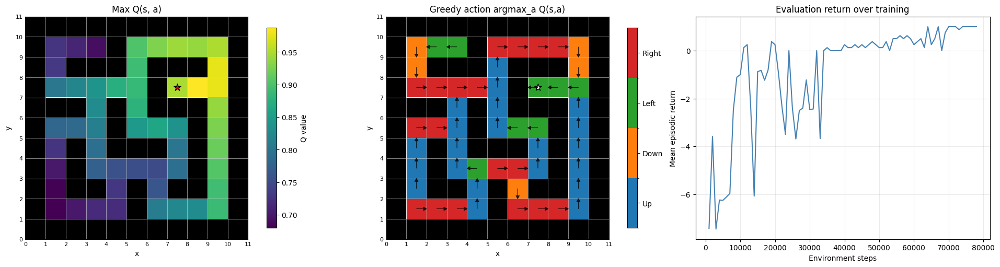

Embedding mode: all_discrete
states_base: (52, 2)
coords_base: (52, 2)
phi(s,a) base: (52, 4, 64)
psi(z) / task code base: (1, 64)
phi(s,a) norms: mean=1.0000, std=0.0000
top 5 singular values: [4.8685417 2.8319454 2.6349442 2.1026168 1.7784863]
cumulative variance (first 5 dims): [0.4120546  0.5514751  0.672173   0.7490289  0.80401564]
cos(phi(s,a), psi/task): mean=0.7647, std=0.1058


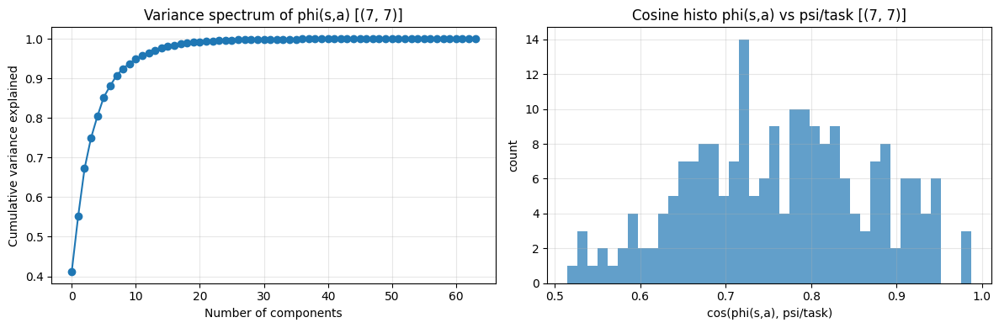


Goal embedding cosine similarity matrix:
     (7, 7)
  (7, 7)      1.000

----- seed=789, goal=(4, 1) -----

Mean squared deltas (first few): [0.0, 0.0, 0.0, 0.0]
[DQN-factorised] step=   1000 | eps=0.981 | eval_return=0.125 | eval_len=87.9 | TD=0.000 | ReplayTD=0.000 | Ortho=0.000 | SigReg=0.000 | EWC=0.000000 | Loss=0.000| goal_reg_loss=0.0000
Mean squared deltas (first few): [0.0, 0.0, 0.0, 0.0]
[DQN-factorised] step=   2000 | eps=0.962 | eval_return=0.000 | eval_len=100.0 | TD=0.000 | ReplayTD=0.000 | Ortho=0.000 | SigReg=0.000 | EWC=0.000000 | Loss=0.000| goal_reg_loss=0.0000
Mean squared deltas (first few): [0.0, 0.0, 0.0, 0.0]
[DQN-factorised] step=   3000 | eps=0.943 | eval_return=0.000 | eval_len=100.0 | TD=0.000 | ReplayTD=0.000 | Ortho=0.000 | SigReg=0.000 | EWC=0.000000 | Loss=0.000| goal_reg_loss=0.0000
Mean squared deltas (first few): [0.0, 0.0, 0.0, 0.0]
[DQN-factorised] step=   4000 | eps=0.924 | eval_return=0.000 | eval_len=100.0 | TD=0.000 | ReplayTD=0.000 | Ortho=0.

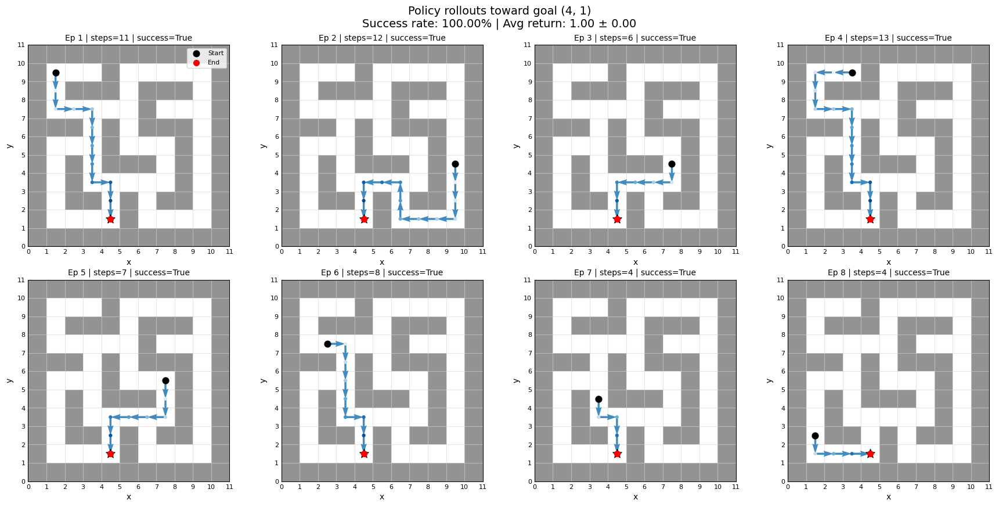

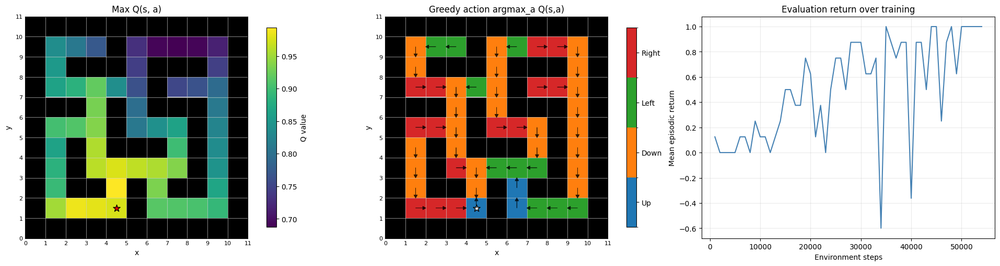

Embedding mode: all_discrete
states_base: (52, 2)
coords_base: (52, 2)
phi(s,a) base: (52, 4, 64)
psi(z) / task code base: (1, 64)
phi(s,a) norms: mean=1.0000, std=0.0000
top 5 singular values: [4.160884  3.2726493 2.5137827 2.3421612 1.9488662]
cumulative variance (first 5 dims): [0.30442676 0.4927529  0.60386646 0.700326   0.7671105 ]
cos(phi(s,a), psi/task): mean=0.8035, std=0.0979


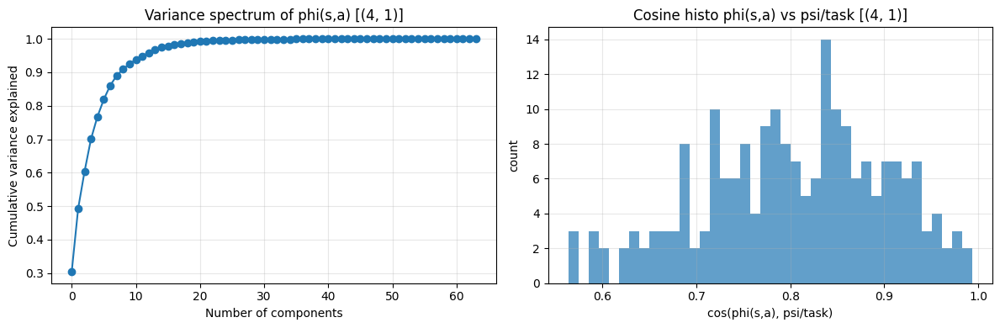


Goal embedding cosine similarity matrix:
     (7, 7)     (4, 1)
  (7, 7)      1.000      1.000
  (4, 1)      1.000      1.000

Off-diagonal mean similarity: 1.000
Off-diagonal min similarity: 1.000
Off-diagonal max similarity: 1.000

----- seed=789, goal=(1, 1) -----

Mean squared deltas (first few): [0.0, 0.0, 0.0, 0.0]
[DQN-factorised] step=   1000 | eps=0.981 | eval_return=0.000 | eval_len=100.0 | TD=0.000 | ReplayTD=0.000 | Ortho=0.000 | SigReg=0.000 | EWC=0.000000 | Loss=0.000| goal_reg_loss=0.0000
Mean squared deltas (first few): [0.0, 0.0, 0.0, 0.0]
[DQN-factorised] step=   2000 | eps=0.962 | eval_return=0.250 | eval_len=75.8 | TD=0.000 | ReplayTD=0.000 | Ortho=0.000 | SigReg=0.000 | EWC=0.000000 | Loss=0.000| goal_reg_loss=0.0000
Mean squared deltas (first few): [0.0, 0.0, 0.0, 0.0]
[DQN-factorised] step=   3000 | eps=0.943 | eval_return=0.125 | eval_len=87.9 | TD=0.000 | ReplayTD=0.000 | Ortho=0.000 | SigReg=0.000 | EWC=0.000000 | Loss=0.000| goal_reg_loss=0.0000
Mean squared

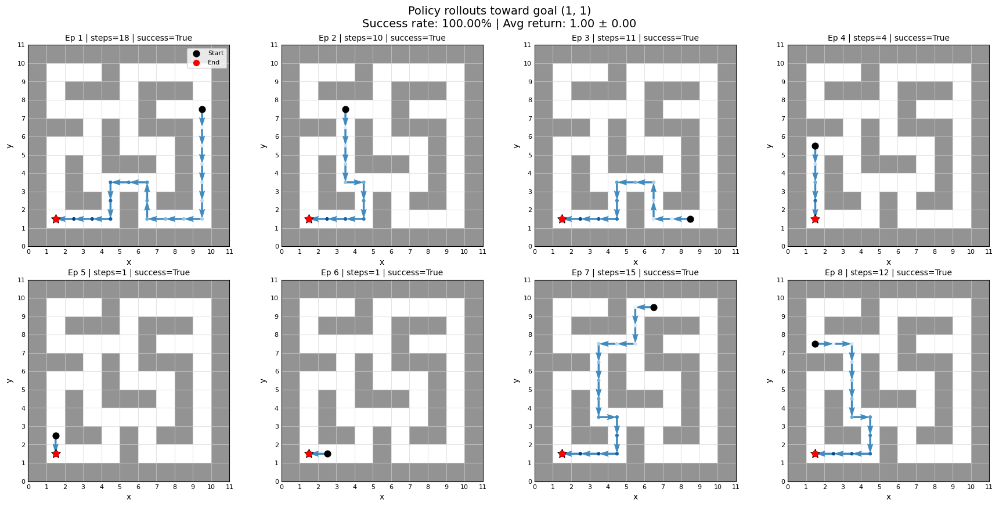

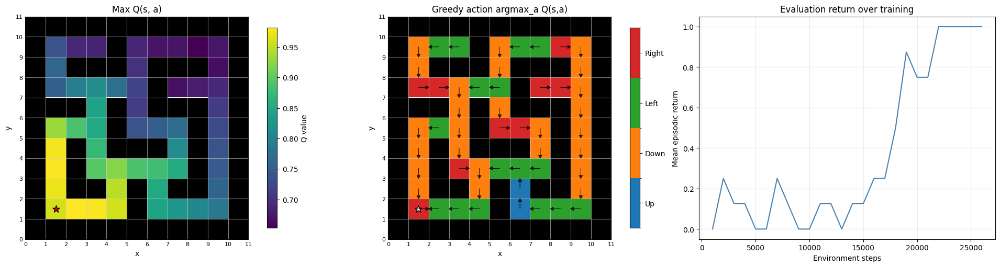

Embedding mode: all_discrete
states_base: (52, 2)
coords_base: (52, 2)
phi(s,a) base: (52, 4, 64)
psi(z) / task code base: (1, 64)
phi(s,a) norms: mean=1.0000, std=0.0000
top 5 singular values: [3.8872993 3.4022093 2.5918543 2.4342043 2.099657 ]
cumulative variance (first 5 dims): [0.24795568 0.43788856 0.5481184  0.6453466  0.717686  ]
cos(phi(s,a), psi/task): mean=0.7398, std=0.1132


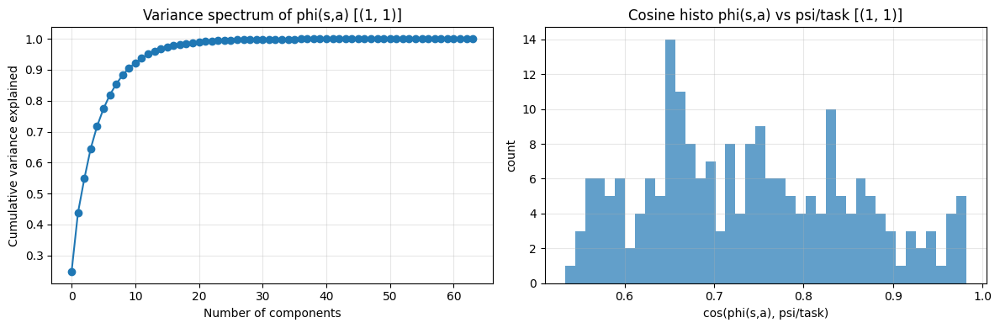


Goal embedding cosine similarity matrix:
     (7, 7)     (4, 1)     (1, 1)
  (7, 7)      1.000      1.000      0.881
  (4, 1)      1.000      1.000      0.886
  (1, 1)      0.881      0.886      1.000

Off-diagonal mean similarity: 0.922
Off-diagonal min similarity: 0.881
Off-diagonal max similarity: 1.000

----- seed=789, goal=(2, 5) -----

Mean squared deltas (first few): [0.0, 0.0, 0.0, 0.0]
[DQN-factorised] step=   1000 | eps=0.981 | eval_return=0.000 | eval_len=100.0 | TD=0.000 | ReplayTD=0.000 | Ortho=0.000 | SigReg=0.000 | EWC=0.000000 | Loss=0.000| goal_reg_loss=0.0000
Mean squared deltas (first few): [0.0, 0.0, 0.0, 0.0]
[DQN-factorised] step=   2000 | eps=0.962 | eval_return=0.000 | eval_len=100.0 | TD=0.000 | ReplayTD=0.000 | Ortho=0.000 | SigReg=0.000 | EWC=0.000000 | Loss=0.000| goal_reg_loss=0.0000
Mean squared deltas (first few): [0.0, 0.0, 0.0, 0.0]
[DQN-factorised] step=   3000 | eps=0.943 | eval_return=0.000 | eval_len=100.0 | TD=0.000 | ReplayTD=0.000 | Ortho=0.000 

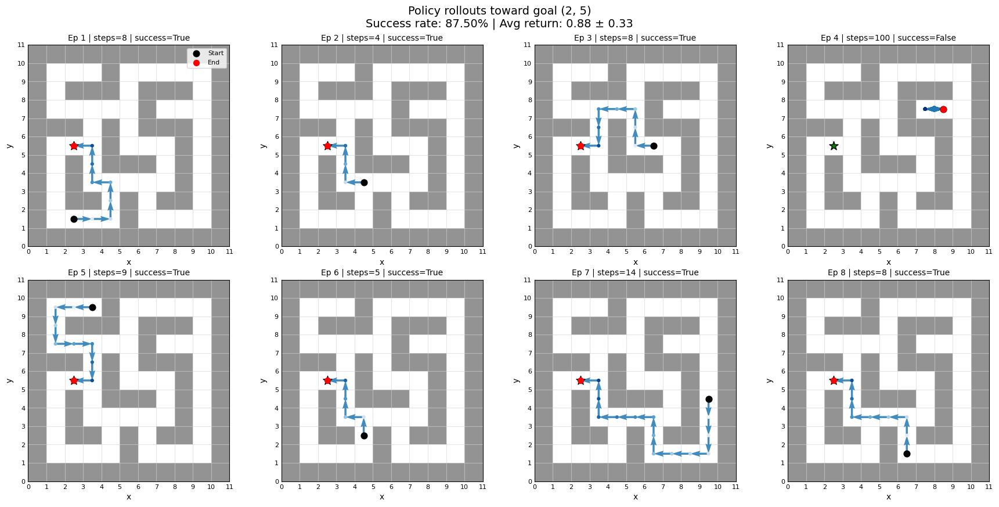

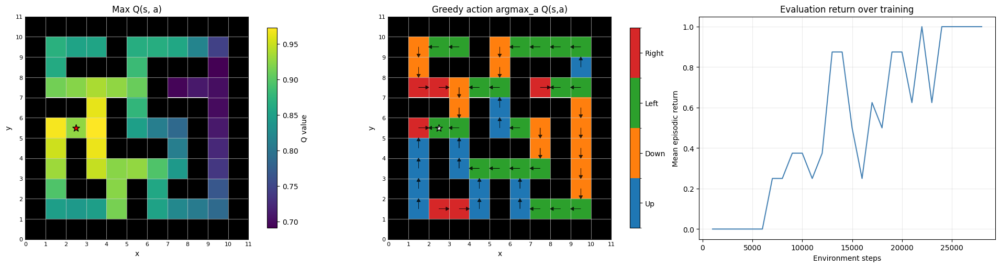

Embedding mode: all_discrete
states_base: (52, 2)
coords_base: (52, 2)
phi(s,a) base: (52, 4, 64)
psi(z) / task code base: (1, 64)
phi(s,a) norms: mean=1.0000, std=0.0000
top 5 singular values: [3.722548  3.2513263 2.9254682 2.6981552 2.1313603]
cumulative variance (first 5 dims): [0.21928722 0.386571   0.52200365 0.6372074  0.70909375]
cos(phi(s,a), psi/task): mean=0.7878, std=0.0988


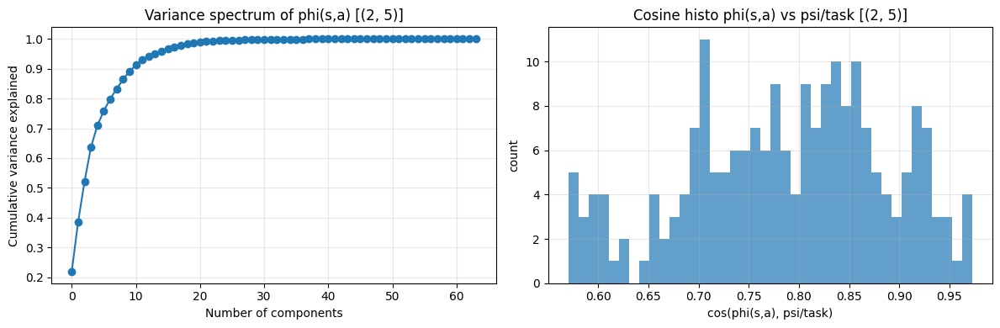


Goal embedding cosine similarity matrix:
     (7, 7)     (4, 1)     (1, 1)     (2, 5)
  (7, 7)      1.000      1.000      0.881      0.964
  (4, 1)      1.000      1.000      0.886      0.966
  (1, 1)      0.881      0.886      1.000      0.975
  (2, 5)      0.964      0.966      0.975      1.000

Off-diagonal mean similarity: 0.945
Off-diagonal min similarity: 0.881
Off-diagonal max similarity: 1.000

----- seed=789, goal=(5, 3) -----

Mean squared deltas (first few): [0.0, 0.0, 0.0, 0.0]
[DQN-factorised] step=   1000 | eps=0.981 | eval_return=0.250 | eval_len=76.1 | TD=0.000 | ReplayTD=0.000 | Ortho=0.000 | SigReg=0.000 | EWC=0.000000 | Loss=0.000| goal_reg_loss=0.0000
Mean squared deltas (first few): [0.0, 0.0, 0.0, 0.0]
[DQN-factorised] step=   2000 | eps=0.962 | eval_return=0.375 | eval_len=64.9 | TD=0.000 | ReplayTD=0.000 | Ortho=0.000 | SigReg=0.000 | EWC=0.000000 | Loss=0.000| goal_reg_loss=0.0000
Mean squared deltas (first few): [0.0, 0.0, 0.0, 0.0]
[DQN-factorised] step=   3

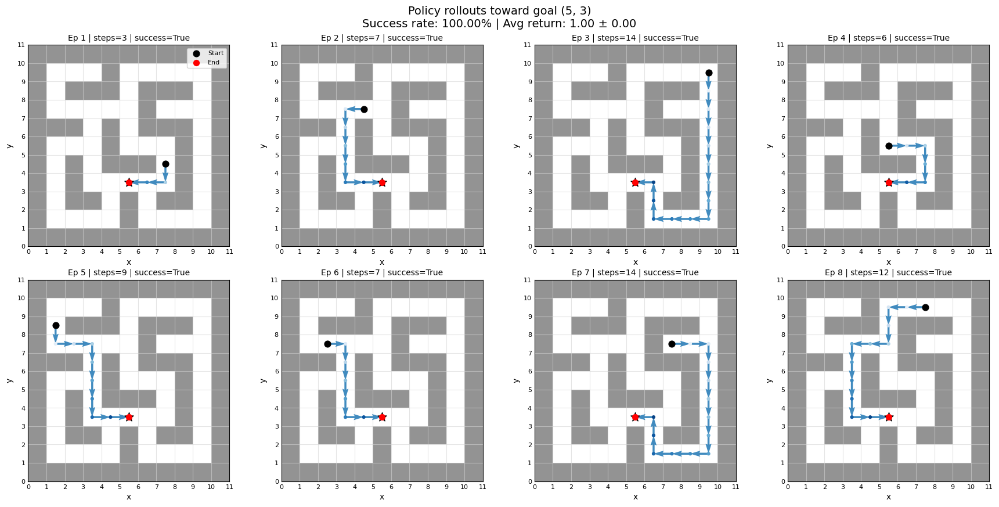

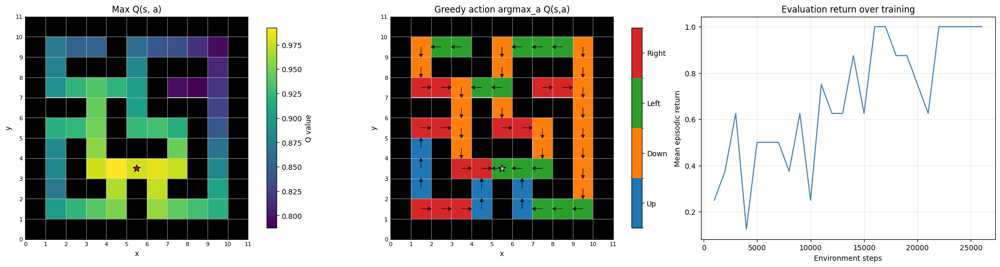

Embedding mode: all_discrete
states_base: (52, 2)
coords_base: (52, 2)
phi(s,a) base: (52, 4, 64)
psi(z) / task code base: (1, 64)
phi(s,a) norms: mean=1.0000, std=0.0000
top 5 singular values: [3.5162082 2.950584  2.643817  2.3822052 2.0368376]
cumulative variance (first 5 dims): [0.21813974 0.3717434  0.49506763 0.59519297 0.6683908 ]
cos(phi(s,a), psi/task): mean=0.8413, std=0.0758


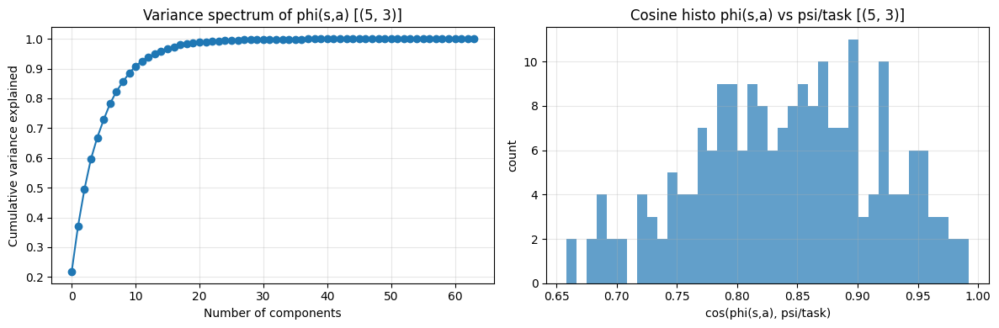


Goal embedding cosine similarity matrix:
     (7, 7)     (4, 1)     (1, 1)     (2, 5)     (5, 3)
  (7, 7)      1.000      1.000      0.881      0.964      1.000
  (4, 1)      1.000      1.000      0.886      0.966      1.000
  (1, 1)      0.881      0.886      1.000      0.975      0.886
  (2, 5)      0.964      0.966      0.975      1.000      0.967
  (5, 3)      1.000      1.000      0.886      0.967      1.000

Off-diagonal mean similarity: 0.952
Off-diagonal min similarity: 0.881
Off-diagonal max similarity: 1.000

----- seed=789, goal=(1, 3) -----

Mean squared deltas (first few): [0.0, 0.0, 0.0, 0.0]
[DQN-factorised] step=   1000 | eps=0.981 | eval_return=0.125 | eval_len=87.9 | TD=0.000 | ReplayTD=0.000 | Ortho=0.000 | SigReg=0.000 | EWC=0.000000 | Loss=0.000| goal_reg_loss=0.0000
Mean squared deltas (first few): [0.0, 0.0, 0.0, 0.0]
[DQN-factorised] step=   2000 | eps=0.962 | eval_return=0.000 | eval_len=100.0 | TD=0.000 | ReplayTD=0.000 | Ortho=0.000 | SigReg=0.000 | EWC=0.00

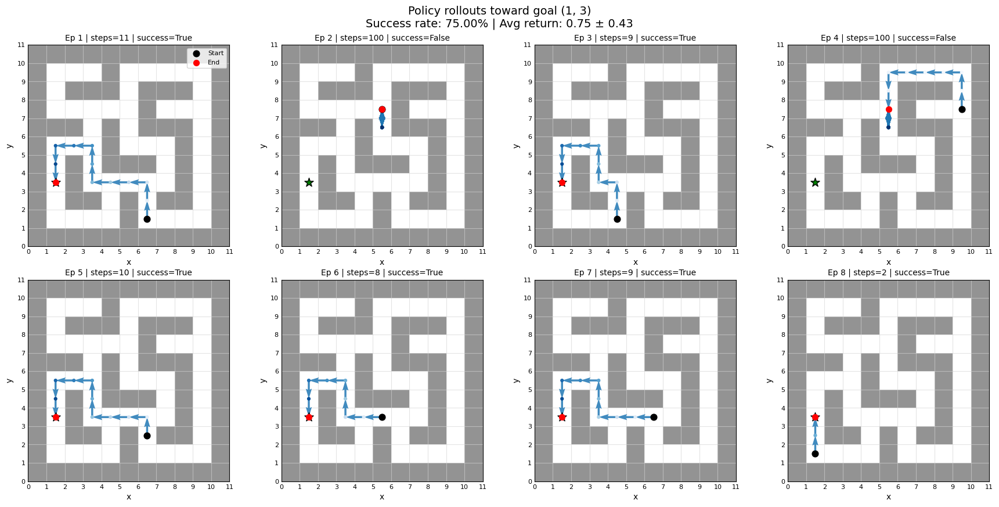

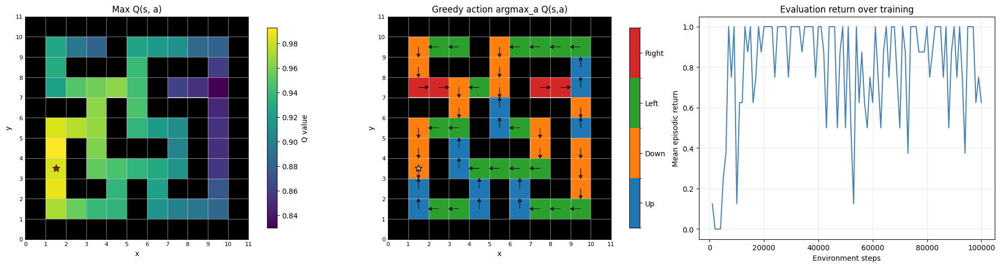

Embedding mode: all_discrete
states_base: (52, 2)
coords_base: (52, 2)
phi(s,a) base: (52, 4, 64)
psi(z) / task code base: (1, 64)
phi(s,a) norms: mean=1.0000, std=0.0000
top 5 singular values: [2.9016447 2.6231482 2.326052  2.2970552 1.9866176]
cumulative variance (first 5 dims): [0.18430853 0.33493546 0.45337474 0.5688795  0.65527385]
cos(phi(s,a), psi/task): mean=0.8645, std=0.0655


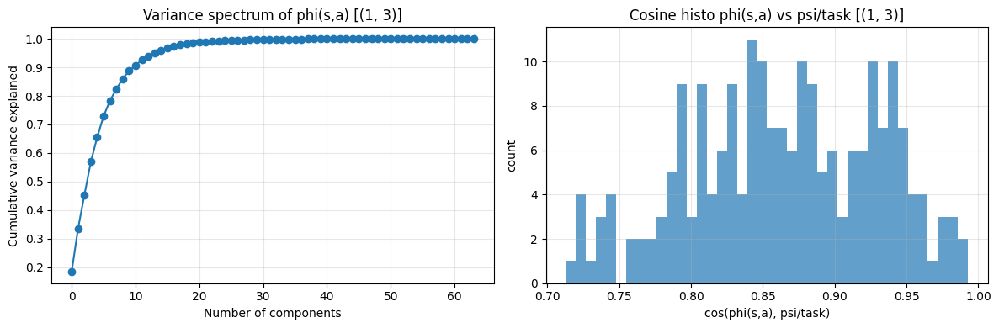


Goal embedding cosine similarity matrix:
     (7, 7)     (4, 1)     (1, 1)     (2, 5)     (5, 3)     (1, 3)
  (7, 7)      1.000      1.000      0.881      0.964      1.000      0.768
  (4, 1)      1.000      1.000      0.886      0.966      1.000      0.774
  (1, 1)      0.881      0.886      1.000      0.975      0.886      0.980
  (2, 5)      0.964      0.966      0.975      1.000      0.967      0.911
  (5, 3)      1.000      1.000      0.886      0.967      1.000      0.775
  (1, 3)      0.768      0.774      0.980      0.911      0.775      1.000

Off-diagonal mean similarity: 0.916
Off-diagonal min similarity: 0.768
Off-diagonal max similarity: 1.000

----- seed=789, goal=(3, 1) -----

Mean squared deltas (first few): [0.0, 0.0, 0.0, 0.0]
[DQN-factorised] step=   1000 | eps=0.981 | eval_return=0.375 | eval_len=64.1 | TD=0.000 | ReplayTD=0.000 | Ortho=0.000 | SigReg=0.000 | EWC=0.000000 | Loss=0.000| goal_reg_loss=0.0000
Mean squared deltas (first few): [0.0, 0.0, 0.0, 0.0]
[DQN-

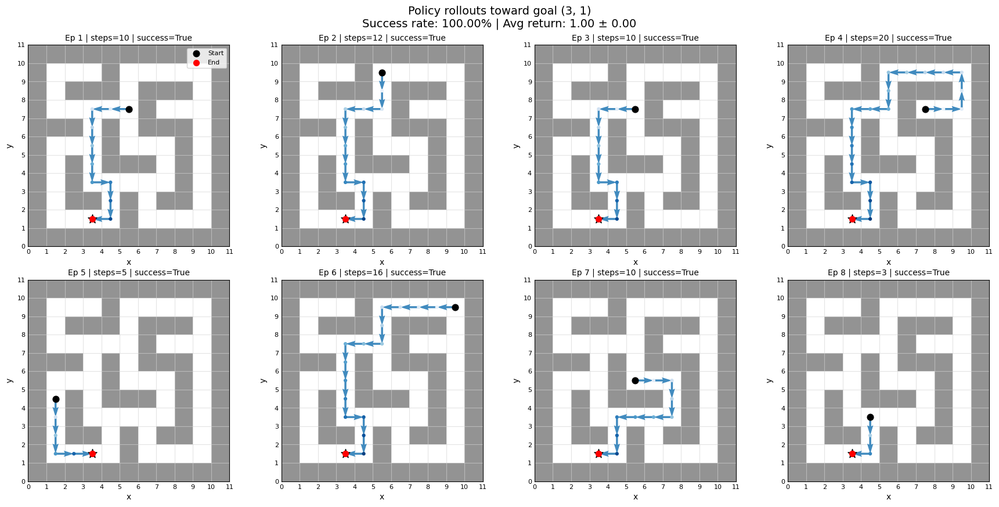

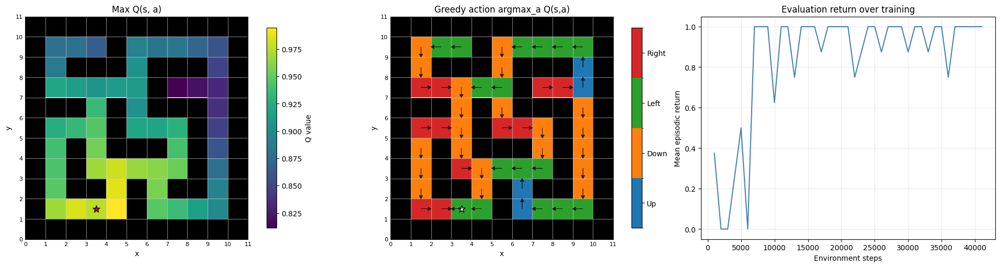

Embedding mode: all_discrete
states_base: (52, 2)
coords_base: (52, 2)
phi(s,a) base: (52, 4, 64)
psi(z) / task code base: (1, 64)
phi(s,a) norms: mean=1.0000, std=0.0000
top 5 singular values: [3.0041852 2.664218  2.4886096 2.279212  2.0652046]
cumulative variance (first 5 dims): [0.18419926 0.32906777 0.45546806 0.561492   0.6485404 ]
cos(phi(s,a), psi/task): mean=0.8542, std=0.0708


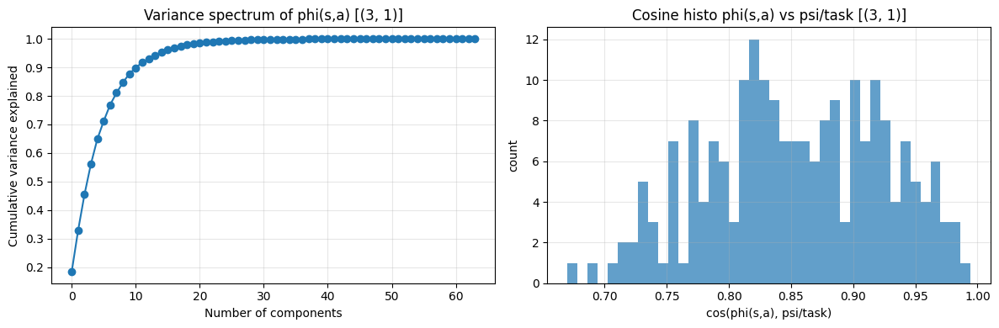


Goal embedding cosine similarity matrix:
     (7, 7)     (4, 1)     (1, 1)     (2, 5)     (5, 3)     (1, 3)     (3, 1)
  (7, 7)      1.000      1.000      0.881      0.964      1.000      0.768      0.789
  (4, 1)      1.000      1.000      0.886      0.966      1.000      0.774      0.795
  (1, 1)      0.881      0.886      1.000      0.975      0.886      0.980      0.959
  (2, 5)      0.964      0.966      0.975      1.000      0.967      0.911      0.907
  (5, 3)      1.000      1.000      0.886      0.967      1.000      0.775      0.796
  (1, 3)      0.768      0.774      0.980      0.911      0.775      1.000      0.961
  (3, 1)      0.789      0.795      0.959      0.907      0.796      0.961      1.000

Off-diagonal mean similarity: 0.902
Off-diagonal min similarity: 0.768
Off-diagonal max similarity: 1.000

----- seed=789, goal=(9, 5) -----

Mean squared deltas (first few): [0.0, 0.0, 0.0, 0.0]
[DQN-factorised] step=   1000 | eps=0.981 | eval_return=0.000 | eval_len=100.0 | 

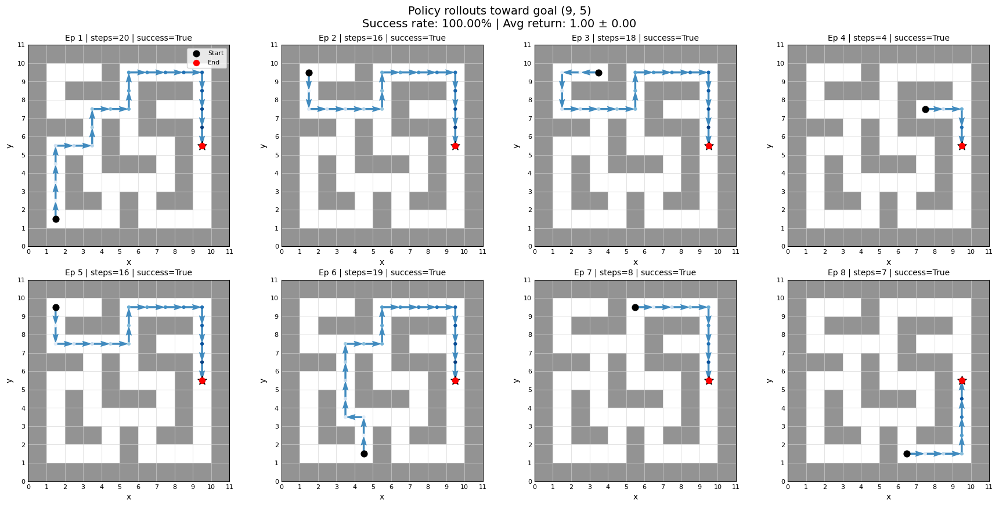

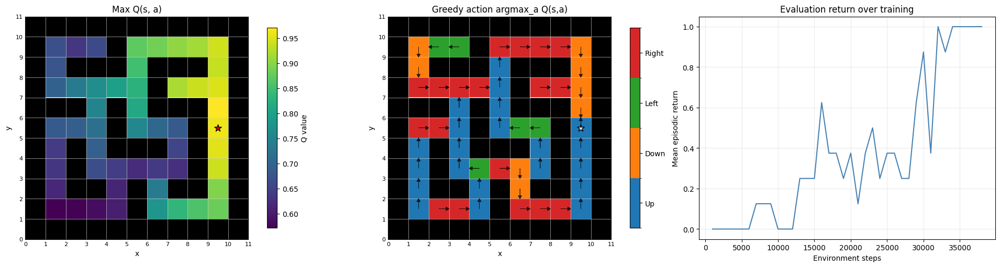

Embedding mode: all_discrete
states_base: (52, 2)
coords_base: (52, 2)
phi(s,a) base: (52, 4, 64)
psi(z) / task code base: (1, 64)
phi(s,a) norms: mean=1.0000, std=0.0000
top 5 singular values: [3.5991137 3.0562189 2.5178208 2.254575  2.103094 ]
cumulative variance (first 5 dims): [0.23419562 0.4030672  0.5176811  0.6095815  0.6895474 ]
cos(phi(s,a), psi/task): mean=0.6949, std=0.1334


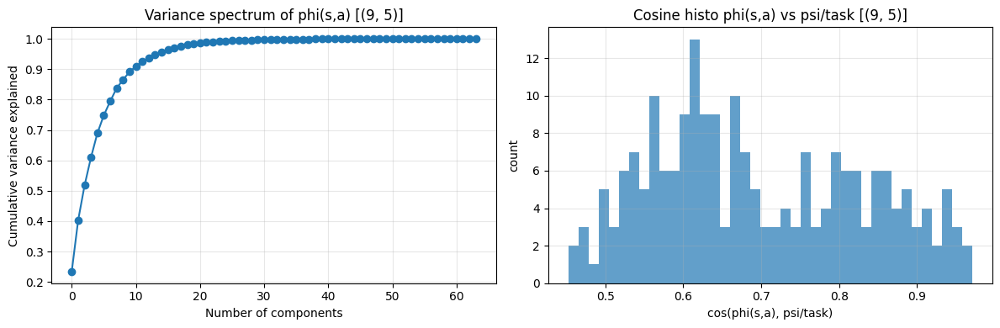


Goal embedding cosine similarity matrix:
     (7, 7)     (4, 1)     (1, 1)     (2, 5)     (5, 3)     (1, 3)     (3, 1)     (9, 5)
  (7, 7)      1.000      1.000      0.881      0.964      1.000      0.768      0.789      0.963
  (4, 1)      1.000      1.000      0.886      0.966      1.000      0.774      0.795      0.960
  (1, 1)      0.881      0.886      1.000      0.975      0.886      0.980      0.959      0.721
  (2, 5)      0.964      0.966      0.975      1.000      0.967      0.911      0.907      0.856
  (5, 3)      1.000      1.000      0.886      0.967      1.000      0.775      0.796      0.960
  (1, 3)      0.768      0.774      0.980      0.911      0.775      1.000      0.961      0.567
  (3, 1)      0.789      0.795      0.959      0.907      0.796      0.961      1.000      0.606
  (9, 5)      0.963      0.960      0.721      0.856      0.960      0.567      0.606      1.000

Off-diagonal mean similarity: 0.878
Off-diagonal min similarity: 0.567
Off-diagonal max simi

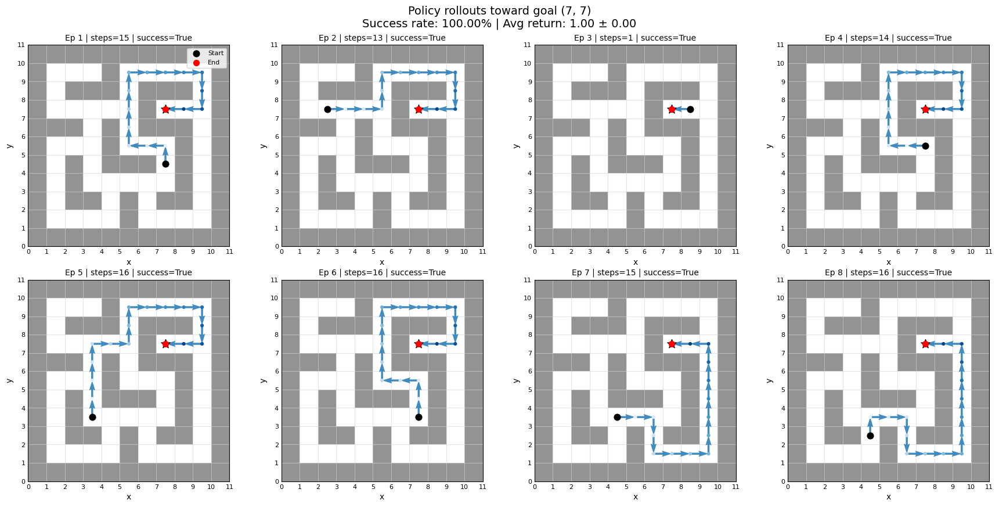

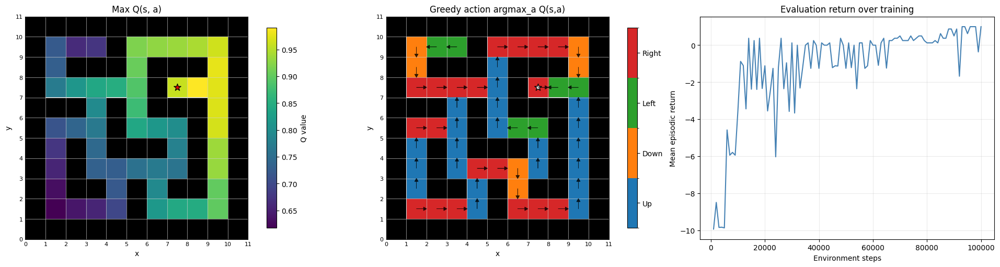

Embedding mode: all_discrete
states_base: (52, 2)
coords_base: (52, 2)
phi(s,a) base: (52, 4, 64)
psi(z) / task code base: (1, 64)
phi(s,a) norms: mean=1.0000, std=0.0000
top 5 singular values: [4.344439  4.0565963 2.9330204 2.0969818 2.054173 ]
cumulative variance (first 5 dims): [0.28268895 0.5291594  0.6580056  0.72386694 0.7870667 ]
cos(phi(s,a), psi/task): mean=0.7542, std=0.1224


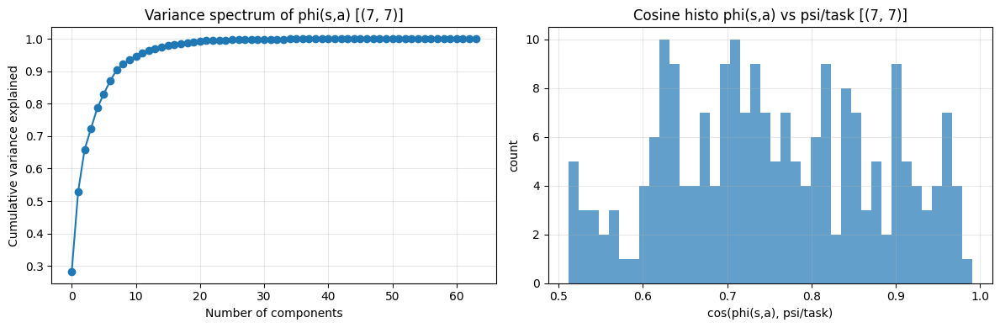


Goal embedding cosine similarity matrix:
     (7, 7)
  (7, 7)      1.000

----- seed=101112, goal=(4, 1) -----

Mean squared deltas (first few): [0.0, 0.0, 0.0, 0.0]
[DQN-factorised] step=   1000 | eps=0.981 | eval_return=0.000 | eval_len=100.0 | TD=0.000 | ReplayTD=0.000 | Ortho=0.000 | SigReg=0.000 | EWC=0.000000 | Loss=0.000| goal_reg_loss=0.0000
Mean squared deltas (first few): [0.0, 0.0, 0.0, 0.0]
[DQN-factorised] step=   2000 | eps=0.962 | eval_return=0.250 | eval_len=75.5 | TD=0.000 | ReplayTD=0.000 | Ortho=0.000 | SigReg=0.000 | EWC=0.000000 | Loss=0.000| goal_reg_loss=0.0000
Mean squared deltas (first few): [0.0, 0.0, 0.0, 0.0]
[DQN-factorised] step=   3000 | eps=0.943 | eval_return=0.000 | eval_len=100.0 | TD=0.000 | ReplayTD=0.000 | Ortho=0.000 | SigReg=0.000 | EWC=0.000000 | Loss=0.000| goal_reg_loss=0.0000
Mean squared deltas (first few): [0.0, 0.0, 0.0, 0.0]
[DQN-factorised] step=   4000 | eps=0.924 | eval_return=0.125 | eval_len=87.8 | TD=0.000 | ReplayTD=0.000 | Ortho=

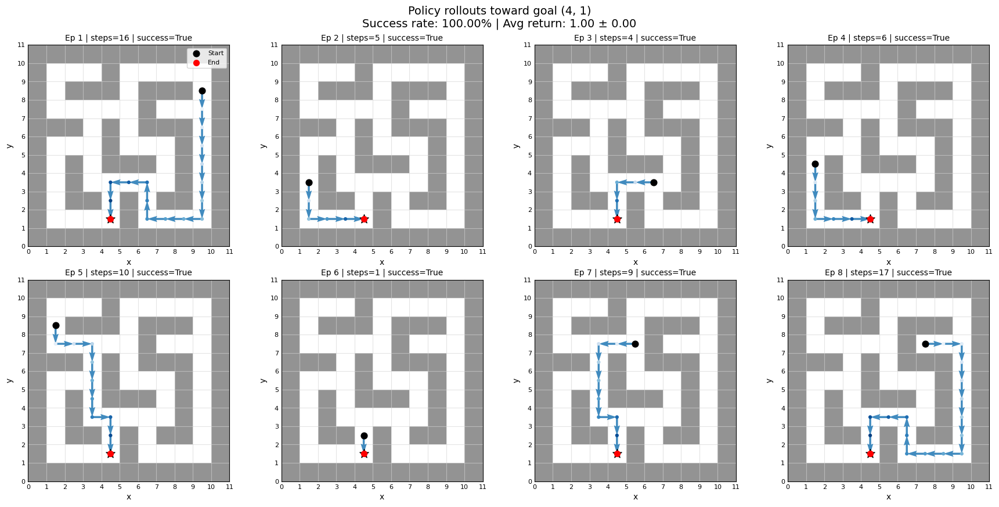

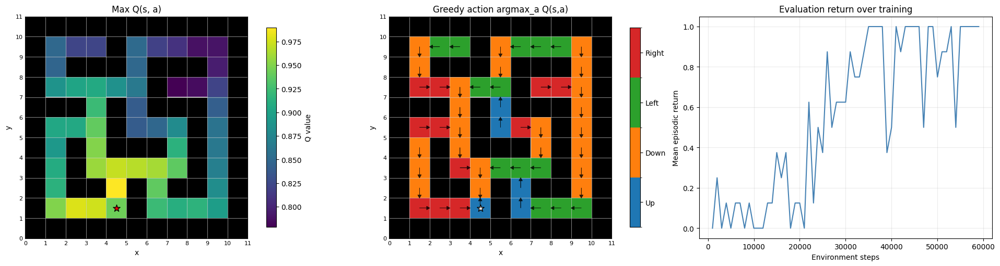

Embedding mode: all_discrete
states_base: (52, 2)
coords_base: (52, 2)
phi(s,a) base: (52, 4, 64)
psi(z) / task code base: (1, 64)
phi(s,a) norms: mean=1.0000, std=0.0000
top 5 singular values: [3.828734  3.2872267 2.5958219 2.3608603 2.2161503]
cumulative variance (first 5 dims): [0.25627115 0.44517842 0.5629767  0.66041505 0.7462744 ]
cos(phi(s,a), psi/task): mean=0.8233, std=0.0796


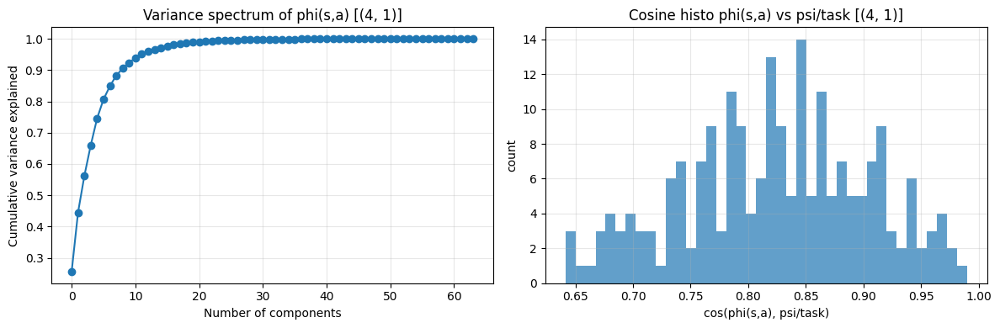


Goal embedding cosine similarity matrix:
     (7, 7)     (4, 1)
  (7, 7)      1.000      1.000
  (4, 1)      1.000      1.000

Off-diagonal mean similarity: 1.000
Off-diagonal min similarity: 1.000
Off-diagonal max similarity: 1.000

----- seed=101112, goal=(1, 1) -----

Mean squared deltas (first few): [0.0, 0.0, 0.0, 0.0]
[DQN-factorised] step=   1000 | eps=0.981 | eval_return=0.000 | eval_len=100.0 | TD=0.000 | ReplayTD=0.000 | Ortho=0.000 | SigReg=0.000 | EWC=0.000000 | Loss=0.000| goal_reg_loss=0.0000
Mean squared deltas (first few): [0.0, 0.0, 0.0, 0.0]
[DQN-factorised] step=   2000 | eps=0.962 | eval_return=0.000 | eval_len=100.0 | TD=0.000 | ReplayTD=0.000 | Ortho=0.000 | SigReg=0.000 | EWC=0.000000 | Loss=0.000| goal_reg_loss=0.0000
Mean squared deltas (first few): [0.0, 0.0, 0.0, 0.0]
[DQN-factorised] step=   3000 | eps=0.943 | eval_return=0.000 | eval_len=100.0 | TD=0.000 | ReplayTD=0.000 | Ortho=0.000 | SigReg=0.000 | EWC=0.000000 | Loss=0.000| goal_reg_loss=0.0000
Mean sq

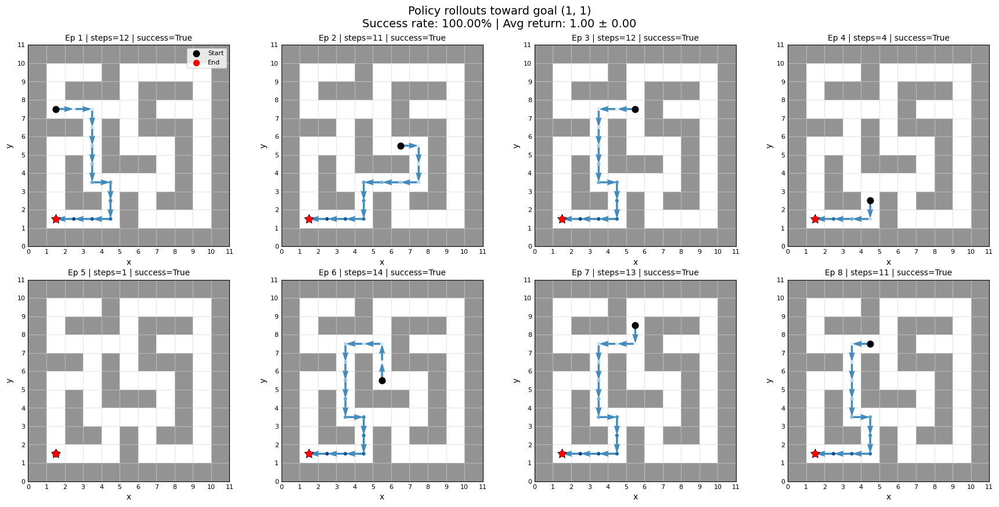

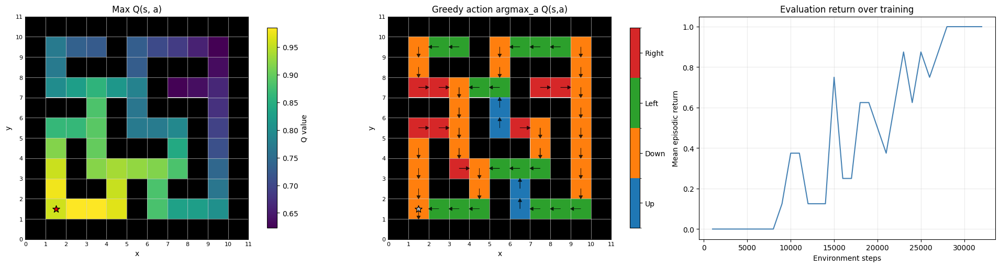

Embedding mode: all_discrete
states_base: (52, 2)
coords_base: (52, 2)
phi(s,a) base: (52, 4, 64)
psi(z) / task code base: (1, 64)
phi(s,a) norms: mean=1.0000, std=0.0000
top 5 singular values: [3.96364   3.314907  2.6504571 2.5507398 2.3447728]
cumulative variance (first 5 dims): [0.26259446 0.44626516 0.5636843  0.67243433 0.7643308 ]
cos(phi(s,a), psi/task): mean=0.7462, std=0.1196


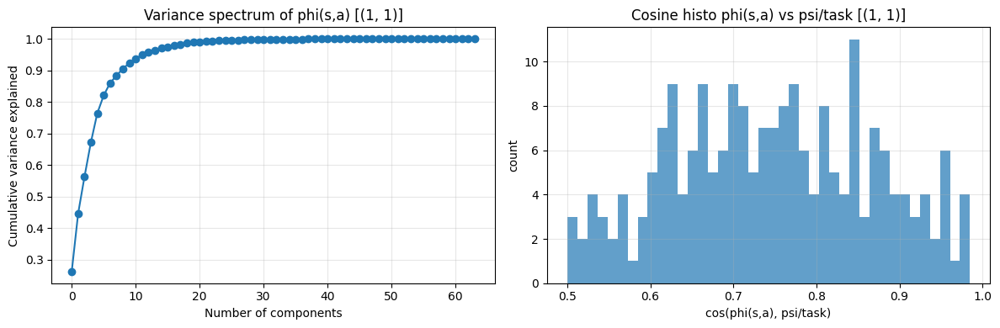


Goal embedding cosine similarity matrix:
     (7, 7)     (4, 1)     (1, 1)
  (7, 7)      1.000      1.000      0.883
  (4, 1)      1.000      1.000      0.887
  (1, 1)      0.883      0.887      1.000

Off-diagonal mean similarity: 0.923
Off-diagonal min similarity: 0.883
Off-diagonal max similarity: 1.000

----- seed=101112, goal=(2, 5) -----

Mean squared deltas (first few): [0.0, 0.0, 0.0, 0.0]
[DQN-factorised] step=   1000 | eps=0.981 | eval_return=0.125 | eval_len=87.6 | TD=0.000 | ReplayTD=0.000 | Ortho=0.000 | SigReg=0.000 | EWC=0.000000 | Loss=0.000| goal_reg_loss=0.0000
Mean squared deltas (first few): [0.0, 0.0, 0.0, 0.0]
[DQN-factorised] step=   2000 | eps=0.962 | eval_return=0.125 | eval_len=87.6 | TD=0.000 | ReplayTD=0.000 | Ortho=0.000 | SigReg=0.000 | EWC=0.000000 | Loss=0.000| goal_reg_loss=0.0000
Mean squared deltas (first few): [0.0, 0.0, 0.0, 0.0]
[DQN-factorised] step=   3000 | eps=0.943 | eval_return=0.000 | eval_len=100.0 | TD=0.000 | ReplayTD=0.000 | Ortho=0.000

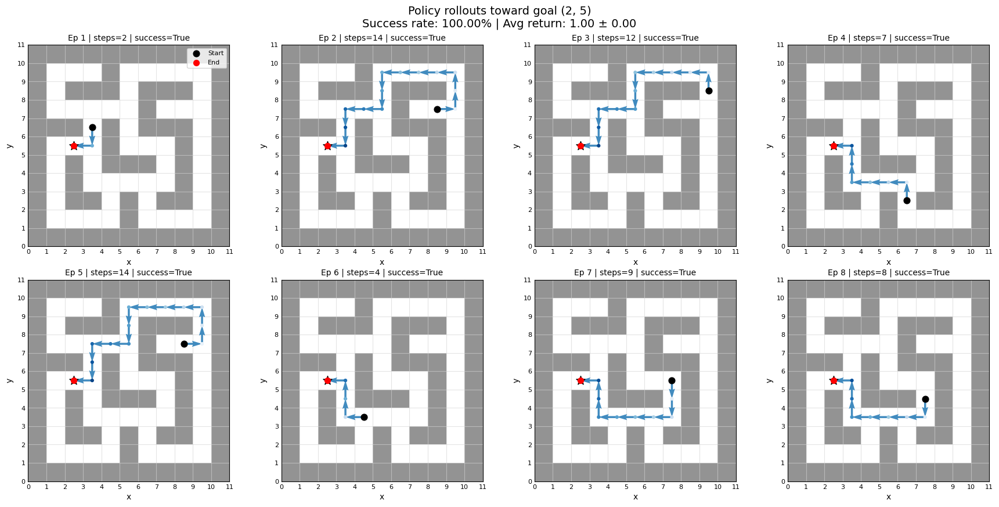

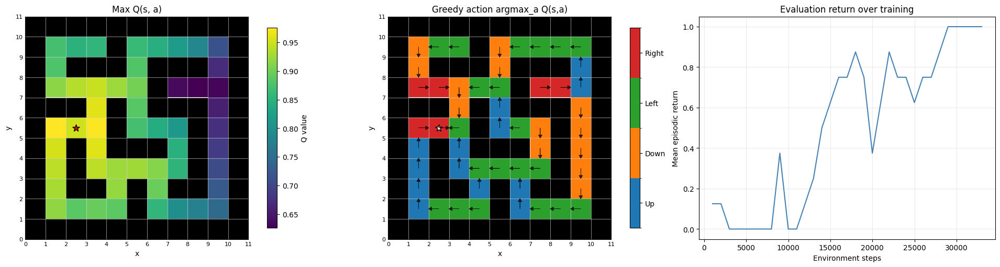

Embedding mode: all_discrete
states_base: (52, 2)
coords_base: (52, 2)
phi(s,a) base: (52, 4, 64)
psi(z) / task code base: (1, 64)
phi(s,a) norms: mean=1.0000, std=0.0000
top 5 singular values: [3.8903162 3.1330807 3.1029549 2.562897  2.412822 ]
cumulative variance (first 5 dims): [0.2376943  0.39186153 0.54307824 0.6462382  0.7376705 ]
cos(phi(s,a), psi/task): mean=0.7841, std=0.1156


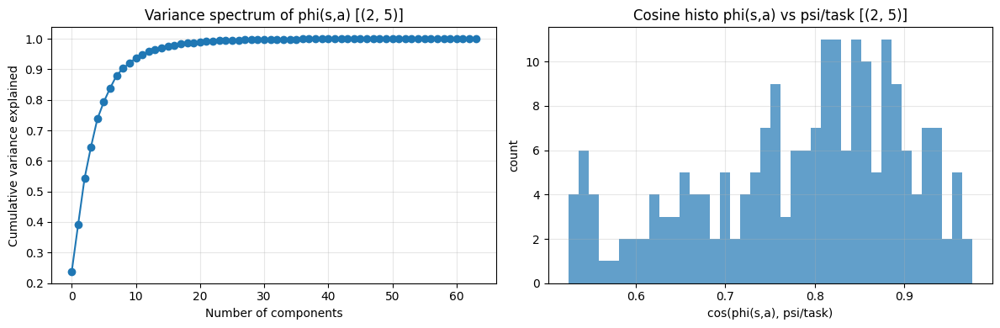


Goal embedding cosine similarity matrix:
     (7, 7)     (4, 1)     (1, 1)     (2, 5)
  (7, 7)      1.000      1.000      0.883      0.963
  (4, 1)      1.000      1.000      0.887      0.965
  (1, 1)      0.883      0.887      1.000      0.976
  (2, 5)      0.963      0.965      0.976      1.000

Off-diagonal mean similarity: 0.946
Off-diagonal min similarity: 0.883
Off-diagonal max similarity: 1.000

----- seed=101112, goal=(5, 3) -----

Mean squared deltas (first few): [0.0, 0.0, 0.0, 0.0]
[DQN-factorised] step=   1000 | eps=0.981 | eval_return=0.000 | eval_len=100.0 | TD=0.000 | ReplayTD=0.000 | Ortho=0.000 | SigReg=0.000 | EWC=0.000000 | Loss=0.000| goal_reg_loss=0.0000
Mean squared deltas (first few): [0.0, 0.0, 0.0, 0.0]
[DQN-factorised] step=   2000 | eps=0.962 | eval_return=0.000 | eval_len=100.0 | TD=0.000 | ReplayTD=0.000 | Ortho=0.000 | SigReg=0.000 | EWC=0.000000 | Loss=0.000| goal_reg_loss=0.0000
Mean squared deltas (first few): [0.0, 0.0, 0.0, 0.0]
[DQN-factorised] step

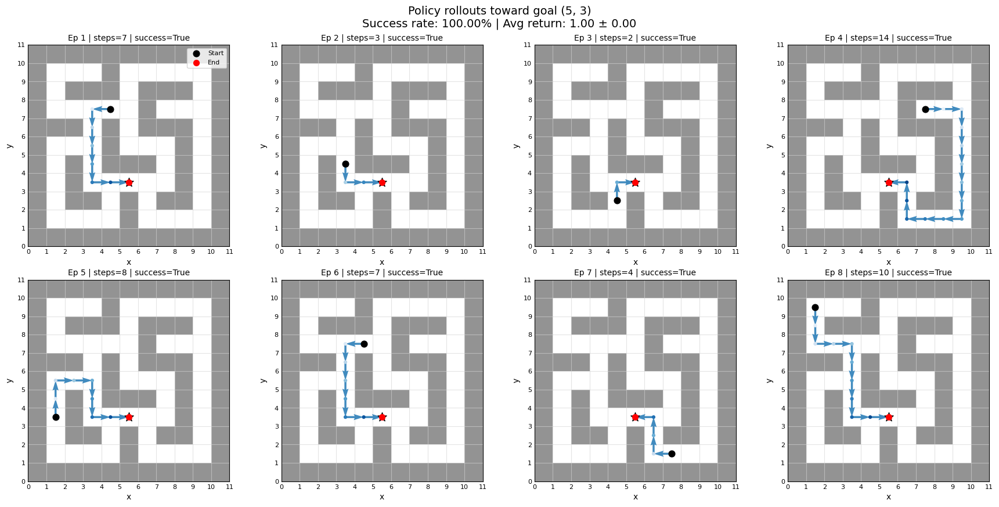

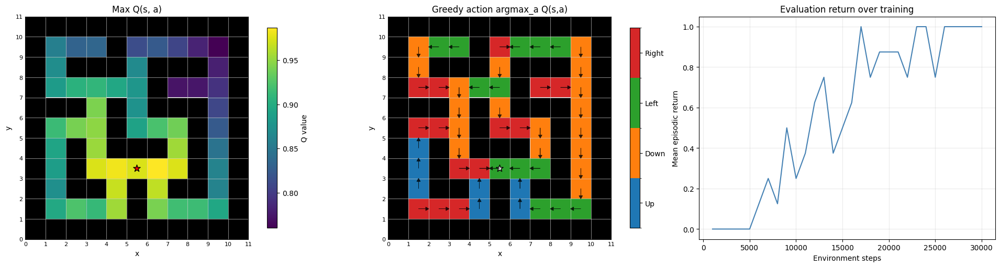

Embedding mode: all_discrete
states_base: (52, 2)
coords_base: (52, 2)
phi(s,a) base: (52, 4, 64)
psi(z) / task code base: (1, 64)
phi(s,a) norms: mean=1.0000, std=0.0000
top 5 singular values: [3.6014662 2.9953902 2.6375847 2.440598  2.3210404]
cumulative variance (first 5 dims): [0.23272839 0.39371789 0.5185435  0.6254202  0.72208226]
cos(phi(s,a), psi/task): mean=0.8275, std=0.0806


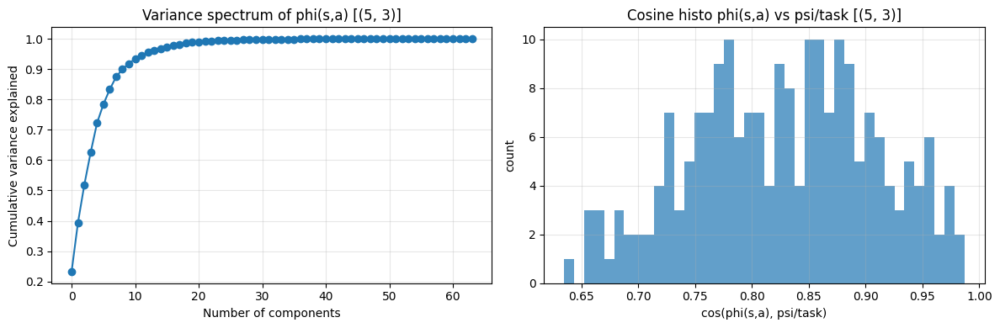


Goal embedding cosine similarity matrix:
     (7, 7)     (4, 1)     (1, 1)     (2, 5)     (5, 3)
  (7, 7)      1.000      1.000      0.883      0.963      1.000
  (4, 1)      1.000      1.000      0.887      0.965      1.000
  (1, 1)      0.883      0.887      1.000      0.976      0.888
  (2, 5)      0.963      0.965      0.976      1.000      0.966
  (5, 3)      1.000      1.000      0.888      0.966      1.000

Off-diagonal mean similarity: 0.953
Off-diagonal min similarity: 0.883
Off-diagonal max similarity: 1.000

----- seed=101112, goal=(1, 3) -----

Mean squared deltas (first few): [0.0, 0.0, 0.0, 0.0]
[DQN-factorised] step=   1000 | eps=0.981 | eval_return=0.000 | eval_len=100.0 | TD=0.000 | ReplayTD=0.000 | Ortho=0.000 | SigReg=0.000 | EWC=0.000000 | Loss=0.000| goal_reg_loss=0.0000
Mean squared deltas (first few): [0.0, 0.0, 0.0, 0.0]
[DQN-factorised] step=   2000 | eps=0.962 | eval_return=0.000 | eval_len=100.0 | TD=0.000 | ReplayTD=0.000 | Ortho=0.000 | SigReg=0.000 | EWC=

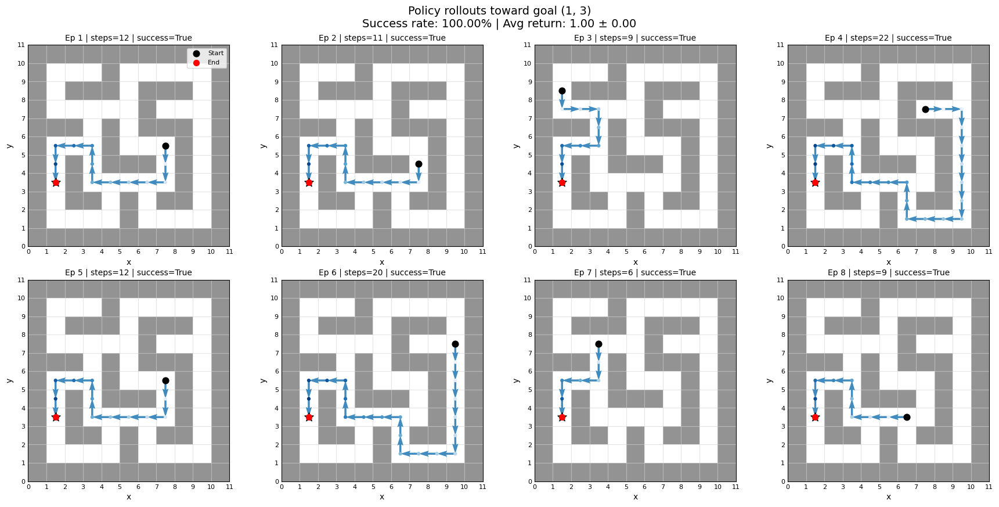

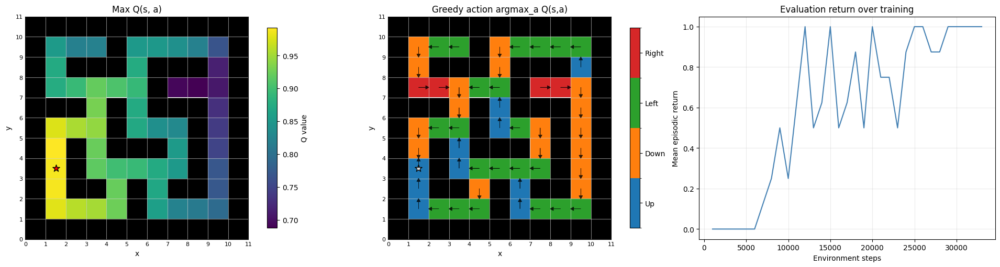

Embedding mode: all_discrete
states_base: (52, 2)
coords_base: (52, 2)
phi(s,a) base: (52, 4, 64)
psi(z) / task code base: (1, 64)
phi(s,a) norms: mean=1.0000, std=0.0000
top 5 singular values: [3.3738067 3.0631883 2.8122282 2.3958347 2.3264115]
cumulative variance (first 5 dims): [0.20676228 0.37720495 0.52086365 0.6251301  0.72344154]
cos(phi(s,a), psi/task): mean=0.7984, std=0.0960


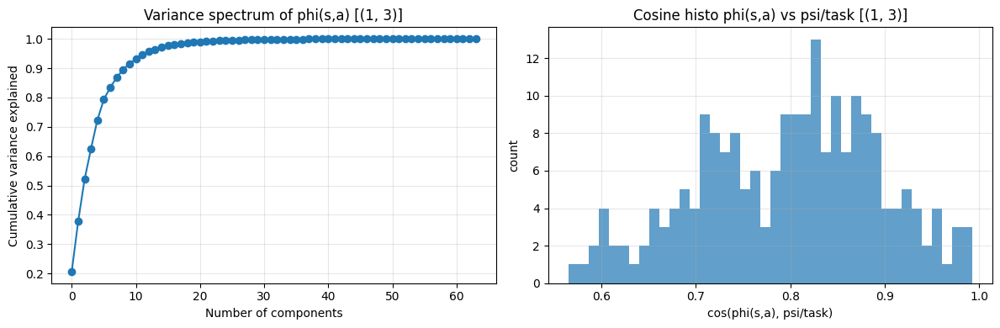


Goal embedding cosine similarity matrix:
     (7, 7)     (4, 1)     (1, 1)     (2, 5)     (5, 3)     (1, 3)
  (7, 7)      1.000      1.000      0.883      0.963      1.000      0.769
  (4, 1)      1.000      1.000      0.887      0.965      1.000      0.774
  (1, 1)      0.883      0.887      1.000      0.976      0.888      0.979
  (2, 5)      0.963      0.965      0.976      1.000      0.966      0.912
  (5, 3)      1.000      1.000      0.888      0.966      1.000      0.776
  (1, 3)      0.769      0.774      0.979      0.912      0.776      1.000

Off-diagonal mean similarity: 0.916
Off-diagonal min similarity: 0.769
Off-diagonal max similarity: 1.000

----- seed=101112, goal=(3, 1) -----

Mean squared deltas (first few): [0.0, 0.0, 0.0, 0.0]
[DQN-factorised] step=   1000 | eps=0.981 | eval_return=0.000 | eval_len=100.0 | TD=0.000 | ReplayTD=0.000 | Ortho=0.000 | SigReg=0.000 | EWC=0.000000 | Loss=0.000| goal_reg_loss=0.0000
Mean squared deltas (first few): [0.0, 0.0, 0.0, 0.0]
[

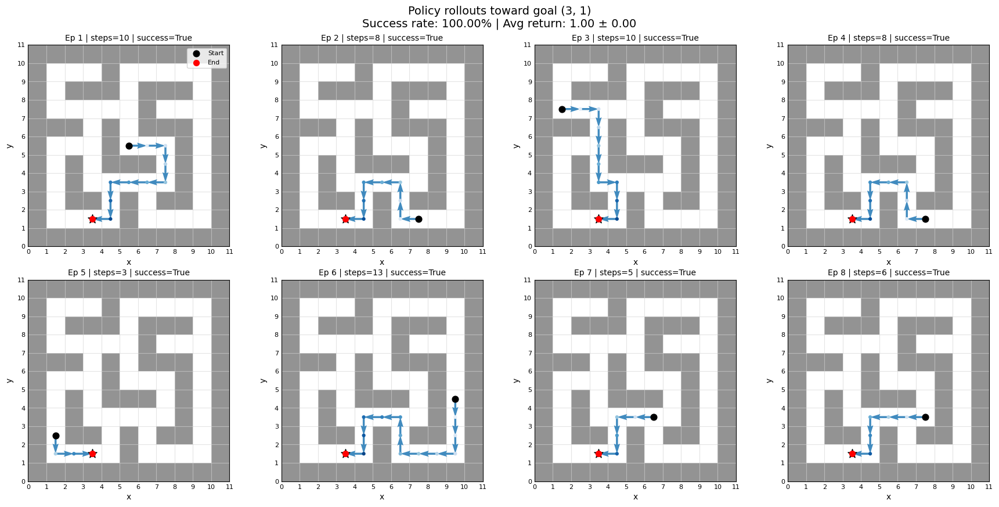

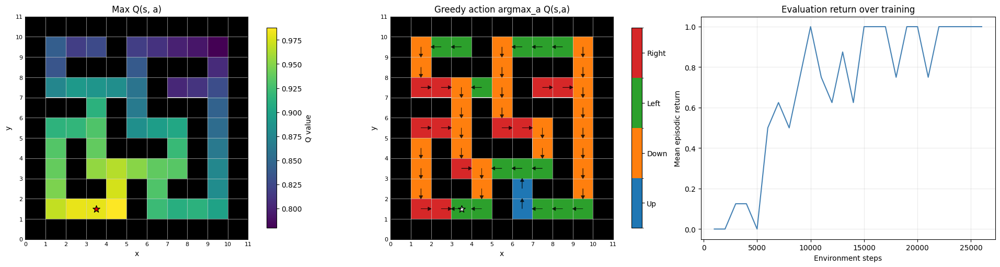

Embedding mode: all_discrete
states_base: (52, 2)
coords_base: (52, 2)
phi(s,a) base: (52, 4, 64)
psi(z) / task code base: (1, 64)
phi(s,a) norms: mean=1.0000, std=0.0000
top 5 singular values: [3.35149   2.9247541 2.5978851 2.5532086 2.3658624]
cumulative variance (first 5 dims): [0.20512472 0.36133903 0.48458764 0.60363364 0.7058502 ]
cos(phi(s,a), psi/task): mean=0.8294, std=0.0780


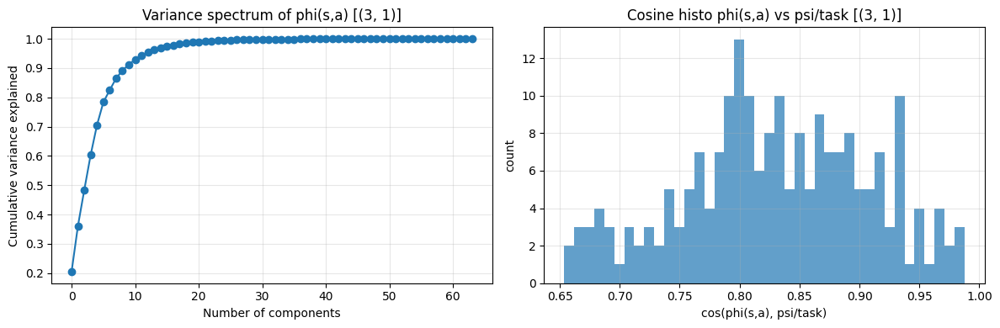


Goal embedding cosine similarity matrix:
     (7, 7)     (4, 1)     (1, 1)     (2, 5)     (5, 3)     (1, 3)     (3, 1)
  (7, 7)      1.000      1.000      0.883      0.963      1.000      0.769      0.790
  (4, 1)      1.000      1.000      0.887      0.965      1.000      0.774      0.794
  (1, 1)      0.883      0.887      1.000      0.976      0.888      0.979      0.953
  (2, 5)      0.963      0.965      0.976      1.000      0.966      0.912      0.905
  (5, 3)      1.000      1.000      0.888      0.966      1.000      0.776      0.795
  (1, 3)      0.769      0.774      0.979      0.912      0.776      1.000      0.953
  (3, 1)      0.790      0.794      0.953      0.905      0.795      0.953      1.000

Off-diagonal mean similarity: 0.901
Off-diagonal min similarity: 0.769
Off-diagonal max similarity: 1.000

----- seed=101112, goal=(9, 5) -----

Mean squared deltas (first few): [0.0, 0.0, 0.0, 0.0]
[DQN-factorised] step=   1000 | eps=0.981 | eval_return=0.000 | eval_len=100.0

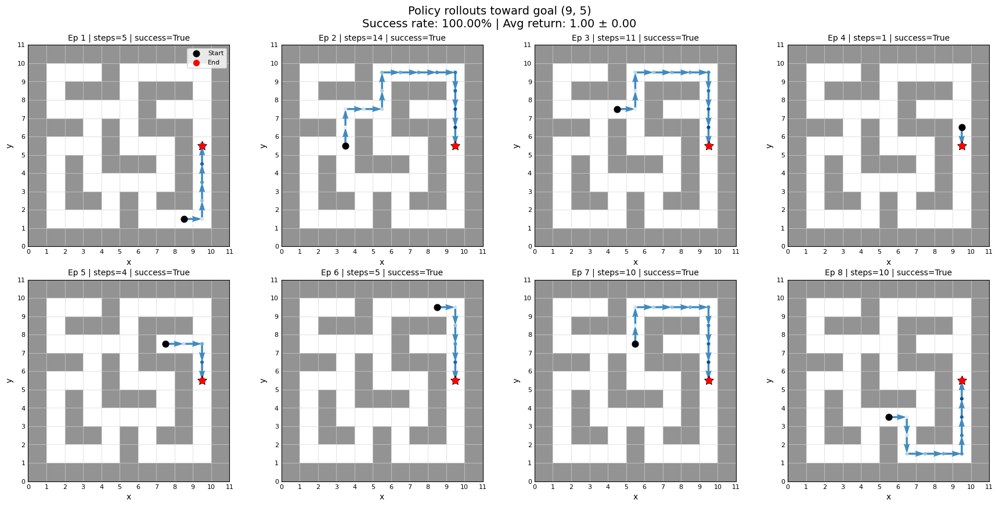

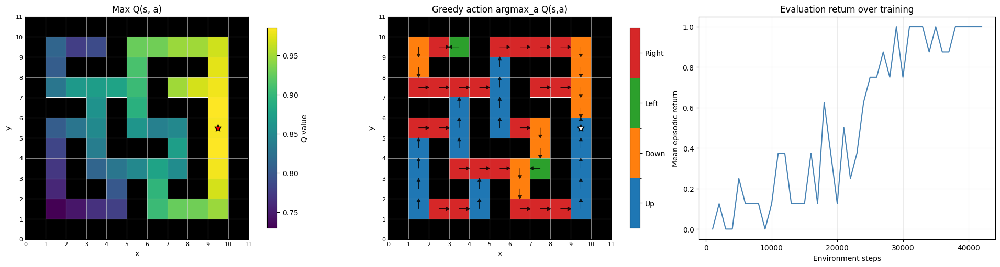

Embedding mode: all_discrete
states_base: (52, 2)
coords_base: (52, 2)
phi(s,a) base: (52, 4, 64)
psi(z) / task code base: (1, 64)
phi(s,a) norms: mean=1.0000, std=0.0000
top 5 singular values: [3.397006  2.9519343 2.8141055 2.507007  2.131039 ]
cumulative variance (first 5 dims): [0.21386927 0.37536803 0.52213776 0.6386219  0.7227883 ]
cos(phi(s,a), psi/task): mean=0.8111, std=0.0897


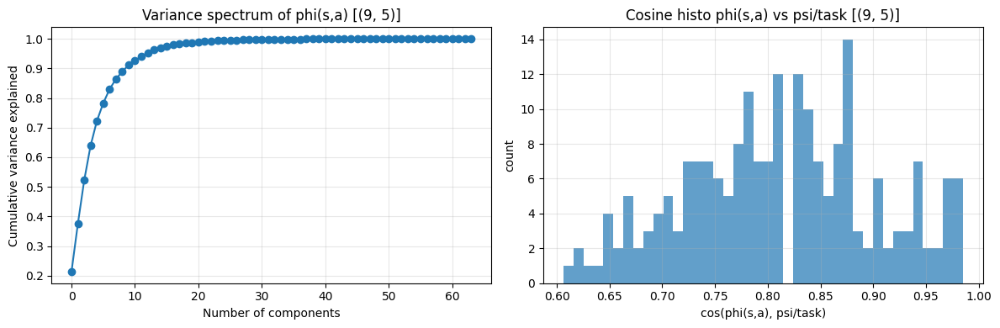


Goal embedding cosine similarity matrix:
     (7, 7)     (4, 1)     (1, 1)     (2, 5)     (5, 3)     (1, 3)     (3, 1)     (9, 5)
  (7, 7)      1.000      1.000      0.883      0.963      1.000      0.769      0.790      0.966
  (4, 1)      1.000      1.000      0.887      0.965      1.000      0.774      0.794      0.964
  (1, 1)      0.883      0.887      1.000      0.976      0.888      0.979      0.953      0.731
  (2, 5)      0.963      0.965      0.976      1.000      0.966      0.912      0.905      0.861
  (5, 3)      1.000      1.000      0.888      0.966      1.000      0.776      0.795      0.963
  (1, 3)      0.769      0.774      0.979      0.912      0.776      1.000      0.953      0.577
  (3, 1)      0.790      0.794      0.953      0.905      0.795      0.953      1.000      0.619
  (9, 5)      0.966      0.964      0.731      0.861      0.963      0.577      0.619      1.000

Off-diagonal mean similarity: 0.879
Off-diagonal min similarity: 0.577
Off-diagonal max simi

In [3]:
SEEDS = [42, 123, 456, 789, 101112]
# GOALS = [(9, 9), (7, 7), (3, 5), (3, 9), (5, 5), (3,6), (9,1), (1,1), (7,4), (9,8),(9,7)]

NUM_GOALS = 8
goal_rng = np.random.default_rng(0)   # same curriculum for all seeds
GOALS = sample_goals(NUM_GOALS, goal_rng)
print("Sampled GOALS:", GOALS)

BUFFER_CAPACITY = 100000
LR = float(1e-3)
REG_ALPHA = 0.1

sa_keywords_local = ["sa_encoder"]
goal_keywords_local = ["goal_encoder"]

overall_results = {
    goal: {
        "eval_returns": [],
        "min_steps": [],
        "min_time": [],
        "task_embeddings": [],
        "sa_embeddings": [],
        "sa_fixed_probe_embeddings": [],
        "sa_batches_final": [],
    }
    for goal in GOALS
}

seed_artifacts = {}
per_seed_goal_metrics = {}

for seed in SEEDS:
    print(f"\n================ SEED {seed} ================\n")
    set_seed(seed)
    per_seed_goal_metrics[seed] = {}

    env_tmp = make_env(goal=GOALS[0])
    obs_dim = env_tmp.observation_space.shape[0]
    num_actions = env_tmp.action_space.n
    env_tmp.close()

    q_net_base = FactorisedDQN_QNetwork(
        obs_dim=obs_dim,
        num_actions=num_actions,
        goal_dim=2,
        hidden_dim=128,
        rep_dim=64,
    ).to(DEVICE)

    q_target_base = FactorisedDQN_QNetwork(
        obs_dim=obs_dim,
        num_actions=num_actions,
        goal_dim=2,
        hidden_dim=128,
        rep_dim=64,
    ).to(DEVICE)

    seed_task_embedding_memory = []
    seen_goals_memory = []
    seen_goal_labels = []

    weight_history = []
    prev_q_net = None
    prev_q_target = None
    cumulative_fisher = None
    prev_reference_params = None

    # replay memories for previous goals
    task_replay_memories = {}

    for goal_idx, goal in enumerate(GOALS):
        print(f"\n----- seed={seed}, goal={goal} -----\n")

        if goal_idx == 0:
            q_net = deepcopy(q_net_base)
            q_target = deepcopy(q_target_base)
            q_target.load_state_dict(q_net.state_dict())

            for p in q_net.parameters():
                p.requires_grad_(True)

            trainable_params = None
            fisher_for_this_goal = None
            reference_for_this_goal = None
        else:
            if prev_q_net is None or prev_q_target is None:
                raise ValueError("Previous Q-networks are not available for transfer learning.")

            q_net = deepcopy(prev_q_net)
            q_target = deepcopy(prev_q_target)
            q_target.load_state_dict(q_net.state_dict())

            fisher_for_this_goal = cumulative_fisher
            reference_for_this_goal = prev_reference_params

            for p in q_net.parameters():
                p.requires_grad_(True)

            trainable_params = [p for p in q_net.parameters() if p.requires_grad]

        weight_history.append(
            collect_weight_snapshot(
                qnet=q_net,
                goal_label=goal,
                stage_label=f"goal_{goal_idx}_before_train_{goal}",
                sa_keywords_local=sa_keywords_local,
                goal_keywords_local=goal_keywords_local,
                max_samples_per_group=40000,
            )
        )

        previous_task_buffers = {
            g: b for g, b in task_replay_memories.items() if g != goal
        }

        current_regulariser = None if len(seed_task_embedding_memory) == 0 else "goal_memory_contrastive"

        (
            q_network,
            q_target_network,
            eval_returns,
            min_steps,
            min_time,
            task_embedding,
            sa_embedding_mean,
            sa_embedding_fixed,
            sa_batch_final,
            buffer,
        ) = dqn_train_multi_loss(
            seed=seed,
            q_network=q_net,
            q_target_network=q_target,
            env=make_env(goal=goal),
            obs_dim=obs_dim,
            buffer_capacity=BUFFER_CAPACITY,
            lr=LR,
            goal=goal,
            device=DEVICE,
            embedding_memory=seed_task_embedding_memory,
            memory_goals=seen_goals_memory,
            regulariser=current_regulariser,
            reg_alpha=REG_ALPHA,
            params=trainable_params,
            reference_params=reference_for_this_goal,
            fisher_diag=fisher_for_this_goal,
            sa_reg_prefix_filter="sa_encoder",
            make_env=make_env,
            replay_task_buffers=previous_task_buffers,
            replay_ratio=0.25,
            replay_tasks_per_batch=2,
            replay_loss_coef=1.0,
        )

        weight_history.append(
            collect_weight_snapshot(
                qnet=q_network,
                goal_label=goal,
                stage_label=f"goal_{goal_idx}_after_train_{goal}",
                sa_keywords_local=sa_keywords_local,
                goal_keywords_local=goal_keywords_local,
                max_samples_per_group=40000,
            )
        )

        visualise_q_table(goal, q_network, eval_returns=eval_returns, device=DEVICE, make_env=make_env)
        visualise_embeddings(goal, q_network, device=DEVICE, make_env=make_env)

        seed_task_embedding_memory.append(task_embedding)
        seen_goals_memory.append(goal)
        seen_goal_labels.append(str(goal))

        print_goal_embedding_similarity(
            seed_task_embedding_memory,
            goal_labels=seen_goal_labels
        )

        current_reference = snapshot_named_parameters(q_network, prefix_filter="sa_encoder")
        current_fisher = estimate_fisher_diag(
            model=q_network,
            target_model=q_target_network,
            replay_buffer=buffer,
            goal=goal,
            num_actions=num_actions,
            device=DEVICE,
            gamma=0.99,
            batch_size=256,
            n_batches=64,
            prefix_filter="sa_encoder",
        )

        if cumulative_fisher is None:
            cumulative_fisher = current_fisher
        else:
            for name, F_t in current_fisher.items():
                if name in cumulative_fisher:
                    cumulative_fisher[name] = cumulative_fisher[name] + F_t
                else:
                    cumulative_fisher[name] = F_t.clone()

        prev_reference_params = current_reference
        prev_q_net = deepcopy(q_network)
        prev_q_target = deepcopy(q_target_network)

        # store this goal buffer for future replay
        task_replay_memories[goal] = buffer

        overall_results[goal]["eval_returns"].append(eval_returns)
        overall_results[goal]["min_steps"].append(min_steps)
        overall_results[goal]["min_time"].append(min_time)
        overall_results[goal]["task_embeddings"].append(task_embedding)
        overall_results[goal]["sa_embeddings"].append(sa_embedding_mean)
        overall_results[goal]["sa_fixed_probe_embeddings"].append(sa_embedding_fixed)
        overall_results[goal]["sa_batches_final"].append(sa_batch_final)

        per_seed_goal_metrics[seed][goal] = {
            "goal_idx": goal_idx,
            "min_steps": min_steps,
            "min_time": min_time,
            "eval_returns": eval_returns,
            "task_embedding": task_embedding,
        }

    seed_artifacts[seed] = {
        "goals": list(GOALS),
        "final_q_net": deepcopy(prev_q_net),
        "final_q_target": deepcopy(prev_q_target),
        "task_replay_memories": deepcopy(task_replay_memories),
        "task_embeddings": deepcopy(seed_task_embedding_memory),
        "seen_goals_memory": deepcopy(seen_goals_memory),
        "weight_history": deepcopy(weight_history),
        "per_seed_goal_metrics": deepcopy(per_seed_goal_metrics[seed]),
    }

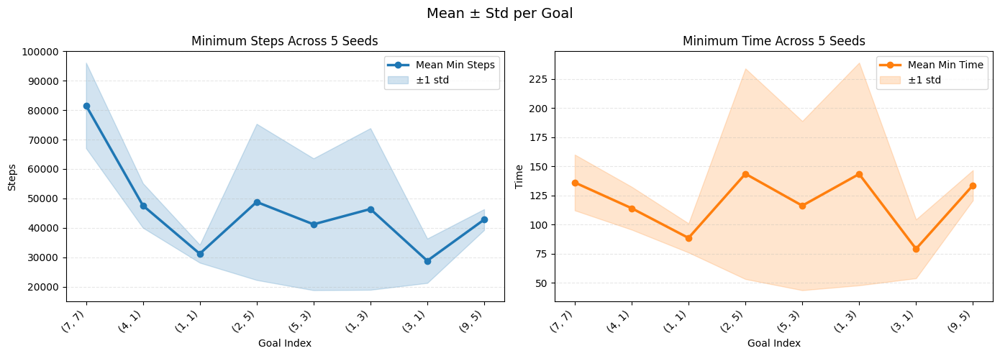

In [4]:
plot_min_steps_and_min_time(overall_results=overall_results, seeds=SEEDS)

## New Goal Test. 
Random sample goals from free cells, and check the embeddings. No training. This is to check the Spatial knowledge on psi(g)

Trained goals: [(7, 7), (4, 1), (1, 1), (2, 5), (5, 3), (1, 3), (3, 1), (9, 5)]
New goals: [(1, 8), (6, 2), (5, 8)]

===== New-goal analysis for seed=42 =====
Pearson  r   = 0.7179, p = 7.8339e-05
Spearman rho = 0.6462, p = 6.4726e-04

===== New-goal analysis for seed=123 =====
Pearson  r   = 0.5807, p = 2.9277e-03
Spearman rho = 0.5047, p = 1.1897e-02

===== New-goal analysis for seed=456 =====
Pearson  r   = 0.6143, p = 1.4039e-03
Spearman rho = 0.6152, p = 1.3780e-03

===== New-goal analysis for seed=789 =====
Pearson  r   = 0.6150, p = 1.3826e-03
Spearman rho = 0.5846, p = 2.6993e-03

===== New-goal analysis for seed=101112 =====
Pearson  r   = 0.6677, p = 3.6348e-04
Spearman rho = 0.6488, p = 6.0492e-04

===== Aggregated across seeds =====
Per-seed Pearson r values:    [0.7179 0.5807 0.6143 0.615  0.6677]
Per-seed Spearman rho values: [0.6462 0.5047 0.6152 0.5846 0.6488]
Mean Pearson r   (Fisher-z pooled): 0.6418
Std  Pearson r   (raw across seeds): 0.0539
Mean Spearman rho (Fishe

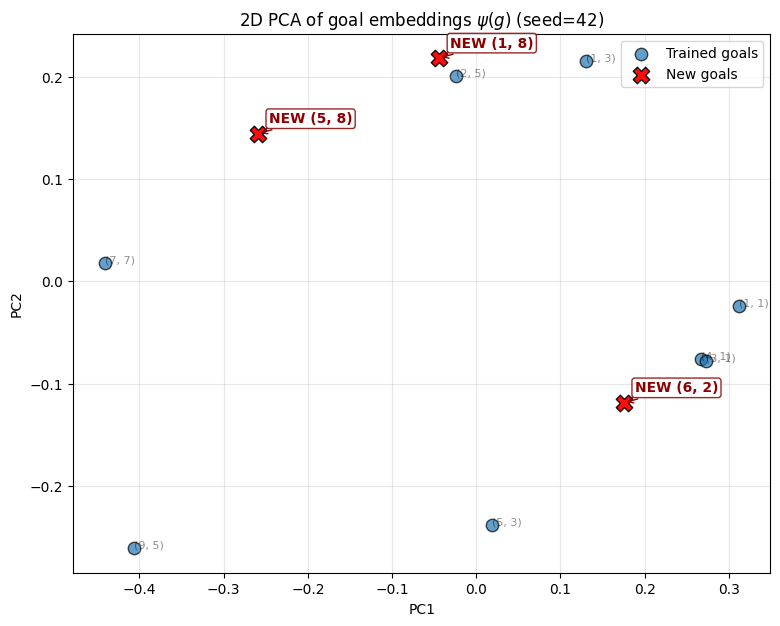

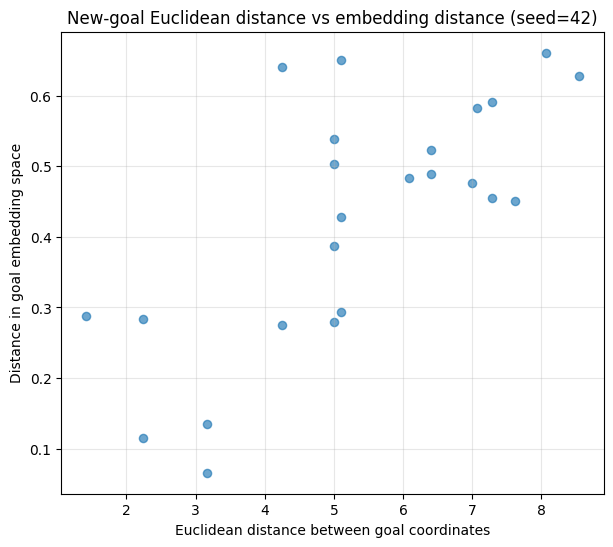

In [5]:
from sklearn.decomposition import PCA
from scipy.stats import pearsonr, spearmanr

NUM_NEW_GOALS = 3
new_goal_rng = np.random.default_rng(999)

TRAINED_GOALS = list(GOALS)
NEW_GOALS = sample_goals(NUM_NEW_GOALS, new_goal_rng, exclude=TRAINED_GOALS)

print("Trained goals:", TRAINED_GOALS)
print("New goals:", NEW_GOALS)

# ------------------------------------------------------------
# Per-seed analysis
# ------------------------------------------------------------
seed_level_results = {}

for seed in SEEDS:
    print(f"\n===== New-goal analysis for seed={seed} =====")

    q_network_analysis = deepcopy(seed_artifacts[seed]["final_q_net"]).to(DEVICE)
    q_network_analysis.eval()

    plot_goals = TRAINED_GOALS + NEW_GOALS
    goal_embeddings = []
    goal_types = []

    with torch.no_grad():
        for goal in TRAINED_GOALS:
            emb = q_network_analysis.encode_goal(
                torch.tensor(goal, dtype=torch.float32, device=DEVICE).unsqueeze(0)
            ).detach().cpu().numpy().squeeze(0)
            goal_embeddings.append(emb)
            goal_types.append("trained")

        for goal in NEW_GOALS:
            emb = q_network_analysis.encode_goal(
                torch.tensor(goal, dtype=torch.float32, device=DEVICE).unsqueeze(0)
            ).detach().cpu().numpy().squeeze(0)
            goal_embeddings.append(emb)
            goal_types.append("new")

    goal_embeddings = np.array(goal_embeddings)
    plot_goals = np.array(plot_goals, dtype=object)
    goal_types = np.array(goal_types)

    trained_mask = goal_types == "trained"
    new_mask = goal_types == "new"

    maze_dists = []
    embed_dists = []
    pair_names = []

    trained_indices = np.where(trained_mask)[0]
    new_indices = np.where(new_mask)[0]

    for i in new_indices:
        g_new = np.array(plot_goals[i], dtype=float)

        for j in trained_indices:
            g_train = np.array(plot_goals[j], dtype=float)

            maze_dist = np.linalg.norm(g_new - g_train)
            embed_dist = np.linalg.norm(goal_embeddings[i] - goal_embeddings[j])

            maze_dists.append(maze_dist)
            embed_dists.append(embed_dist)
            pair_names.append((tuple(g_new.astype(int)), tuple(g_train.astype(int))))

    maze_dists = np.array(maze_dists, dtype=float)
    embed_dists = np.array(embed_dists, dtype=float)

    pearson_corr, pearson_p = pearsonr(maze_dists, embed_dists)
    spearman_corr, spearman_p = spearmanr(maze_dists, embed_dists)

    seed_level_results[seed] = {
        "goal_embeddings": goal_embeddings,
        "plot_goals": plot_goals,
        "goal_types": goal_types,
        "maze_dists": maze_dists,
        "embed_dists": embed_dists,
        "pair_names": pair_names,
        "pearson_r": pearson_corr,
        "pearson_p": pearson_p,
        "spearman_rho": spearman_corr,
        "spearman_p": spearman_p,
    }

    print(f"Pearson  r   = {pearson_corr:.4f}, p = {pearson_p:.4e}")
    print(f"Spearman rho = {spearman_corr:.4f}, p = {spearman_p:.4e}")

# ------------------------------------------------------------
# Aggregate across seeds
# ------------------------------------------------------------
pearson_rs = np.array([seed_level_results[s]["pearson_r"] for s in SEEDS], dtype=float)
spearman_rhos = np.array([seed_level_results[s]["spearman_rho"] for s in SEEDS], dtype=float)

# Fisher-z average for Pearson r
pearson_rs_clipped = np.clip(pearson_rs, -0.999999, 0.999999)
pearson_z = np.arctanh(pearson_rs_clipped)
pearson_r_mean = np.tanh(np.mean(pearson_z))
pearson_r_std = np.std(pearson_rs, ddof=1) if len(pearson_rs) > 1 else 0.0

# Fisher-z average for Spearman rho as a practical summary too
spearman_rhos_clipped = np.clip(spearman_rhos, -0.999999, 0.999999)
spearman_z = np.arctanh(spearman_rhos_clipped)
spearman_rho_mean = np.tanh(np.mean(spearman_z))
spearman_rho_std = np.std(spearman_rhos, ddof=1) if len(spearman_rhos) > 1 else 0.0

print("\n===== Aggregated across seeds =====")
print("Per-seed Pearson r values:   ", np.round(pearson_rs, 4))
print("Per-seed Spearman rho values:", np.round(spearman_rhos, 4))
print(f"Mean Pearson r   (Fisher-z pooled): {pearson_r_mean:.4f}")
print(f"Std  Pearson r   (raw across seeds): {pearson_r_std:.4f}")
print(f"Mean Spearman rho (Fisher-z pooled): {spearman_rho_mean:.4f}")
print(f"Std  Spearman rho (raw across seeds): {spearman_rho_std:.4f}")

# ------------------------------------------------------------
# Visualise one representative seed
# ------------------------------------------------------------
SEED_FOR_PLOT = SEEDS[0]
plot_goals = seed_level_results[SEED_FOR_PLOT]["plot_goals"]
goal_embeddings = seed_level_results[SEED_FOR_PLOT]["goal_embeddings"]
goal_types = seed_level_results[SEED_FOR_PLOT]["goal_types"]
maze_dists = seed_level_results[SEED_FOR_PLOT]["maze_dists"]
embed_dists = seed_level_results[SEED_FOR_PLOT]["embed_dists"]

pca = PCA(n_components=2)
goal_embeddings_2d = pca.fit_transform(goal_embeddings)

print(f"\nRepresentative plot seed: {SEED_FOR_PLOT}")
print("PCA explained variance ratio:", pca.explained_variance_ratio_)
print("Total explained variance (2D):", pca.explained_variance_ratio_.sum())

plt.figure(figsize=(9, 7))

trained_mask = goal_types == "trained"
new_mask = goal_types == "new"

plt.scatter(
    goal_embeddings_2d[trained_mask, 0],
    goal_embeddings_2d[trained_mask, 1],
    c="tab:blue",
    s=80,
    alpha=0.7,
    label="Trained goals",
    edgecolor="k",
)

plt.scatter(
    goal_embeddings_2d[new_mask, 0],
    goal_embeddings_2d[new_mask, 1],
    c="red",
    s=140,
    alpha=0.95,
    label="New goals",
    edgecolor="k",
    marker="X",
)

for i, goal in enumerate(plot_goals):
    x, y = goal_embeddings_2d[i]
    if goal_types[i] == "trained":
        plt.text(x, y, str(tuple(goal)), fontsize=8, alpha=0.45)

for i, goal in enumerate(plot_goals):
    if goal_types[i] == "new":
        x, y = goal_embeddings_2d[i]
        plt.annotate(
            f"NEW {tuple(goal)}",
            xy=(x, y),
            xytext=(8, 8),
            textcoords="offset points",
            fontsize=10,
            fontweight="bold",
            color="darkred",
            bbox=dict(boxstyle="round,pad=0.2", fc="white", ec="darkred", alpha=0.85),
            arrowprops=dict(arrowstyle="->", color="darkred", lw=1),
        )

plt.title(f"2D PCA of goal embeddings $\\psi(g)$ (seed={SEED_FOR_PLOT})")
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.grid(True, alpha=0.3)
plt.legend()
plt.show()

plt.figure(figsize=(7, 6))
plt.scatter(maze_dists, embed_dists, alpha=0.65, s=35)
plt.xlabel("Euclidean distance between goal coordinates")
plt.ylabel("Distance in goal embedding space")
plt.title(f"New-goal Euclidean distance vs embedding distance (seed={SEED_FOR_PLOT})")
plt.grid(True, alpha=0.3)
plt.show()

## Backward Tasks Fine-tuning
Because embeddings have changed, to successfully achieve the earlier tasks, fine-tuning is needed.

In [6]:
# =========================
# Backward Tasks Fine-tuning
# Retrain old goals starting from each seed's FINAL model
# Freeze phi = sa_encoder, retrain the rest
# =========================

RETRAIN_LR = 1e-4
RETRAIN_GOALS_MODE = "all"   # "early", "all", or "custom"
RETRAIN_NUM_EARLY = 3
RETRAIN_CUSTOM_GOALS = []    # only used if RETRAIN_GOALS_MODE == "custom"

def freeze_sa_encoder_only(model):
    for name, p in model.named_parameters():
        p.requires_grad_(True)
        if name.startswith("sa_encoder"):
            p.requires_grad_(False)

    trainable_params = [p for p in model.parameters() if p.requires_grad]

    if len(trainable_params) == 0:
        raise ValueError("No trainable params left after freezing sa_encoder.")

    return trainable_params

# Same structure as the original overall_results, so your plot function can be reused
overall_results_retrain = {
    goal: {
        "eval_returns": [],
        "min_steps": [],
        "min_time": [],
        "task_embeddings": [],
        "sa_embeddings": [],
        "sa_fixed_probe_embeddings": [],
        "sa_batches_final": [],
    }
    for goal in GOALS
}

# Baseline vs retrain comparison
retrain_comparison = {
    goal: {
        "baseline_min_steps": [],
        "baseline_min_time": [],
        "retrain_min_steps": [],
        "retrain_min_time": [],
        "steps_ratio": [],
        "time_ratio": [],
    }
    for goal in GOALS
}

for seed in SEEDS:
    print(f"\n================ BACKWARD RETRAIN SEED {seed} ================\n")
    set_seed(seed)

    if seed not in seed_artifacts:
        raise ValueError(f"Missing seed_artifacts for seed {seed}. Run the main training loop first.")

    env_tmp = make_env(goal=GOALS[0])
    obs_dim = env_tmp.observation_space.shape[0]
    num_actions = env_tmp.action_space.n
    env_tmp.close()

    seed_goals = seed_artifacts[seed]["goals"]
    final_q_net = deepcopy(seed_artifacts[seed]["final_q_net"]).to(DEVICE)
    final_q_target = deepcopy(seed_artifacts[seed]["final_q_target"]).to(DEVICE)
    final_q_target.load_state_dict(final_q_net.state_dict())

    if RETRAIN_GOALS_MODE == "early":
        retrain_goals = seed_goals[:RETRAIN_NUM_EARLY]
    elif RETRAIN_GOALS_MODE == "all":
        retrain_goals = seed_goals[:-1]
    elif RETRAIN_GOALS_MODE == "custom":
        retrain_goals = RETRAIN_CUSTOM_GOALS
    else:
        raise ValueError(f"Unknown RETRAIN_GOALS_MODE: {RETRAIN_GOALS_MODE}")

    for goal in retrain_goals:
        print(f"\n----- backward retrain: seed={seed}, goal={goal} -----\n")

        q_net = deepcopy(final_q_net).to(DEVICE)
        q_target = deepcopy(final_q_target).to(DEVICE)
        q_target.load_state_dict(q_net.state_dict())

        trainable_params = freeze_sa_encoder_only(q_net)

        (
            q_network_ft,
            q_target_network_ft,
            eval_returns_ft,
            min_steps_ft,
            min_time_ft,
            task_embedding_ft,
            sa_embedding_mean_ft,
            sa_embedding_fixed_ft,
            sa_batch_final_ft,
            buffer_ft,
        ) = dqn_train_multi_loss(
            seed=seed,
            q_network=q_net,
            q_target_network=q_target,
            env=make_env(goal=goal),
            obs_dim=obs_dim,
            buffer_capacity=BUFFER_CAPACITY,
            lr=RETRAIN_LR,
            goal=goal,
            device=DEVICE,
            embedding_memory=[],
            regulariser=None,
            reg_alpha=1,
            params=trainable_params,
            reference_params=None,
            fisher_diag=None,
            sa_reg_prefix_filter="sa_encoder",
            make_env=make_env,
            replay_task_buffers=None,
            replay_ratio=0.0,
            replay_tasks_per_batch=0,
            replay_loss_coef=0.0,
        )

        overall_results_retrain[goal]["eval_returns"].append(eval_returns_ft)
        overall_results_retrain[goal]["min_steps"].append(min_steps_ft)
        overall_results_retrain[goal]["min_time"].append(min_time_ft)
        overall_results_retrain[goal]["task_embeddings"].append(task_embedding_ft)
        overall_results_retrain[goal]["sa_embeddings"].append(sa_embedding_mean_ft)
        overall_results_retrain[goal]["sa_fixed_probe_embeddings"].append(sa_embedding_fixed_ft)
        overall_results_retrain[goal]["sa_batches_final"].append(sa_batch_final_ft)

        baseline = per_seed_goal_metrics[seed][goal]

        steps_ratio = None
        time_ratio = None

        if baseline["min_steps"] is not None and min_steps_ft is not None:
            steps_ratio = min_steps_ft / baseline["min_steps"]

        if baseline["min_time"] is not None and min_time_ft is not None:
            time_ratio = min_time_ft / baseline["min_time"]

        retrain_comparison[goal]["baseline_min_steps"].append(baseline["min_steps"])
        retrain_comparison[goal]["baseline_min_time"].append(baseline["min_time"])
        retrain_comparison[goal]["retrain_min_steps"].append(min_steps_ft)
        retrain_comparison[goal]["retrain_min_time"].append(min_time_ft)
        retrain_comparison[goal]["steps_ratio"].append(steps_ratio)
        retrain_comparison[goal]["time_ratio"].append(time_ratio)

        print(
            f"[seed={seed} goal={goal}] "
            f"baseline_steps={baseline['min_steps']} | retrain_steps={min_steps_ft} | "
            f"steps_ratio={steps_ratio}"
        )
        print(
            f"[seed={seed} goal={goal}] "
            f"baseline_time={baseline['min_time']} | retrain_time={min_time_ft} | "
            f"time_ratio={time_ratio}"
        )

# Optional: reuse your existing plot function
plot_min_steps_and_min_time(overall_results=overall_results_retrain, seeds=SEEDS)

# =========================
# Summary across seeds
# =========================

print("\n===== Backward retrain summary (freeze sa_encoder only) =====\n")

goal_summaries = {}

for goal in GOALS:
    base_steps = np.array(
        [x for x in retrain_comparison[goal]["baseline_min_steps"] if x is not None],
        dtype=float,
    )
    base_time = np.array(
        [x for x in retrain_comparison[goal]["baseline_min_time"] if x is not None],
        dtype=float,
    )
    retrain_steps = np.array(
        [x for x in retrain_comparison[goal]["retrain_min_steps"] if x is not None],
        dtype=float,
    )
    retrain_time = np.array(
        [x for x in retrain_comparison[goal]["retrain_min_time"] if x is not None],
        dtype=float,
    )
    steps_ratios = np.array(
        [x for x in retrain_comparison[goal]["steps_ratio"] if x is not None],
        dtype=float,
    )
    time_ratios = np.array(
        [x for x in retrain_comparison[goal]["time_ratio"] if x is not None],
        dtype=float,
    )

    summary = {
        "n_seeds_steps": int(steps_ratios.size),
        "n_seeds_time": int(time_ratios.size),
        "baseline_steps_mean": float(base_steps.mean()) if base_steps.size > 0 else None,
        "baseline_steps_std": float(base_steps.std(ddof=1)) if base_steps.size > 1 else 0.0,
        "baseline_time_mean": float(base_time.mean()) if base_time.size > 0 else None,
        "baseline_time_std": float(base_time.std(ddof=1)) if base_time.size > 1 else 0.0,
        "retrain_steps_mean": float(retrain_steps.mean()) if retrain_steps.size > 0 else None,
        "retrain_steps_std": float(retrain_steps.std(ddof=1)) if retrain_steps.size > 1 else 0.0,
        "retrain_time_mean": float(retrain_time.mean()) if retrain_time.size > 0 else None,
        "retrain_time_std": float(retrain_time.std(ddof=1)) if retrain_time.size > 1 else 0.0,
        "steps_ratio_mean": float(steps_ratios.mean()) if steps_ratios.size > 0 else None,
        "steps_ratio_std": float(steps_ratios.std(ddof=1)) if steps_ratios.size > 1 else 0.0,
        "time_ratio_mean": float(time_ratios.mean()) if time_ratios.size > 0 else None,
        "time_ratio_std": float(time_ratios.std(ddof=1)) if time_ratios.size > 1 else 0.0,
    }

    goal_summaries[goal] = summary

    print(
        f"Goal {goal}: "
        f"baseline_steps_mean={summary['baseline_steps_mean']}, "
        f"retrain_steps_mean={summary['retrain_steps_mean']}, "
        f"steps_ratio_mean={summary['steps_ratio_mean']}, "
        f"n={summary['n_seeds_steps']}"
    )
    print(
        f"          baseline_time_mean={summary['baseline_time_mean']}, "
        f"retrain_time_mean={summary['retrain_time_mean']}, "
        f"time_ratio_mean={summary['time_ratio_mean']}, "
        f"n={summary['n_seeds_time']}\n"
    )


================ BACKWARD RETRAIN SEED 42 ================


----- backward retrain: seed=42, goal=(7, 7) -----

[DQN-factorised] step=   1000 | eps=0.981 | eval_return=1.000 | eval_len=11.9 | TD=0.000 | ReplayTD=0.000 | Ortho=0.000 | SigReg=0.000 | EWC=0.000000 | Loss=0.000| goal_reg_loss=0.0000
[DQN-factorised] step=   2000 | eps=0.962 | eval_return=1.000 | eval_len=9.6 | TD=0.000 | ReplayTD=0.000 | Ortho=0.000 | SigReg=0.000 | EWC=0.000000 | Loss=0.000| goal_reg_loss=0.0000
[DQN-factorised] step=   3000 | eps=0.943 | eval_return=1.000 | eval_len=12.5 | TD=0.000 | ReplayTD=0.000 | Ortho=0.000 | SigReg=0.000 | EWC=0.000000 | Loss=0.000| goal_reg_loss=0.0000
[DQN-factorised] step=   4000 | eps=0.924 | eval_return=1.000 | eval_len=13.5 | TD=0.000 | ReplayTD=0.000 | Ortho=0.000 | SigReg=0.000 | EWC=0.000000 | Loss=0.000| goal_reg_loss=0.0000
[DQN-factorised] step=   5000 | eps=0.905 | eval_return=1.000 | eval_len=11.2 | TD=0.004 | ReplayTD=0.000 | Ortho=0.000 | SigReg=0.993 | EWC=0.0000

KeyboardInterrupt: 

In [ ]:
plot_min_steps_and_min_time(overall_results=overall_results_retrain, seeds=SEEDS)

In [ ]:
def plot_train_vs_retrain_steps(
    overall_results_train,
    overall_results_retrain,
    seeds=None,
    metric="min_steps",
    title=None,
):
    import numpy as np
    import matplotlib.pyplot as plt

    common_goals = [
        goal for goal in overall_results_train.keys()
        if goal in overall_results_retrain
    ]

    used_goals = []
    train_mean = []
    train_std = []
    retrain_mean = []
    retrain_std = []

    for goal in common_goals:
        train_raw = overall_results_train[goal].get(metric, [])
        retrain_raw = overall_results_retrain[goal].get(metric, [])

        train_arr = np.array(
            [np.nan if x is None else x for x in train_raw],
            dtype=float
        ).flatten()

        retrain_arr = np.array(
            [np.nan if x is None else x for x in retrain_raw],
            dtype=float
        ).flatten()

        if np.all(np.isnan(train_arr)) or np.all(np.isnan(retrain_arr)):
            print(f"[WARN] Skipping goal {goal}: all values missing in train or retrain")
            continue

        used_goals.append(goal)
        train_mean.append(np.nanmean(train_arr))
        train_std.append(np.nanstd(train_arr))
        retrain_mean.append(np.nanmean(retrain_arr))
        retrain_std.append(np.nanstd(retrain_arr))

    if not used_goals:
        raise ValueError("No overlapping goals with valid train/retrain data found.")

    x = np.arange(len(used_goals))
    train_mean = np.array(train_mean)
    train_std = np.array(train_std)
    retrain_mean = np.array(retrain_mean)
    retrain_std = np.array(retrain_std)

    fig, ax = plt.subplots(figsize=(12, 5))

    ax.plot(
        x, train_mean,
        color="tab:blue",
        marker="o",
        linewidth=2.5,
        label="Train"
    )
    ax.fill_between(
        x,
        train_mean - train_std,
        train_mean + train_std,
        color="tab:blue",
        alpha=0.18
    )

    ax.plot(
        x, retrain_mean,
        color="tab:red",
        marker="s",
        linewidth=2.5,
        label="Retrain"
    )
    ax.fill_between(
        x,
        retrain_mean - retrain_std,
        retrain_mean + retrain_std,
        color="tab:red",
        alpha=0.18
    )

    ax.set_xticks(x)
    ax.set_xticklabels([str(g) for g in used_goals], rotation=45, ha="right")
    ax.set_xlabel("Goal")
    ax.set_ylabel("Steps" if metric == "min_steps" else "Time")

    if title is None:
        n_seeds = len(seeds) if seeds is not None else "N"
        metric_name = "Steps" if metric == "min_steps" else "Time"
        title = f"Train vs Retrain {metric_name} Across {n_seeds} Seeds"

    ax.set_title(title)
    ax.grid(True, axis="y", linestyle="--", alpha=0.3)
    ax.legend(loc="best")

    fig.tight_layout()
    plt.show()

plot_train_vs_retrain_steps(
    overall_results_train=overall_results,
    overall_results_retrain=overall_results_retrain,
    seeds=SEEDS,
    metric="min_steps",
    title="Train vs Retrain Minimum Steps"
)

plot_train_vs_retrain_steps(
    overall_results_train=overall_results,
    overall_results_retrain=overall_results_retrain,
    seeds=SEEDS,
    metric="min_time",
    title="Train vs Retrain Minimum Time"
)

## HTML visualisation

In [ ]:
for goal, data in overall_results.items():
    print(goal)
    print("task_embeddings:", len(data.get("task_embeddings", [])))
    print("sa_fixed_probe_embeddings:", len(data.get("sa_fixed_probe_embeddings", [])))
    print("sa_batches_final:", len(data.get("sa_batches_final", [])))

dashboard = plot_full_embedding_dashboard_2d_html(
    overall_results=overall_results,
    qnet=q_network,
    mode="all",
    save_html="plots/full_embedding_dashboard_maze_combined_loss.html",
    weights_his=weight_history,
)

print(dashboard["save_html"])
print(dashboard["isotropy_metrics"])